# Use nearest neighbours and multi-layer perceptron with Barney's ratio data

## Table of contents

-Introduction: [>>](#Introduction)  
-Notes: [>>](#Notes)  
--ToDo: [>>](#ToDo)  
-Paper data: [>>](#Paper-data)  
-The usual import statements: [>>](#The-usual-import-statements)  
-Get data used in paper: [>>](#Get-data-used-in-paper)  
-Select image: [>>](#Select-image)  
-Set up file names, load cube: [>>](#Set-up-file-names,-load-cube)  
-Some plotting routines: [>>](#Some-plotting-routines)  
-Plot hyperspectral image at chosen wavenumber: [>>](#Plot-hyperspectral-image-at-chosen-wavenumber)  
-Plot spectrum in chosen pixel: [>>](#Plot-spectrum-in-chosen-pixel)  
-Look at corresponding processed spectrum: [>>](#Look-at-corresponding-processed-spectrum)  
-Plot FTIR image with non-transforming/transforming (N/T) pixels marked: [>>](#Plot-FTIR-image-with-non-transforming/transforming-(N/T)-pixels-marked)  
-Make tissue mask: [>>](#Make-tissue-mask)  
-Make N/T mask: [>>](#Make-N/T-mask)  
-Plot spectra from N/T pixels: [>>](#Plot-spectra-from-N/T-pixels)  
-Histogram absorbances at selected wavenumbers in regions: [>>](#Histogram-absorbances-at-selected-wavenumbers-in-regions)  
-Plot spectra from pixels in N/T tissue and surrounds: [>>](#Plot-spectra-from-pixels-in-N/T-tissue-and-surrounds)  
-Plot image using range of wavenumbers summed: [>>](#Plot-image-using-range-of-wavenumbers-summed)  
-Select wavenumbers: [>>](#Select-wavenumbers)  
-NN and MLP data: $X_D$ and $y_D$ arrays: [>>](#NN-and-MLP-data:-$X_D$-and-$y_D$-arrays)  
-Plot X_D as a set of images: [>>](#Plot-X_D-as-a-set-of-images)  
-NN analysis: [>>](#NN-analysis)  
-NN analysis: [>>](#NN-analysis)  
-Split data into training and test samples and scale: [>>](#Split-data-into-training-and-test-samples-and-scale)  
-Image training and test data: [>>](#Image-training-and-test-data)  
-Create new or load existing MLP and train: [>>](#Create-new-or-load-existing-MLP-and-train)  
-Look at MLP results: [>>](#Look-at-MLP-results)  
-Confusion matrix: [>>](#Confusion-matrix)  
-K nearest neighbours - optimise k: [>>](#K-nearest-neighbours---optimise-k)  
-Train with selected k: [>>](#Train-with-selected-k)  
-Test KNN: [>>](#Test-KNN)  
-Run analysis for one set of biopsies: [>>](#Run-analysis-for-one-set-of-biopsies)  

## Introduction

Non-transforming and transforming samples.

The FTIR data consists of absorbances $A_i$ at each of the measured wavenumbers $k_i$. The definition of absorbance is:

\begin{align}
A_i = \log_{10}\left[ \frac{I_{0, i}}{I_i} \right],
\end{align}

where $I_{0, i}$ is the input intensity (reference spectrum with no sample) at $k_i$ and $I_i$ the output intensity (spectrum measured with sample). The transmittance is defined as $T_i = \frac{I_i}{I_{0, i}}$, so the absorbance can also be defined as:

\begin{align}
A_i = \log_{10}\left[ \frac{1}{T_i} \right].
\end{align}

Ratios can be local or global (steered using the logical variables `local_ratio`, `local_diff`, `global_prod` and `global_sum`). In the local case, the input absorbances $A_i$, with $i$ running from 0 to $N$, are normalised as follows:

\begin{align}
X_i &= \frac{A_i}{A_{i-1}}.
\end{align}

An alternative is to use:

\begin{align}
X_i &= A_i - A_{i-1} \\
    &= \log_{10}\left[\frac{I_{0, i}}{I_i} \right] - \log_{10}\left[\frac{I_{0, i - 1}}{I_{i- 1}} \right] \\
    &= \log_{10}\left[ \frac{I_{0, i}}{I_i} \frac{I_{i - 1}}{I_{0, i - 1}} \right] \\
    &= \log_{10}\left[ \frac{I_{i- 1} }{I_i } \right].
\end{align}

Here, in the last step it has been assumed that the input intensity is wavenumber independent, or depends only slowly on wavenumber. This may not be true if the atmosphere in the spectrometer contains water vapour, carbon dioxide etc. 

Global product normalisation uses the following approach:

\begin{align}
X_i &= \frac{A_i}{\exp\left[\frac{1}{N}\sum_{i = 0}^N \log A_i \right]} \\
    &= \frac{A_i}{\left(\prod_{i = 0}^N A_i \right)^\frac{1}{N}}.
\end{align}

Again, an alternative is:

\begin{align}
X_i &= A_i - \frac{1}{N} \sum_{i = 0}^N A_i.
\end{align}

Global sum normalisation uses the following approach:

\begin{align}
X_i &= \frac{A_i}{\frac{1}{N}\sum_{i = 0}^N \log A_i}.
\end{align}

These should be systematically studied. If these normalisations are used, should the resulting variables still be standardised? Are there any better ways of preparing the data?

## Notes 

A heath warning. This notebook mercilessly exploits the python scoping rules. It could do with a serious tidy up to make things safer and more transparent! 

### ToDo

Improve determination of image mask?  
Set up to test non-transforming and transforming samples using non-transforming and transforming samples not used in training.

## Paper data 

Read paper data file which contains information on malignancy of regions of images and final spectra.

Rename the `x_pos` and `y_pos` columns as `col` and `row`, respectively, to avoid the usual confusions, and reorder the dataframe.

## The usual import statements

In [1]:
import datetime
now = datetime.datetime.now()
nb_start = now
print("Date and time ",str(now))
#
import os
os.environ["OMP_NUM_THREADS"] = "64" # export OMP_NUM_THREADS
os.environ["OPENBLAS_NUM_THREADS"] = "64" # export OPENBLAS_NUM_THREADS
os.environ["MKL_NUM_THREADS"] = "64" # export MKL_NUM_THREADS
os.environ["VECLIB_MAXIMUM_THREADS"] = "64" # export VECLIB_MAXIMUM_THREADS
os.environ["NUMEXPR_NUM_THREADS"] = "64" # export NUMEXPR_NUM_THREADS
#
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.colors as colors
import matplotlib.ticker
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import Colormap
import pandas as pd
import PIL.Image
#
PIL.Image.MAX_IMAGE_PIXELS = 933120000
#
%matplotlib inline
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:19.132310
 
Date and time 2025-05-03 14:16:19.723038
Time since last check is 0:00:00.590728


## Get data used in paper

In [2]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
# Path to paper data
#folder = "C:/Users/green/OneDrive - The University of Liverpool/SciaScan/BarneysData/"
folder = '/Users/oliviashuter/MPhys/YEAR 4/MPhys Project/New Analysis/BarneysData/'
#folder = "~green/OneDrive/OneDocuments/Liverpool/SciaScanData/BarneysData/"
Paper_file = folder + "paper_data.csv"
#
df = pd.read_csv(Paper_file)
columns = df.columns[1:]
df = df[columns]
df.rename(columns={"x_pos": "col", "y_pos": "row"}, inplace = True)
columns = df.columns
new_cols = list(columns)
new_cols[4] = "row"
new_cols[5] = "col"
df = df.reindex(columns = new_cols)
print(" ")
print("Data as processed by Barney")
print(" ")
display(df)
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:19.725608
 
Data as processed by Barney
 


,biopsy,Image,outcome,Class,row,col,999.0,1001.0,1003.0,1005.0,...,1780.0,1782.0,1784.0,1786.0,1788.0,1790.0,1792.0,1793.0,1795.0,1797.0
0,12089,1,T,G5,138,80,0.075447,0.079953,0.080899,0.078262,...,0.048532,0.047844,0.047121,0.046660,0.046517,0.044935,0.044291,0.046186,0.048900,0.049373
1,12089,1,T,G5,136,81,0.079835,0.076427,0.072463,0.069700,...,0.042645,0.042844,0.041618,0.039884,0.039521,0.039352,0.038451,0.038881,0.040333,0.039569
2,12089,1,T,G5,137,81,0.070910,0.071105,0.074115,0.074365,...,0.026895,0.026940,0.026513,0.026201,0.026486,0.026010,0.025621,0.026279,0.026815,0.025707
3,12089,1,T,G5,138,81,0.053998,0.055204,0.057831,0.061552,...,0.015230,0.015400,0.015946,0.016272,0.016246,0.014928,0.013674,0.014140,0.015004,0.014257
4,12089,1,T,G5,129,82,0.075016,0.072010,0.074824,0.076888,...,0.051837,0.052630,0.052448,0.051592,0.051512,0.051128,0.051050,0.051192,0.051274,0.051016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65590,12366,1,NT,G1,52,128,0.044353,0.038733,0.035292,0.038292,...,0.032154,0.031081,0.032632,0.032783,0.030911,0.028728,0.029319,0.032134,0.032464,0.030956
65591,12366,1,NT,G1,53,128,0.039227,0.042345,0.044480,0.045998,...,0.032596,0.031716,0.031343,0.031571,0.031356,0.030001,0.029224,0.030659,0.032060,0.032150
65592,12366,1,NT,G1,55,128,0.040875,0.033792,0.029858,0.029534,...,0.027866,0.028208,0.027538,0.026662,0.027599,0.027083,0.027374,0.027808,0.025515,0.024197
65593,12366,1,NT,G1,56,128,0.034679,0.030386,0.033271,0.034194,...,0.035737,0.034542,0.033121,0.032729,0.031481,0.030650,0.030475,0.029507,0.028558,0.029403


 
Date and time 2025-05-03 14:16:21.144236
Time since last check is 0:00:01.418628


## Select image

Choose biopsy and identify transforming and non-transforming areas on image thereof using paper data.

In [3]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def select_image(i_bio):
    #
    bio_labels = []
    #
    # Transforming samples
    bio_labels.append(12089) # 0
    bio_labels.append(12104) # 1
    bio_labels.append(12127) # 2
    bio_labels.append(12195) # 3
    bio_labels.append(12201) # 4
    bio_labels.append(12219) # 5
    bio_labels.append(12248) # 6
    bio_labels.append(12257) # 7
    bio_labels.append(12260) # 8
    bio_labels.append(12263) # 9
    #
    # Non-transforming samples
    bio_labels.append(12098) # 10
    bio_labels.append(12141) # 11
    bio_labels.append(12162) # 12
    bio_labels.append(12181) # 13
    bio_labels.append(12329) # 14
    bio_labels.append(12330) # 15
    bio_labels.append(12332) # 16
    #
    n_biopsies = len(bio_labels)
    bio_label = bio_labels[i_bio]
    print(" ")
    print("Select biopsy for study")
    print("Number of biopsies available is",n_biopsies)
    print("Chosen biopsy has index",i_bio,"and label",bio_label)
    #
    row_NT = np.array(df.loc[(df['biopsy'] == bio_label) & (df['outcome'] == 'NT')].loc[:, 'row'])
    col_NT = np.array(df.loc[(df['biopsy'] == bio_label) & (df['outcome'] == 'NT')].loc[:, 'col'])
    row_T = np.array(df.loc[(df['biopsy'] == bio_label) & (df['outcome'] == 'T')].loc[:, 'row'])
    col_T = np.array(df.loc[(df['biopsy'] == bio_label) & (df['outcome'] == 'T')].loc[:, 'col'])
    #
    # Looks as though indices in dataframe run from 1, convert to Python indices.
    col_T = col_T - 1
    row_T = row_T - 1
    col_NT = col_NT - 1
    row_NT = row_NT - 1
    if len(row_T) > 0:
        b_type = 2
    elif len(row_NT) > 0:
        b_type = 1
    else:
        b_type = 0
    #
    print("Non-transforming area",len(col_NT),"pixels.")
    print("Transforming area",len(col_T),"pixels.")
    print("Biopsy type",b_type)
    print(" ")
    #
    return n_biopsies, bio_label, row_T, col_T, row_NT, col_NT, b_type
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.147747
 
Date and time 2025-05-03 14:16:21.148024
Time since last check is 0:00:00.000277


## Set up file names, load cube

Has to be done by hand as far as I can see!

In [4]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def get_file_and_cube(bio_label):
    #
    if bio_label == 12098:
        FTIR_file = "Hyperspectral_non-transformers/12098_1.npy"
        root_name = "H&E_images_non-transformers/3040B(12098)"
    elif bio_label == 12141:
        FTIR_file = "Hyperspectral_non-transformers/12141_1.npy"
        root_name = "H&E_images_non-transformers/3094(12141)"
    elif bio_label == 12162:
        FTIR_file = "Hyperspectral_non-transformers/12162_1.npy"
        root_name = "H&E_images_non-transformers/3525(12162)"
    elif bio_label == 12181:
        FTIR_file = "Hyperspectral_non-transformers/12181_1.npy"
        root_name = "H&E_images_non-transformers/3021B(12181)"
    elif bio_label == 12329:
        FTIR_file = "Hyperspectral_non-transformers/12329_2.npy"
        root_name = "H&E_images_non-transformers/3420A(12329)"
    elif bio_label == 12330:
        FTIR_file = "Hyperspectral_non-transformers/12330_3.npy"
        root_name = "H&E_images_non-transformers/3074(12330)"
    elif bio_label == 12332:
        FTIR_file = "Hyperspectral_non-transformers/12332_1.npy"
        root_name = "H&E_images_non-transformers/3077A(12332)"
    elif bio_label == 12089:
        FTIR_file = "Hyperspectral_transformers/12089_1.npy"
        root_name = "H&E_images_transformers/3089A(12089)"
    elif bio_label == 12104:
        FTIR_file = "Hyperspectral_transformers/12104_1.npy"
        root_name = "H&E_images_transformers/3001C(12104)"
    elif bio_label == 12127:
        FTIR_file = "Hyperspectral_transformers/12127_1.npy"
        root_name = "H&E_images_transformers/3437(12127)"
    elif bio_label == 12195:
        FTIR_file = "Hyperspectral_transformers/12195_1.npy"
        root_name = "H&E_images_transformers/3467A2(12195)"
    elif bio_label == 12201:
        FTIR_file = "Hyperspectral_transformers/12201_1.npy"
        root_name = "H&E_images_transformers/3256(12201)"
    elif bio_label == 12219:
        FTIR_file = "Hyperspectral_transformers/12219_2.npy"
        root_name = "H&E_images_transformers/3565(12219)"
    elif bio_label == 12248:
        FTIR_file = "Hyperspectral_transformers/12248_2.npy"
        root_name = "H&E_images_transformers/3290(12248)"
    elif bio_label == 12257:
        FTIR_file = "Hyperspectral_transformers/12257_1.npy"
        root_name = "H&E_images_transformers/3561(12257)"
    elif bio_label == 12260:
        FTIR_file = "Hyperspectral_transformers/12260_2.npy"
        root_name = "H&E_images_transformers/3470(12260)"
    elif bio_label == 12263:
        FTIR_file = "Hyperspectral_transformers/12263_2.npy"
        root_name = "H&E_images_transformers/3257(12263)"
    else:
        print(" ")
        print("Unknown image",bio_label)
        sys.exit(0)
    #
    FTIR_file = folder + FTIR_file
    wavenumber_file = folder + "wavenumbers.npy"
    root_name = folder + root_name
    #
    slide_file = root_name + '.svs'
    image_file = root_name + '.jpg'
    #
    # Load FTIR data and wavenumbers
    FTIR = np.load(FTIR_file)
    wavenumbers = np.load(wavenumber_file)[0, :]
    #
    print(" ")
    print("Get FTIR data")
    print("Looking at biposy with label",bio_label)
    print("Shape of FTIR image",FTIR.shape)
    print("Number of wavenumbers",wavenumbers.shape[0])
    #
    return FTIR_file, FTIR, wavenumbers
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.151476
 
Date and time 2025-05-03 14:16:21.151662
Time since last check is 0:00:00.000186


## Some plotting routines

In [5]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def limit_finder(*arrays, edge = 0): 
    '''
    Find upper and lower limits of list of arrays and return with plus and minus edge value,
    respectively, where edge is a proportion of the range.
    '''
    bot = 1e99
    top = -bot
    for array in arrays:
        bot = min(bot, np.amin(array))
        top = max(top, np.amax(array))
    range = top - bot
    lim = [bot - 0.05*range, top + 0.05*range]
    return lim
#
def plotter2d(ax, x, y, title = 'Plot', x_label = 'x', y_label = 'y', x_lim = [], y_lim = [],
              color = 'b', alpha = 1.0, grid_color = 'g', 
              linestyle = '-', marker = '', ms = None, label = '', 
              fill_bot = 0, fill_top = 0, fill_color = '', fill_alpha = 0.0):
    '''
    Given ax for subplot, x and y arrays, fill plot using lines/markers
    with symbols and colors (sorry!) as required.
    Pick limits if these are not set.
    Fill between further arrays if required, flag this using fill_alpha > 0.0 so can use various 
    color formats.
    '''
    #
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    #
    if grid_color !='':
        ax.grid(color = grid_color)
    #
    if len(x_lim) == 0:
        x_bot, x_top = np.amin(x), np.amax(x)
        if abs(x_bot - x_top) > 1e-66:
            x_range = np.amax(x) - np.amin(x)
            ax.set_xlim(x_bot - 0.05*x_range, x_top + 0.05*x_range)
    else:
        ax.set_xlim(x_lim[0], x_lim[1])
    #
    if len(y_lim) == 0:
        #y_bot, y_top = min(np.amin(y), np.amin(fill_bot)), max(np.amax(y), np.amax(fill_top))
        y_bot, y_top = np.amin(y), np.amax(y)
        if abs(y_bot - y_top) > 1e-66:
            y_range = np.amax(y) - np.amin(y)
            ax.set_ylim(y_bot - 0.05*y_range, y_top + 0.05*y_range)
    else:
        ax.set_ylim(y_lim[0], y_lim[1])        
    #
    ax.plot(x, y, linestyle = linestyle, color = color, marker = marker, ms = ms, label = label)
    #
    if fill_alpha > 0.0:
        ax.fill_between(x, fill_top, fill_bot, color = fill_color, alpha = fill_alpha)
    if label != '':
        ax.legend()
    #
    return
#
def image2d(ax, image, title = 'Image', x_label = 'Column', y_label = 'Row', 
            c_map = 'viridis', alpha = 1.0,
            q_min = 0.01, q_max = 0.99, v_min = None, v_max = None, 
            scale = 'linear', invert = False, axes_off = False):
    '''
    Given ax for subplot and image, plot as required.
    Set upper and lower limits on color map according to chosen quantiles or using v_min and v_max.
    Scale color map linearly or logarithmically.
    Invert image (so the origin is in the bottom left corner) if required.
    '''
    #
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    #
    ax.set_xlim(0, image.shape[1])
    if invert:
        ax.set_ylim(0, image.shape[0])
    else:
        ax.set_ylim(image.shape[0], 0)
    #
    if v_min == None and v_max == None:
        if q_min > 0.0 and q_max < 1.0:
            v_min = np.quantile(image, q_min) 
            v_max = np.quantile(image, q_max)
            if scale == 'log':
                norm = colors.LogNorm(vmin = v_min, vmax = v_max)
            else:
                norm = colors.Normalize(vmin = v_min, vmax = v_max)
        else:
            norm = None
    else:
        if scale == 'log':
            norm = colors.LogNorm(vmin = v_min, vmax = v_max)
        else:
            norm = colors.Normalize(vmin = v_min, vmax = v_max)
    #
    if axes_off:
        ax.axis('off')
    #
    ax.imshow(image, norm = norm, cmap = c_map, alpha = alpha)    
    #
#
def scatter2d(ax, x, y, z = None, title = 'Scatter plot', x_label = 'x', y_label = 'y', 
              c_map = 'viridis', alpha = 1.0, 
              x_lim = [], y_lim = [], norm = None, ax_equal = False, 
              marker = '.', scale = 'linear', s = 10,
              grid_color = 'g', label = '', im = False, invert = False):
    '''
    Given ax for subplot, x and y arrays (and z array of required), 
    fill a scatter plot using markers with symbols and colors (sorry!) as required.
    Pick limits if these are not set.
    Scale color map if z array given according to chosen quartiles, using log or linear scaling.
    Invert the y axis (so the scatter plot is like an image) if required.
    Return an image object if requested so a color bar can be added.
    '''
    #
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    #
    if grid_color !='':
        ax.grid(color = grid_color)
    #
    if len(x_lim) == 0:
        x_bot, x_top = np.amin(x), np.amax(x)
        if abs(x_bot - x_top) > 1e-66:
            x_range = np.amax(x) - np.amin(x)
            ax.set_xlim(x_bot - 0.05*x_range, x_top + 0.05*x_range)
    else:
        ax.set_xlim(x_lim[0], x_lim[1])
    #
    if len(y_lim) == 0:
        y_bot, y_top = np.amin(y), np.amax(y)
        if abs(y_bot - y_top) > 1e-66:
            y_range = np.amax(y) - np.amin(y)
            if invert:
                ax.set_ylim(y_top + 0.05*y_range, y_bot - 0.05*y_range)
            else:
                ax.set_ylim(y_bot - 0.05*y_range, y_top + 0.05*y_range)
    else:
        if invert:
            ax.set_ylim(y_lim[1], y_lim[0])
        else:
            ax.set_ylim(y_lim[0], y_lim[1])
    if ax_equal:
        ax.axis('equal')
    #
    if im:
        im = ax.scatter(x, y, c = z, marker = marker, s = s, cmap = c_map, alpha = alpha, 
                        norm = norm, label = label)
        if label != '':
            ax.legend()
        return im
    ax.scatter(x, y, c = z, marker = marker, s = s, cmap = c_map, alpha = alpha, label = label)
    if label != '':
        ax.legend()
    return
#
def make_disc_norm(data, n_colors = 0, q_min = 0.01, q_max = 0.99, c_map_base = 'jet'):
    '''
    Make discrete (segmented) color map using chosen base cmap.
    Data assumed to have lowest value of zero.
    Define color table for plots.
    Set up normalization to use segmented cmap in figures and limits and ticks for color bar. 
    '''
    if data.dtype != 'bool':
        v_min = np.quantile(data, q_min)
        v_max = np.quantile(data, q_max)
        if n_colors == 0:
            l = matplotlib.ticker.AutoLocator()
            l.create_dummy_axis()
            ticks = l.tick_values(v_min, v_max)
            n_colors = len(ticks)
        step = (v_max - v_min)/n_colors
    else:
        v_min = 0.0
        v_max = 1.0
        step = 1.0
    c_map = plt.get_cmap(c_map_base, n_colors)
    color_table = c_map(np.linspace(0, 1, n_colors))
    c_map_seg = LinearSegmentedColormap.from_list("cmap_name", color_table, N = n_colors)
    limits = np.linspace(v_min - step/2.0, v_max + step/2.0, n_colors + 1)
    norm = colors.BoundaryNorm(limits, c_map_seg.N)
    ticks = np.linspace(v_min, v_max, n_colors)
    #
    return n_colors, color_table, c_map_seg, norm, ticks
#
def make_cont_norm(data, q_min = 0.01, q_max = 0.99, scale = 'linear'):
    '''
    Make continuous color map using linear or log scale.
    Set up normalization to use continuous cmap in figures and ticks for color bar. 
    '''
    v_min = np.quantile(data, q_min)
    v_max = np.quantile(data, q_max)
    if scale == 'log':
        norm = colors.LogNorm(vmin = v_min, vmax = v_max)
    else:
        norm = colors.Normalize(vmin = v_min, vmax = v_max)
    l = matplotlib.ticker.AutoLocator()
    l.create_dummy_axis()
    ticks = l.tick_values(v_min, v_max)
    #
    return norm, ticks
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.158696
 
Date and time 2025-05-03 14:16:21.159328
Time since last check is 0:00:00.000632


## Plot hyperspectral image at chosen wavenumber

In [6]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_image(no_plots, k_image):
    # 
    #
    k_index = np.argmin(np.abs(k_image - wavenumbers))
    FTIR_image = FTIR[:, :, k_index]
    n_rows = FTIR.shape[0]
    n_cols = FTIR.shape[1]
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    if not no_plots:
        print(" ")
        print("Plot FTIR image at wavenumber ",k_image," 1/cm")
        #
        print("FTIR image has",n_rows,"rows and",n_cols,"columns")
        #
        fig, ax = plt.subplots(1, 1, figsize = (2.5*n_cols/128, 2.5*n_rows/128))
        ax.set_title(f"FTIR image of biopsy {bio_label}")
        ax.imshow(FTIR_image)
        ax.set_xlabel("Column")
        ax.set_ylabel("Row")
        ax.set_xlim(0, n_cols)
        ax.set_ylim(0, n_rows)
        #ax.axis('equal')
        plt.tight_layout()
        plt.show()
        #
        # Save image
        #save_dest = "FTIR_image_bio_" + str(bio_label) + "_k_" + str(int(k_image)) + ".png"
        #print("Write",save_dest)
        #fig.savefig(save_dest)
    #
    return k_index, n_rows, n_cols
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.161862
 
Date and time 2025-05-03 14:16:21.162015
Time since last check is 0:00:00.000153


## Plot spectrum in chosen pixel

In [7]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_raw_spectrum(no_plots, row_T, col_T, row_NT, col_NT):
    #
    print(" ")
    print("Plot raw spectrum: choose pixel")
    # Choose pixel in which spectrum will be plotted.
    if len(col_T) > 0:
        print(f"Min value of col_T {np.amin(col_T)}, max value {np.amax(col_T)}")
        print(f"Min value of row_T {np.amin(row_T)}, max value {np.amax(row_T)}")
        ind_spect = min(len(col_T), len(row_T))//2
        row_spect_raw = row_T[ind_spect]
        col_spect_raw = col_T[ind_spect]
    elif len(col_NT) > 0:
        print(f"Min value of col_NT {np.amin(col_NT)}, max value {np.amax(col_NT)}")
        print(f"Min value of row_NT {np.amin(row_NT)}, max value {np.amax(row_NT)}")
        ind_spect = min(len(col_NT), len(row_NT))//2
        row_spect_raw = row_NT[ind_spect]
        col_spect_raw = col_NT[ind_spect]
    else:
        print(" ")
        print("No transforming or non-transforming regions identified")
        sys.exit(0)
    #
    print("Plot raw spectrum in pixel, row",row_spect_raw,"column",col_spect_raw)
    #
    spectrum_raw = FTIR[row_spect_raw, col_spect_raw, :]
    #
    if not no_plots:
        fig, ax = plt.subplots(1, 1, figsize = (4, 3))
        ax.set_title(f"Spectrum from pixel ({row_spect_raw}, {col_spect_raw})")
        ax.plot(wavenumbers[:], spectrum_raw[:], color = 'r', linestyle = '-')
        ax.set_xlabel("k 1/cm")
        ax.set_ylabel("Absorbance")
        ax.grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    return row_spect_raw, col_spect_raw, spectrum_raw
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.165366
 
Date and time 2025-05-03 14:16:21.165794
Time since last check is 0:00:00.000428


## Look at corresponding processed spectrum

In [8]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_proc_spectrum(no_plots, bio_label, row_spect_raw, col_spect_raw, spectrum_raw):
    #
    print(" ")
    print("Plot processed spectrum in particular pixel, row",row_spect_raw,"column",col_spect_raw)
    #
    k_columns = df.drop(['biopsy', 'Image', 'outcome', 'Class', 'row', 'col'], axis = 1).columns
    k_columns = np.array([float(k) for k in k_columns])
    nks_proc = len(k_columns)
    k_min_proc = k_columns[0]
    k_max_proc = k_columns[nks_proc - 1]
    #
    k_bot_ind = np.argmin(np.abs(k_min_proc - wavenumbers))
    k_top_ind = np.argmin(np.abs(k_max_proc - wavenumbers))
    n_k_inds = k_top_ind - k_bot_ind
    #
    df_spectrum = df[(df['biopsy'] == bio_label) & 
                    (df['row'] == row_spect_raw) & 
                    (df['col'] == col_spect_raw)]
    image_num = df_spectrum.loc[:, 'Image'].to_numpy()
    #
    proc_spectra = []
    for num in image_num:
        proc_spectra.append(df_spectrum.loc[df['Image'] == num].drop(['biopsy', 'Image', 'outcome', 
                                                                    'Class', 'row', 'col'], 
                                                                    axis = 1).to_numpy()[0, :])
    #
    colours = ['b', 'c', 'm', 'orange']
    n_colours = len(colours)
    #
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 2, figsize = (8, 3))
        #
        ax[0].set_title(f"Spectra from pixel ({row_spect_raw}, {col_spect_raw})")
        ax[0].plot(wavenumbers[:], spectrum_raw[:], color = 'r', linestyle = '-', label = "Raw spectrum")
        for n, spect in enumerate(proc_spectra):
            ax[0].plot(k_columns, spect, linestyle = '-', color = colours[n%n_colours], 
                    label = "Processed " + str(image_num[n]))
        ax[0].set_xlabel("k 1/cm")
        ax[0].set_ylabel("Absorbance")
        ax[0].legend()
        ax[0].grid(color = 'g')
        #
        ax[1].set_title(f"Spectra from pixel ({row_spect_raw}, {col_spect_raw})")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], spectrum_raw[k_bot_ind:k_top_ind], 
                color = 'r', linestyle = '-', label = "Raw spectrum")
        for n, spect in enumerate(proc_spectra):
            ax[1].plot(k_columns, spect, linestyle = '-', color = colours[n%n_colours], 
                    label = "Processed " + str(image_num[n]))
        ax[1].set_xlabel("k 1/cm")
        ax[1].set_ylabel("Absorbance")
        ax[1].legend()
        ax[1].grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    return k_min_proc, k_max_proc, k_columns
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.169996
 
Date and time 2025-05-03 14:16:21.170345
Time since last check is 0:00:00.000349


## Plot FTIR image with non-transforming/transforming (N/T) pixels marked

In [9]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_FTIR_NTpix(no_plots, k_image, n_rows, n_cols):
    #
    print(" ")
    print("Plot FTIR image with N/T pixels marked")
    #
    k_index = np.argmin(np.abs(k_image - wavenumbers))
    FTIR_image = FTIR[:, :, k_index]
    #
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 2, figsize = (5*n_cols/128, 2.5*n_rows/128))
        #
        ax[0].imshow(FTIR_image)
        ax[0].set_title(f"k {int(k_image)} 1/cm, marked pixels")
        ax[0].set_xlabel("Column")
        ax[0].set_ylabel("Row")
        #
        ax[0].scatter(col_T, row_T, color = 'r', alpha = 0.3, s = 1, label = "Transforming")
        ax[0].scatter(col_NT, row_NT, color = 'orange', alpha = 0.3, s = 1, label = "Non-transforming")
        #
        ax[0].set_xlim(0, n_cols)
        ax[0].set_ylim(0, n_rows)
        #ax[0].axis('equal')
        ax[0].legend()
    
        ax[1].imshow(FTIR_image)
        ax[1].set_title(f"FTIR image k {int(k_image)} 1/cm")
        ax[1].set_xlabel("Column")
        ax[1].set_ylabel("Row")
        #
        ax[1].set_xlim(0, FTIR_image.shape[1])
        ax[1].set_ylim(0, FTIR_image.shape[0])
        #ax[1].axis('equal')
        #
        plt.tight_layout()
        plt.show()
    #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.173271
 
Date and time 2025-05-03 14:16:21.173468
Time since last check is 0:00:00.000197


## Make tissue mask

In [10]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def make_tissue_mask(no_plots, q_thresh, n_rows, n_cols):
    #
    print(" ")
    print("Make tissue mask")
    k_low = min(wavenumbers)
    k_high = max(wavenumbers)
    #
    k_low_ind = np.argmin(np.abs(k_low - wavenumbers))
    k_high_ind = np.argmin(np.abs(k_high - wavenumbers))
    #
    #
    sum_image = np.zeros((n_rows, n_cols))
    for r in range(0, n_rows):
        for c in range(0, n_cols):
            sum_image[r, c] = np.sum(FTIR[r, c, k_low_ind:k_high_ind])/(k_high_ind - k_low_ind)
        #
    a_thresh = np.quantile(sum_image, q_thresh)
    print(f"Quantile for threshold {q_thresh:.2f}, absorbance for threshold {a_thresh:.2e}") 
    in_tissue = sum_image > a_thresh
    #
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 2, figsize = (5*n_cols/128, 2.5*n_rows/128))
        #
        ax[0].imshow(sum_image)
        ax[0].set_title(f"Summed image")
        ax[0].set_xlabel("Column")
        ax[0].set_ylabel("Row")
        #
        ax[0].set_xlim(0, n_cols)
        ax[0].set_ylim(0, n_rows)
        #ax[0].axis('equal')
        #
        ax[1].imshow(in_tissue)
        ax[1].set_title(f"FTIR in tissue mask")
        ax[1].set_xlabel("Column")
        ax[1].set_ylabel("Row")
        #
        ax[1].set_xlim(0, n_cols)
        ax[1].set_ylim(0, n_rows)
        #ax[1].axis('equal')
        #
        plt.tight_layout()
        plt.show()
    #
    return k_low, k_high, in_tissue
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.177641
 
Date and time 2025-05-03 14:16:21.177788
Time since last check is 0:00:00.000147


## Make N/T mask

In [11]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def make_NT_mask(no_plots):
    #
    print(" ")
    print("Make N/T mask")
    NT_mask = np.zeros((n_rows, n_cols)).astype(bool)
    #
    NT_mask[row_T, col_T] = True 
    NT_mask[row_NT, col_NT] = True 
    #
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 1, figsize = (2.5*n_cols/128, 2.5*n_rows/128))
        #
        ax.imshow(NT_mask)
        ax.set_title(f"FTIR NT_mask")
        ax.set_xlabel("Column")
        ax.set_ylabel("Row")
        #
        ax.set_xlim(0, n_cols)
        ax.set_ylim(0, n_rows)
        #ax.axis('equal')
        #
        plt.tight_layout()
        plt.show()
    #
    return NT_mask
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.180294
 
Date and time 2025-05-03 14:16:21.180391
Time since last check is 0:00:00.000097


## Plot spectra from N/T pixels 

In [12]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#          
def plot_pixel_NT_spectra(no_plots, k_min_proc, k_max_proc, k_columns):
    #
    print(" ")
    k_bot_ind = np.argmin(np.abs(k_min_proc - wavenumbers))
    k_top_ind = np.argmin(np.abs(k_max_proc - wavenumbers))
    #
    NT_mask_spect_raw = FTIR[NT_mask, k_bot_ind:k_top_ind + 1]
    NT_mask_spect_raw = np.sum(NT_mask_spect_raw, axis = 0)
    n_in_NT_mask = len(col_T) + len(col_NT)
    NT_mask_spect_raw = NT_mask_spect_raw/n_in_NT_mask
    #          
    df_biopsy = df[df["biopsy"] == bio_label]
    df_spectra = df_biopsy.drop(['biopsy', 'Image', 'outcome', 'Class', 'row', 'col'], 
                                axis = 1)[k_bot_ind:k_top_ind + 1]
    NT_mask_spect_proc = df_spectra.sum(axis = 0)/df_spectra.shape[0]
    #NT_mask_spect_proc = df_spectra.sum(axis = 0)/n_in_NT_mask
    #
    if not no_plots:
        print(" ")
        print("Plot spectra from N/T pixels")
        fig, ax = plt.subplots(1, 1, figsize = (4, 3))
        #
        ax.set_title(f"Average spectra")
        ax.plot(k_columns, NT_mask_spect_raw, color = 'r', linestyle = '-', label = "Raw")
        ax.plot(k_columns, NT_mask_spect_proc, linestyle = '-', color = 'b', label = "Processed")
        ax.set_xlabel("k 1/cm")
        ax.set_ylabel("Absorbance")
        ax.legend()
        ax.grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    return NT_mask_spect_raw, NT_mask_spect_proc
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.183363
 
Date and time 2025-05-03 14:16:21.183589
Time since last check is 0:00:00.000226


## Histogram absorbances at selected wavenumbers in regions

In [13]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def absorbance_hist(no_plots, k_low, k_high, in_tissue, NT_mask, n_rows, n_cols):
    #
    print(" ")
    print("Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions")
    k_low_ind = np.argmin(np.abs(k_low - wavenumbers))
    k_high_ind = np.argmin(np.abs(k_high - wavenumbers))
    print(f"Minimum absorbance {np.amin(FTIR[:, :, k_low_ind:k_high_ind]):.2e}")
    print(f"Maximum absorbance {np.amax(FTIR[:, :, k_low_ind:k_high_ind]):.2e}")
    #
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    n_bins = 215
    h_bot = -0.3
    h_top = 4.0
    bin_edges = np.linspace(h_bot, h_top, n_bins + 1)
    bin_centres = (bin_edges[0:n_bins] + bin_edges[1:n_bins + 1])/2
    bin_widths = (bin_edges[1] - bin_edges[0])*np.ones(n_bins)
    hist_out_mask = np.zeros(n_bins) 
    hist_in_tissue_NT = np.zeros(n_bins) 
    hist_in_tissue_notNT = np.zeros(n_bins) 
    #
    for r in range(0, n_rows):
        for c in range(0, n_cols):
            if in_tissue[r, c]:
                if NT_mask[r, c]:
                    hist, _ = np.histogram(FTIR[r, c, k_low_ind:k_high_ind], bins = bin_edges)
                    hist_in_tissue_NT += hist
                else:
                    hist, _ = np.histogram(FTIR[r, c, k_low_ind:k_high_ind], bins = bin_edges)
                    hist_in_tissue_notNT += hist
            else:
                hist, _ = np.histogram(FTIR[r, c, k_low_ind:k_high_ind], bins = bin_edges)
                hist_out_mask += hist  
    #
    if not no_plots:
        print(" ")
        fig = plt.figure(figsize = (5, 3))
        #
        axA = fig.add_subplot(1, 1, 1)
        axA.set_title(f"Absorbance distribution")
        axA.bar(bin_centres, hist_out_mask/np.sum(hist_out_mask), bin_widths, 
            linestyle = '-', color = 'y', alpha = 0.2, label = "Not image")
        axA.bar(bin_centres, hist_in_tissue_notNT/np.sum(hist_in_tissue_notNT), bin_widths, 
            linestyle = '-', color = 'r', alpha = 0.2, label = "Image not N/T")
        axA.bar(bin_centres, hist_in_tissue_NT/np.sum(hist_in_tissue_NT), bin_widths, 
            linestyle = '-', color = 'b', alpha = 0.2, label = "Image N/T")
        axA.set_xlabel("Absorbance")
        axA.set_ylabel("Relative frequency")
        axA.set_yscale('log')
        axA.legend()
        axA.grid(color = 'g')
    #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.187018
 
Date and time 2025-05-03 14:16:21.187351
Time since last check is 0:00:00.000333


## Plot spectra from pixels in N/T tissue and surrounds  

In [14]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_in_out_spectra(no_plots, in_tissue, NT_mask, k_min_proc, k_max_proc, n_rows, n_cols):
    #
    print(" ")
    print("Plot spectra in/out of tissue and N/T regions")
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    k_bot_ind = np.argmin(np.abs(k_min_proc - wavenumbers))
    k_top_ind = np.argmin(np.abs(k_max_proc - wavenumbers))
    #
    in_tissue_spect = np.zeros(n_ks)
    in_tissue_NT_spect = np.zeros(n_ks)
    in_tissue_notNT_spect = np.zeros(n_ks)
    out_mask_spect = np.zeros(n_ks)
    n_in_tissue_spect = 0
    n_in_tissue_NT_spect = 0
    n_in_tissue_notNT_spect = 0
    n_out_mask_spect = 0
    #
    for r in range(0, n_rows):
        for c in range(0, n_cols):
            if in_tissue[r, c]:
                in_tissue_spect += FTIR[r, c, :]
                n_in_tissue_spect += 1
                if NT_mask[r, c]:
                    in_tissue_NT_spect += FTIR[r, c, :]
                    n_in_tissue_NT_spect += 1
                else:
                    in_tissue_notNT_spect += FTIR[r, c, :]
                    n_in_tissue_notNT_spect += 1
            else:
                out_mask_spect += FTIR[r, c, :]
                n_out_mask_spect += 1
    #
    print(f"Number of pixels in in_tissue spectrum {n_in_tissue_spect}")
    print(f"Number of pixels in in_tissue_NT spectrum {n_in_tissue_NT_spect}")
    print(f"Number of pixels in in_tissue_notNT spectrum {n_in_tissue_notNT_spect}")
    print(f"Number of pixels in out_mask spectrum {n_out_mask_spect}")
    in_tissue_spect = in_tissue_spect/n_in_tissue_spect
    in_tissue_NT_spect = in_tissue_NT_spect/n_in_tissue_NT_spect
    in_tissue_notNT_spect = in_tissue_notNT_spect/n_in_tissue_notNT_spect
    if n_out_mask_spect > 1e-99:
        out_mask_spect = out_mask_spect/n_out_mask_spect
    else:
        out_mask_spect = 999*out_mask_spect
    #
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 2, figsize = (7, 3))
        #
        ax[0].set_title(f"Spectra")
        ax[0].plot(wavenumbers, in_tissue_spect, color = 'c', linestyle = '-', 
                   label = "In mask")
        ax[0].plot(wavenumbers, in_tissue_NT_spect, color = 'b', linestyle = '-', 
                   label = "In mask NT")
        ax[0].plot(wavenumbers, in_tissue_notNT_spect, color = 'm', linestyle = '-', 
                   label = "In mask not NT")
        ax[0].plot(wavenumbers, out_mask_spect, color = 'r', linestyle = '-', 
                   label = "Out mask")
        ax[0].set_xlabel("k 1/cm")
        ax[0].set_ylabel("Absorbance")
        ax[0].legend()
        ax[0].grid(color = 'g')
        #
        ax[1].set_title(f"Spectra")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], in_tissue_spect[k_bot_ind:k_top_ind], 
                   color = 'c', linestyle = '-', label = "In mask")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], in_tissue_NT_spect[k_bot_ind:k_top_ind], 
                   color = 'b', linestyle = '-', label = "In mask NT")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], in_tissue_notNT_spect[k_bot_ind:k_top_ind], 
                   color = 'm', linestyle = '-', label = "In mask not NT")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], out_mask_spect[k_bot_ind:k_top_ind], 
                   color = 'r', linestyle = '-', label = "Out mask")
        ax[1].set_xlabel("k 1/cm")
        ax[1].set_ylabel("Absorbance")
        ax[1].legend()
        ax[1].grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    return in_tissue_spect, in_tissue_NT_spect, in_tissue_notNT_spect
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.191777
 
Date and time 2025-05-03 14:16:21.192085
Time since last check is 0:00:00.000308


## Plot image using range of wavenumbers summed

In [15]:
# import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_multi_k_image(no_plots, all_plots, in_tissue_spect, NT_mask_spect_raw, 
                       NT_mask_spec_proc, k_min_proc, k_max_proc, n_rows, n_cols):
    print(" ")
    print("Plot image using a range of wavenumbers")
    #
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    k_bot_ind = np.argmin(np.abs(k_min_proc - wavenumbers))
    k_top_ind = np.argmin(np.abs(k_max_proc - wavenumbers))
    #
    k_plot = [1000, 1100, 1200, 1300, 1400, 
            1500, 1600, 1700, 1800,
            2600, 2700, 2800, 2900, 3000]
    n_plots = len(k_plot)
    k_plot_ind = [np.argmin(np.abs(k - wavenumbers)) for k in k_plot]
    n_cols_plot = 3
    n_last_row = n_plots%n_cols_plot
    n_rows_plot = n_plots//n_cols_plot + int(n_last_row > 0)
    print(f"Number of columns in plot {n_cols_plot}, number of rows {n_rows_plot}")
    #
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 2, figsize = (7, 3))
        #
        ax[0].set_title(f"Spectra with image k values")
        ax[0].plot(wavenumbers, in_tissue_spect, color = 'c', linestyle = '-', label = "Image")
        ax[0].plot(k_columns, NT_mask_spect_raw, color = 'r', linestyle = '-', label = "Raw")
        ax[0].plot(k_columns, NT_mask_spect_proc, linestyle = '-', color = 'b', label = "Processed")
        ax[0].plot(k_plot, np.zeros(n_plots), linestyle = '', marker = '^', color = 'k', label = "Image k")
        ax[0].set_xlabel("k 1/cm")
        ax[0].set_ylabel("Absorbance")
        ax[0].legend()
        ax[0].grid(color = 'g')
        #
        ax[1].set_title(f"Spectra with image k values")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], in_tissue_spect[k_bot_ind:k_top_ind], 
                color = 'c', linestyle = '-', label = "Image")
        ax[1].plot(k_columns, NT_mask_spect_raw, color = 'r', linestyle = '-', label = "Raw")
        ax[1].plot(k_columns, NT_mask_spect_proc, linestyle = '-', color = 'b', label = "Processed")
        ax[1].plot(k_plot, np.zeros(n_plots), linestyle = '', marker = '^', color = 'k', label = "Image k")
        ax[1].set_xlabel("k 1/cm")
        ax[1].set_ylabel("Absorbance")
        ax[1].set_xlim(k_min_proc, k_max_proc)
        ax[1].legend()
        ax[1].grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    if all_plots:
        fig, ax = plt.subplots(n_rows_plot, n_cols_plot, 
                            figsize = (2.5*n_cols_plot*n_cols/128, 2.5*n_rows_plot*n_rows/128))
        #
        print(" ")
        p = 0
        for r in range(0, n_rows_plot):
            for c in range(0, n_cols_plot): 
                #
                if p < n_plots:
                    ax[r, c].imshow(FTIR[:, :, k_plot_ind[p]])
                    ax[r, c].set_title(f"FTIR image, k {int(k_plot[p])} 1/cm")
                    if c == 0:
                        ax[r, c].set_ylabel("Row")
                    if r == n_rows_plot - 2 and c > n_last_row - 1:
                        ax[r, c].set_xlabel("Column")
                    elif r == n_rows_plot - 1:
                        ax[r, c].set_xlabel("Column")
                    ax[r, c].set_xlim(0, n_cols)
                    ax[r, c].set_ylim(0, n_rows)
                else:
                    ax[r, c].axis('off')        
                #
                p += 1
            #
        plt.tight_layout()
        plt.show()
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.209954
 
Date and time 2025-05-03 14:16:21.210287
Time since last check is 0:00:00.000333


## Select wavenumbers

Choose wavenumbers to be used for nearest neighbour (NN) and multi-layer perceptron (MLP) analysis.

In [16]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def select_wavenumbers(no_plots, NT_mask_spect_raw, NT_mask_spect_proc, 
                       k_list, k_min, k_max, k_min_proc, k_max_proc):
    #
    print(" ")
    print("Select wavenmmbers for NN and MLP analysis")
    k_bot_ind = np.argmin(np.abs(k_min_proc - wavenumbers))
    k_top_ind = np.argmin(np.abs(k_max_proc - wavenumbers))
    #
    if len(k_list) > 0:
        n_key_list = len(k_list)
    else:
        #
        k_ind_min = np.where(np.abs(wavenumbers - k_min) < 2.0)[0][0].astype(int)
        k_ind_max = np.where(np.abs(wavenumbers - k_max) < 2.0)[0][0].astype(int)
        n_key_list = k_ind_max - k_ind_min
        for n in range(k_ind_min, k_ind_max):
            k_list.append(wavenumbers[n])
    #
    # Find indices (keys) of k_list entries in wavenumber array and data cube
    n_keys = n_key_list    
    #
    key_inds = np.zeros(n_keys).astype(int)
    if use_list:
        for n in range(0, n_keys):
            key_inds[n] = np.where(np.abs(wavenumbers - k_list[n]) < 2.0)[0][0].astype(int)
    else:
        key_inds = np.linspace(k_ind_min, k_ind_max - 1, n_keys).astype(int)
    #
    # Make plot showing wavenumbers used
    if not no_plots:
        print(" ")
        fig, ax = plt.subplots(1, 2, figsize = (7, 3))
        #
        ax[0].set_title(f"Spectra + values used for k-means")
        ax[0].plot(wavenumbers, in_tissue_spect, color = 'c', linestyle = '-', label = "Image")
        ax[0].plot(k_columns, NT_mask_spect_raw, color = 'r', linestyle = '-', label = "Raw")
        ax[0].plot(k_columns, NT_mask_spect_proc, linestyle = '-', color = 'b', label = "Processed")
        ax[0].plot(wavenumbers[key_inds], np.zeros(n_keys), linestyle = '', marker = '^', 
                color = 'k', label = "Used for k-means")
        ax[0].set_xlabel("k 1/cm")
        ax[0].set_ylabel("Absorbance")
        ax[0].legend()
        ax[0].grid(color = 'g')
        #
        ax[1].set_title(f"Spectra + values used for k-means")
        ax[1].plot(wavenumbers[k_bot_ind:k_top_ind], in_tissue_spect[k_bot_ind:k_top_ind], 
                color = 'c', linestyle = '-', label = "Image")
        ax[1].plot(k_columns, NT_mask_spect_raw, color = 'r', linestyle = '-', label = "Raw")
        ax[1].plot(k_columns, NT_mask_spect_proc, linestyle = '-', color = 'b', label = "Processed")
        ax[1].plot(wavenumbers[key_inds], np.zeros(n_keys), linestyle = '', marker = '^', 
                color = 'k', label = "Used for k-means")
        ax[1].set_xlabel("k 1/cm")
        ax[1].set_ylabel("Absorbance")
        ax[1].set_xlim(k_min_proc, k_max_proc)
        ax[1].legend()
        ax[1].grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    return key_inds
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.214234
 
Date and time 2025-05-03 14:16:21.214564
Time since last check is 0:00:00.000330


## NN and MLP data: $X_D$ and $y_D$ arrays

The separation data for an individual biopsy are stored in the `X_D` array, with the first indices being the row and column positions of the pixel and the last index the wavenumber. The target values are in the `y_D` array, with the indices being the row and column umber of the pixel.  

In [17]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def make_D_arrays(key_inds, in_tissue, NT_mask, global_prod, global_sum, local_ratio, local_diff, 
                  norm_cut, n_rows, n_cols, b_type):
    #
    print(" ")
    print("Make X_D and y_D arrays")
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    y_D = np.zeros((n_rows, n_cols))
    #
    if global_prod:
        norm_D_inds = np.zeros((n_rows, n_cols, n_keys)).astype(bool)
        norm_D = np.zeros((n_rows, n_cols))
        X_D = np.zeros((n_rows, n_cols, n_keys))
        for r in range(0, n_rows):
            for c in range(0, n_cols):
                if in_tissue[r, c]:
                    norm_D_inds[r, c, 0:n_keys] = FTIR[r, c, key_inds[0:n_keys]] > norm_cut
                    norm_D[r, c] = np.exp(np.sum(np.log(FTIR[r, c, key_inds[norm_D_inds[r, c, 0:n_keys]]]))/
                                          np.sum(norm_D_inds[r, c, 0:n_keys]))
                    X_D[r, c, 0:n_keys] = FTIR[r, c, key_inds[0:n_keys]]/norm_D[r, c]
                    y_D[r, c] = NT_mask[r, c]*b_type
    elif global_sum:
        X_D = np.zeros((n_rows, n_cols, n_keys))
        for r in range(0, n_rows):
            for c in range(0, n_cols):
                if in_tissue[r, c]:
                    norm_D = np.sum(FTIR[r, c, 0:n_keys])
                    X_D[r, c, 0:n_keys] = FTIR[r, c, 0:n_keys]/norm_D
                    y_D[r, c] = NT_mask[r, c]*b_type
    elif local_ratio:
        X_D = np.zeros((n_rows, n_cols, n_keys))
        for r in range(0, n_rows):
            for c in range(0, n_cols):
                if in_tissue[r, c]:
                    X_D[r, c, 0:n_keys - 1]  = (FTIR[r, c, key_inds[1:n_keys]]/
                                                FTIR[r, c, key_inds[0:n_keys - 1]])
                    X_D[r, c, n_keys - 1]  = 0.0
                    y_D[r, c] = NT_mask[r, c]*b_type
    elif local_diff:
        X_D = np.zeros((n_rows, n_cols, n_keys))
        for r in range(0, n_rows):
            for c in range(0, n_cols):
                if in_tissue[r, c]:
                    X_D[r, c, 0:n_keys - 1]  = (FTIR[r, c, key_inds[1:n_keys]] - 
                                                FTIR[r, c, key_inds[0:n_keys - 1]])
                    X_D[r, c, n_keys - 1]  = 0.0
                    y_D[r, c] = NT_mask[r, c]*b_type
    else:
        X_D = np.zeros((n_rows, n_cols, n_keys))
        for r in range(0, n_rows):
            for c in range(0, n_cols):
                if in_tissue[r, c]:
                    X_D[r, c, 0:n_keys]  = FTIR[r, c, key_inds[0:n_keys]]
                    y_D[r, c] = NT_mask[r, c]*b_type        
    return X_D, y_D
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.218407
 
Date and time 2025-05-03 14:16:21.218711
Time since last check is 0:00:00.000304


## Plot X_D as a set of images

Works only for one biopsy.

In [18]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_X_D_arr(all_plots, X_D_arr, y_D_arr):
    #
    if all_plots:
        print(" ")
        print("Plot X_D and y_D arrays")
        use_global_v = False
        #
        # Indices of wavenumbers to plot
        k_ind_min = 0
        k_ind_max = 10
        #
        # Step length (indices) for plots
        k_ind_step = 2
        n_plots = (k_ind_max - k_ind_min)//k_ind_step
        n_cols_plot = 4
        n_rows_plot = n_plots//n_cols_plot + (n_plots%n_cols_plot > 0)
        #
        print(" ")
        fig, ax = plt.subplots(n_rows_plot, n_cols_plot, 
                               figsize = (2.5*n_cols_plot*n_cols/128, 2.5*n_rows_plot*n_rows/128))
        #
        q_min = 0.01
        q_max = 0.99
        if use_global_v:
            v_min = np.quantile(X_D_arr[NT_mask, k_ind_min:k_ind_max], q_min)
            v_max = np.quantile(X_D_arr[NT_mask, k_ind_min:k_ind_max], q_max)
        #
        k_ind = k_ind_min
        if n_rows_plot > 1:
            for r in range(0, n_rows_plot):
                for c in range(0, n_cols_plot):
                    if not use_global_v:
                        v_min = np.quantile(X_D_arr[:, :, k_ind], q_min)
                        v_max = np.quantile(X_D_arr[:, :, k_ind], q_max)
                    image2d(ax[r, c], X_D_arr[:, :, k_ind], title = f"k index = {k_ind}", 
                            x_label = 'Column', y_label = 'Row', invert = True,
                            c_map = 'viridis', v_min = v_min, v_max = v_max, scale = 'linear')
                    image2d(ax[r, c], y_D_arr[:, :], title = f"k index = {k_ind}", 
                            x_label = 'Column', y_label = 'Row', invert = True,
                            c_map = 'Grays', alpha = 0.3)
                    k_ind += k_ind_step
        else:
            for col in range(0, n_cols_plot):
                if not use_global_v:
                    v_min = np.quantile(X_D_arr[:, :, k_ind], q_min)
                    v_max = np.quantile(X_D_arr[:, :, k_ind], q_max)
                image2d(ax[r, c], X_D_arr[:, :, k_ind], title = f"k index = {k_ind}", 
                        x_label = 'Column', y_label = 'Row',  invert = True,
                        c_map = 'viridis', v_min = v_min, v_max = v_max, scale = 'linear')
                image2d(ax[r, c], y_D_arr[:, :], title = f"k index = {k_ind}", 
                        x_label = 'Column', y_label = 'Row', invert = True,
                        c_map = 'Grays', alpha = 0.3)
                k_ind += k_ind_step
            #
        plt.tight_layout()
        plt.show()
    #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.221995
 
Date and time 2025-05-03 14:16:21.222269
Time since last check is 0:00:00.000274


## NN analysis

This version treats N and T together.

Data stored in array `nn_data` with first index idicating the pixel to which it belongs and the second the wavenumber. The rows and columns the pixel index refers to are stored in the arrays `row_nn_pix` and `col_nn_pix`, respectively. 

In [19]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
from sklearn.neighbors import NearestNeighbors
#
def NN_analysis_all(no_plots, key_inds, nns, nns_plot,
                    n_bio_list, n_rows_bio, n_cols_bio, in_tissue_bio):
    #
    print(" ")
    print("Nearest neighbours study")
    #
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    n_keys = len(key_inds)
    n_bio_list = len(bio_list)
    #
    use_pos = False
    pos_wgt = 1.0
    #
    if use_pos:
        n_NN = n_bio_list*(n_keys + 2)
    else:
        n_NN = n_bio_list*n_keys
    #
    n_pixels = np.sum(n_rows_bio*n_cols_bio).astype(int)
    X_NN = np.zeros((n_pixels, n_NN))
    r_NN = np.zeros(n_pixels)
    c_NN = np.zeros(n_pixels)
    y_NN = np.zeros(n_pixels).astype(int)
    b_NN = np.zeros(n_pixels).astype(int)
    #
    n_NN_pix = 0
    for nb in range(0, n_bio_list):
        for r in range(0, n_rows_bio[nb]):
            for c in range(0, n_cols_bio[nb]):
                if not in_tissue_bio[nb, r, c]:
                    continue
                X_NN[n_NN_pix, 0:n_keys] = X_D_bio[nb, r, c, 0:n_keys]
                if use_pos:
                    X_NN[n_NN_pix, n_keys] = pos_wgt*r/n_rows_bio[nb]
                    X_NN[n_NN_pix, n_keys + 1] = pos_wgt*c/n_cols_bio[nb]
                    #
                r_NN[n_NN_pix] = r
                c_NN[n_NN_pix] = c
                #
                y_NN[n_NN_pix] = y_D_bio[nb, r, c] 
                #   
                b_NN[n_NN_pix] = nb
                n_NN_pix += 1
            #
        #
    X_NN = X_NN[0:n_NN_pix, :]
    r_NN = r_NN[0:n_NN_pix]
    c_NN = c_NN[0:n_NN_pix]
    y_NN = y_NN[0:n_NN_pix]
    b_NN = b_NN[0:n_NN_pix]
    #
    for nb in range(0, n_bio_list):
        bool_bio = b_NN == bio_type[nb]
        if np.sum(bool_bio) < 1:
            continue
        if (np.amax(r_NN[bool_bio]) > n_rows_bio[nb] or 
            np.amax(c_NN[bool_bio]) > n_cols_bio[nb]):
            #
            fig = plt.figure(figsize = (5, 3))
            axA = fig.add_subplot(1, 1, 1)
            axA.set_title(f"Bad input col/row, biopsy {bio_list[nb]}, neighbour {n}")
            axA.set_xlabel("Col")
            axA.set_xlabel("Row")
            axA.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', s = 1.0)
            #
            plt.tight_layout()
            plt.show()
            #
        #
    # Find nearest neighbours of pixels in N/T mask
    neighbors = NearestNeighbors(n_neighbors = nns)
    neighbors_fit = neighbors.fit(X_NN)
    #
    # Get distances to nearest neighbour pixels (in k space!) and indices of nearest neighbour 
    # pixels. Zeroth distance/index is the home pixel itself, first is nearest neighbour, second 
    # next-nearest... E.g. distance[2000, 1] is the distance to the pixel nearest pixel 2000 and 
    # indices[2000, 1] is the index of the pixel nearest pixel 2000. (Here, 2000 is the index of 
    # the pixel in the X_NN, y_NN, r_NN etc. arrays)
    distances, indices = neighbors_fit.kneighbors(X_NN)
    #
    for nb in range(0, n_bio_list):
        bool_bio_N = np.logical_and(b_NN == bio_type[nb], y_NN == 1)
        bool_bio_T = np.logical_and(b_NN == bio_type[nb], y_NN == 2)
        if np.sum(bool_bio_N) < 1:
            continue
        for n in range(1, nns_plot + 1):
            if (np.amax(r_NN[indices[bool_bio_N, n]]) > n_rows_bio[nb] or 
                np.amax(c_NN[indices[bool_bio_N, n]]) > n_cols_bio[nb]):
                #
                fig = plt.figure(figsize = (5, 3))
                axA = fig.add_subplot(1, 1, 1)
                axA.set_title(f"Bad output col/row biopsy {bio_list[nb]},",
                              f"type {bio_type[nb]}, neighbour {n}")
                axA.set_xlabel("Col")
                axA.set_xlabel("Row")
                axA.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', s = 1.0)
                axA.scatter(c_NN[indices[bool_bio_N, n]], r_NN[indices[bool_bio_N, n]], s = 1.0, 
                            label = "NN" + str(n))
                #
                plt.tight_layout()
                plt.show()
        if np.sum(bool_bio_T) < 1:
            continue
        for n in range(1, nns_plot + 1):
            if (np.amax(r_NN[indices[bool_bio_T, n]]) > n_rows_bio[nb] or 
                np.amax(c_NN[indices[bool_bio_T, n]]) > n_cols_bio[nb]):
                #
                fig = plt.figure(figsize = (5, 3))
                axA = fig.add_subplot(1, 1, 1)
                axA.set_title(f"Bad output col/row biopsy {bio_list[nb]}",
                              f"type {bio_type[nb]}, neighbour {n}")
                axA.set_xlabel("Col")
                axA.set_xlabel("Row")
                axA.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', s = 1.0)
                axA.scatter(c_NN[indices[bool_bio_T, n]], r_NN[indices[bool_bio_T, n]], s = 1.0, 
                            label = "NN" + str(n))
                #
                plt.tight_layout()
                plt.show()
            #
        #
    # Sort distances
    i_sort = np.argsort(distances[:, 1])
    sorted_dists = distances[i_sort]
    #
    # Pixel number array
    pix_arr = np.linspace(0, n_NN_pix, n_NN_pix)
    #
    if not no_plots:
        print(" ")
        fig = plt.figure(figsize = (5, 3))
        #
        axA = fig.add_subplot(1, 2, 1)
        axA.plot(pix_arr, sorted_dists[:, 1], color = 'r')
        axA.set_title("Sorted distance to NN")
        axA.set_xlabel("Pixel")
        axA.set_ylabel("Distance")
        axA.grid(color = 'g')
        #
        axB = fig.add_subplot(1, 2, 2)
        axB.plot(pix_arr, sorted_dists[:, 1], color = 'r')
        axB.set_title("Sorted distance to NN")
        axB.set_xlabel("Pixel")
        axB.set_ylabel("Distance")
        axB.grid(color = 'g')
        axB.set_ylim(np.quantile(sorted_dists[:, 1], 0.01), np.quantile(sorted_dists[:, 1], 0.99))
        #
        plt.tight_layout()
        plt.show()
        #
        for nb in range(0, n_bio_list):
            # 
            # Elements of r_NN etc. that correspond to this biopsy are r_NN[bool_bio]
            bool_bio = b_NN == nb
            # 
            # Elements of r_NN etc. that correspond to this biopsy and a 
            # particular value of the target y_NN are bool_bio_NT. Note, cannot calculate this 
            # using y_NN[bool_bio] == 1, as then the length of the lgical array is wrong!
            bool_bio_NT = np.logical_and(b_NN == nb, y_NN == 1)
            #
            fig = plt.figure(figsize = (5*n_cols/128, 2.5*n_rows/128))
            #
            axA = fig.add_subplot(1, 2, 1)
            axA.set_title(f"N/T mask biopsy {bio_list[nb]}")
            axA.set_xlabel("Col")
            axA.set_xlabel("Row")
            axA.scatter(c_NN[bool_bio], r_NN[bool_bio], s = 1.0, color = 'c', label = "Tissue")
            axA.scatter(c_NN[bool_bio_NT], r_NN[bool_bio_NT], s = 1.0, color = 'b', label = "N/T")
            axA.legend(loc = 3)
            axA.set_xlim(0, n_cols_bio[nb])
            axA.set_ylim(0, n_rows_bio[nb])
            axA.axis('equal')
            #
            axB = fig.add_subplot(1, 2, 2)
            axB.set_title(f"NN to N/T mask {bio_list[nb]}")
            axB.set_xlabel("Col")
            axB.set_xlabel("Row")
            axB.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', label = "Tissue", s = 1.0)
            for n in range(1, nns_plot + 1):
                axB.scatter(c_NN[indices[bool_bio_NT, n]], r_NN[indices[bool_bio_NT, n]], s = 1.0, 
                            label = "NN" + str(n))
            axB.legend(loc = 3)
            axB.set_xlim(0, n_cols_bio[nb])
            axB.set_ylim(0, n_rows_bio[nb])
            axB.axis('equal')
            #
            plt.tight_layout()
            plt.show()
    #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.228713
 
Date and time 2025-05-03 14:16:21.877270
Time since last check is 0:00:00.648557


## NN analysis

This version treats N and T separately. That is, all the data provided contain either N or T cells, not both. (There is no attempt to examine whether T pixels are identified as nearest neighbours of N pixels or vice versa.)

Data are stored in array `X_NN` with first index indicating the pixel to which they belong and the second the wavenumber. The rows and columns the pixel index refers to are stored in the arrays `r_NN` and `c_NN`, respectively. The value of `y_NN` indicates the target for that pixel, whether it is tissue (0), N (1) or (2), while `b_NN` is the biopsy index.

In [20]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
from sklearn.neighbors import NearestNeighbors
#
def NN_analysis_one(no_plots, key_inds, nns, nns_plot,
                    n_bio_here, n_rows_here, n_cols_here, in_tissue_here, 
                    X_D_bio_here, y_D_bio_here, bio_list_here, b_type):
    #
    print(" ")
    print("Nearest neighbours study")
    #
    n_keys = len(key_inds)
    #
    use_pos = False
    pos_wgt = 1.0
    #
    if use_pos:
        n_NN = n_bio_here*(n_keys + 2)
    else:
        n_NN = n_bio_here*n_keys
    #
    n_pixels = np.sum(n_rows_here*n_cols_here).astype(int)
    X_NN = np.zeros((n_pixels, n_NN))
    r_NN = np.zeros(n_pixels)
    c_NN = np.zeros(n_pixels)
    y_NN = np.zeros(n_pixels).astype(int)
    b_NN = np.zeros(n_pixels).astype(int)
    #
    n_NN_pix = 0
    for nb in range(0, n_bio_here):
        for r in range(0, n_rows_here[nb]):
            for c in range(0, n_cols_here[nb]):
                if not in_tissue_here[nb, r, c]:
                    continue
                X_NN[n_NN_pix, 0:n_keys] = X_D_bio_here[nb, r, c, 0:n_keys]
                if use_pos:
                    X_NN[n_NN_pix, n_keys] = pos_wgt*r/n_rows_here[nb]
                    X_NN[n_NN_pix, n_keys + 1] = pos_wgt*c/n_cols_here[nb]
                #
                r_NN[n_NN_pix] = r
                c_NN[n_NN_pix] = c
                #
                y_NN[n_NN_pix] = y_D_bio_here[nb, r, c] 
                #   
                b_NN[n_NN_pix] = nb
                n_NN_pix += 1
            #
        #
    X_NN = X_NN[0:n_NN_pix, :]
    r_NN = r_NN[0:n_NN_pix]
    c_NN = c_NN[0:n_NN_pix]
    y_NN = y_NN[0:n_NN_pix]
    b_NN = b_NN[0:n_NN_pix]
    #
    for nb in range(0, n_bio_here):
        bool_bio = b_NN == nb
        if (np.amax(r_NN[bool_bio]) > n_rows_here[nb] or 
            np.amax(c_NN[bool_bio]) > n_cols_here[nb]):
            #
            fig = plt.figure(figsize = (5, 3))
            axA = fig.add_subplot(1, 1, 1)
            axA.set_title(f"Bad input col/row, biopsy {bio_list_here[nb]}, neighbour {n}")
            axA.set_xlabel("Col")
            axA.set_xlabel("Row")
            axA.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', s = 1.0)
            #
            plt.tight_layout()
            plt.show()
            #
        #
    # Find nearest neighbours of pixels in N/T mask
    neighbors = NearestNeighbors(n_neighbors = nns)
    neighbors_fit = neighbors.fit(X_NN)
    #
    # Get distances to nearest neighbour pixels (in k space!) and indices of nearest neighbour 
    # pixels. Zeroth distance/index is the home pixel itself, first is nearest neighbour, second 
    # next-nearest... E.g. distance[2000, 1] is the distance to the pixel nearest pixel 2000 and 
    # indices[2000, 1] is the index of the pixel nearest pixel 2000. (Here, 2000 is the index of 
    # the pixel in the X_NN, y_NN, r_NN etc. arrays)
    distances, indices = neighbors_fit.kneighbors(X_NN)
    #
    for nb in range(0, n_bio_here):
        bool_bio_NT = np.logical_and(b_NN == nb, y_NN == b_type)
        if np.sum(bool_bio_NT) < 1:
            continue
        for n in range(1, nns_plot + 1):
            if (np.amax(r_NN[indices[bool_bio_NT, n]]) > n_rows_here[nb] or 
                np.amax(c_NN[indices[bool_bio_NT, n]]) > n_cols_here[nb]):
                #
                fig = plt.figure(figsize = (5, 3))
                axA = fig.add_subplot(1, 1, 1)
                axA.set_title(f"Bad output col/row biopsy {bio_list_here[nb]}, neighbour {n}")
                axA.set_xlabel("Col")
                axA.set_xlabel("Row")
                axA.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', s = 1.0)
                axA.scatter(c_NN[indices[bool_bio_NT, n]], r_NN[indices[bool_bio_NT, n]], s = 1.0, 
                            label = "NN" + str(n))
                #
                plt.tight_layout()
                plt.show()
            #
        #
    # Sort distances
    i_sort = np.argsort(distances[:, 1])
    sorted_dists = distances[i_sort]
    #
    # Pixel number array
    pix_arr = np.linspace(0, n_NN_pix, n_NN_pix)
    #
    if not no_plots:
        print(" ")
        fig = plt.figure(figsize = (5, 3))
        #
        axA = fig.add_subplot(1, 2, 1)
        axA.plot(pix_arr, sorted_dists[:, 1], color = 'r')
        axA.set_title("Sorted distance to NN")
        axA.set_xlabel("Pixel")
        axA.set_ylabel("Distance")
        axA.grid(color = 'g')
        #
        axB = fig.add_subplot(1, 2, 2)
        axB.plot(pix_arr, sorted_dists[:, 1], color = 'r')
        axB.set_title("Sorted distance to NN")
        axB.set_xlabel("Pixel")
        axB.set_ylabel("Distance")
        axB.grid(color = 'g')
        axB.set_ylim(np.quantile(sorted_dists[:, 1], 0.01), np.quantile(sorted_dists[:, 1], 0.99))
        #
        plt.tight_layout()
        plt.show()
        #
        for nb in range(0, n_bio_here):
            # 
            # Elements of r_NN etc. that correspond to this biopsy are r_NN[bool_bio]
            bool_bio = b_NN == nb
            # 
            # Elements of r_NN etc. that correspond to this biopsy and a 
            # particular value of the target y_NN are bool_bio_NT. Note, cannot calculate this 
            # using y_NN[bool_bio] == 1, as then the length of the lgical array is wrong!
            bool_bio_NT = np.logical_and(b_NN == nb, y_NN == b_type)
            #
            fig = plt.figure(figsize = (5*n_cols/128, 2.5*n_rows/128))
            #
            axA = fig.add_subplot(1, 2, 1)
            axA.set_title(f"N/T mask {bio_list_here[nb]}")
            axA.set_xlabel("Col")
            axA.set_xlabel("Row")
            axA.scatter(c_NN[bool_bio], r_NN[bool_bio], s = 1.0, color = 'c', label = "Tissue")
            axA.scatter(c_NN[bool_bio_NT], r_NN[bool_bio_NT], s = 1.0, color = 'b', label = "N/T")
            axA.legend(loc = 3)
            axA.set_xlim(0, n_cols_here[nb])
            axA.set_ylim(0, n_rows_here[nb])
            #
            axB = fig.add_subplot(1, 2, 2)
            axB.set_title(f"NN to N/T mask {bio_list_here[nb]}")
            axB.set_xlabel("Col")
            axB.set_xlabel("Row")
            axB.scatter(c_NN[bool_bio], r_NN[bool_bio], color = 'c', label = "Tissue", s = 1.0)
            for n in range(1, nns_plot + 1):
                axB.scatter(c_NN[indices[bool_bio_NT, n]], r_NN[indices[bool_bio_NT, n]], s = 1.0, 
                            label = "NN" + str(n))
            axB.legend(loc = 3)
            axB.set_xlim(0, n_cols_here[nb])
            axB.set_ylim(0, n_rows_here[nb])
            #
            plt.tight_layout()
            plt.show()
        #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.900631
 
Date and time 2025-05-03 14:16:21.901145
Time since last check is 0:00:00.000514


## Split data into training and test samples and scale

Note that each biopsy has different numbers of rows and columns.

The training set consists of a proportion of the pixels. How can the information about the location of the pixels be retained? Need to do the train test split "by hand" rather than using the sklearn routine!

In [21]:
import datetime
now = datetime.datetime.now()
print("Date and time",str(now))
#
from sklearn.preprocessing import StandardScaler
#
def X_D_split_scale(scale_data, key_inds, in_tissue_bio, 
                    X_D_bio, y_D_bio, n_rows_bio, n_cols_bio):
    #
    print(" ")
    print("Make training and test arrays")
    #
    n_ks = FTIR.shape[2]
    k_min = wavenumbers[0]
    k_max = wavenumbers[n_ks - 1]
    #
    n_bio_list = len(bio_list)
    n_keys = len(key_inds)
    #
    n_inputs = n_keys
    n_outputs = 3
    #
    nn_pixels = np.sum(n_rows_bio*n_cols_bio).astype(int)
    #
    rand_seed = 5
    rng = np.random.default_rng(rand_seed)
    #
    test_size = 0.3
    #
    X_train_raw = np.zeros((nn_pixels, n_keys))
    X_test_raw = np.zeros((nn_pixels, n_keys))
    #
    y_train = np.zeros(nn_pixels).astype(int)
    r_train = np.zeros(nn_pixels)
    c_train = np.zeros(nn_pixels)
    b_train = np.zeros(nn_pixels)
    y_test = np.zeros(nn_pixels).astype(int)
    r_test = np.zeros(nn_pixels)
    c_test = np.zeros(nn_pixels)
    b_test = np.zeros(nn_pixels)
    #
    n_train = 0
    n_test = 0
    for nb in range(0, n_bio_list):
        splitter = rng.uniform(0.0, 1.0, (n_rows_bio[nb], n_cols_bio[nb]))
        for r in range(n_rows_bio[nb]):
            for c in range(n_cols_bio[nb]):
                if not in_tissue_bio[nb, r, c]:
                    continue
                if splitter[r, c] > test_size:
                    X_train_raw[n_train, :] = X_D_bio[nb, r, c, :]
                    y_train[n_train] = y_D_bio[nb, r, c]
                    r_train[n_train] = r
                    c_train[n_train] = c
                    b_train[n_train] = nb
                    n_train += 1
                else:
                    X_test_raw[n_test, :] = X_D_bio[nb, r, c, :]
                    y_test[n_test] = y_D_bio[nb, r, c]
                    r_test[n_test] = r
                    c_test[n_test] = c
                    b_test[n_test] = nb
                    n_test += 1
                #
            #
        #
    X_train_raw = X_train_raw[0:n_train]
    y_train = y_train[0:n_train]
    r_train = r_train[0:n_train]
    c_train = c_train[0:n_train]
    b_train = b_train[0:n_train]
    #
    X_test_raw = X_test_raw[0:n_test]
    y_test = y_test[0:n_test]
    r_test = r_test[0:n_test]
    c_test = c_test[0:n_test]
    b_test = b_test[0:n_test]
    #
    if scale_data:
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train_raw)
        X_test = scaler.fit_transform(X_test_raw)
    else:
        X_train = X_train_raw
        X_test = X_test_raw    
    #
    print("X_train_raw.shape",X_train_raw.shape,"y_train.shape",y_train.shape)
    print("X_test_raw.shape",X_test_raw.shape,"y_test.shape",y_test.shape)
    #
    return X_train, y_train, X_test, y_test, r_train, c_train, b_train, r_test, c_test, b_test
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time 2025-05-03 14:16:21.904805
 
Date and time 2025-05-03 14:16:21.905089
Time since last check is 0:00:00.000284


## Image training and test data

In [22]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def plot_train_test_data(all_plots):
    #
    if all_plots:
        print(" ")
        print("Plot training and test data")
        use_global_v = True
        #
        # Indices of wavenumbers to plot
        k_ind_min = 0
        k_ind_max = 10
        #
        # Step length (indices) for plots
        k_ind_step = 2
        n_plots = (k_ind_max - k_ind_min)//k_ind_step
        n_cols_plot = 4
        n_rows_plot = n_plots//n_cols_plot + (n_plots%n_cols_plot > 0)
        #
        print("Training data")
        print(" ")
        fig, ax = plt.subplots(n_rows_plot, n_cols_plot, figsize = 
                               (2.5*n_cols_plot*n_cols/128, 2.5*n_rows_plot*n_rows/128))
        #
        q_min = 0.01
        q_max = 0.99
        if use_global_v:
            v_min = np.quantile(X_train[:, k_ind_min:k_ind_max], q_min)
            v_max = np.quantile(X_train[:, k_ind_min:k_ind_max], q_max)
        #
        opacity = 0.05
        k_ind = k_ind_min
        if n_rows_plot > 1:
            for r in range(0, n_rows_plot):
                for c in range(0, n_cols_plot):
                    if not use_global_v:
                        v_min = np.quantile(X_train[:, k_ind], q_min)
                        v_max = np.quantile(X_train[:, k_ind], q_max)
                    #
                    scatter2d(ax[r, c], c_train[:], r_train[:], X_train[:, k_ind], 
                              title = f"k index = {k_ind}", 
                              x_label = 'Column', y_label = 'Row', 
                              c_map = 'viridis')
                    scatter2d(ax[r, c], c_train[:], r_train[:], y_train[:, 0],
                              title = f"k index = {k_ind}", 
                              x_label = 'Column', y_label = 'Row', 
                              c_map = 'Grays', alpha = opacity)
                    k_ind += k_ind_step
        else:
            for c in range(0, n_cols_plot):
                if not use_global_v:
                    v_min = np.quantile(X_train[:, :, k_ind], q_min)
                    v_max = np.quantile(X_train[:, :, k_ind], q_max)
                scatter2d(ax[r, c], c_train[:], r_train[:], X_train[:, k_ind], 
                          title = f"k index = {k_ind}", 
                          x_label = 'Column', y_label = 'Row', 
                          c_map = 'viridis')
                scatter2d(ax[r, c], c_train[:], r_train[:], y_train[:, 0], 
                          title = f"k index = {k_ind}", 
                          x_label = 'Column', y_label = 'Row', 
                          c_map = 'Grays', alpha = opacity)
                k_ind += k_ind_step
            #
        plt.tight_layout()
        plt.show()
        #
        print(" ")
        print("Test data")
        print(" ")
        fig, ax = plt.subplots(n_rows_plot, n_cols_plot, 
                               figsize = (2.5*n_cols_plot*n_cols/128, 2.5*n_rows_plot*n_rows/128))
        #
        if use_global_v:
            v_min = np.quantile(X_test[:, k_ind_min:k_ind_max], q_min)
            v_max = np.quantile(X_test[:, k_ind_min:k_ind_max], q_max)
        #
        k_ind = k_ind_min
        if n_rows_plot > 1:
            for r in range(0, n_rows_plot):
                for c in range(0, n_cols_plot):
                    if not use_global_v:
                        v_min = np.quantile(X_test[:, k_ind], q_min)
                        v_max = np.quantile(X_test[:, k_ind], q_max)
                    #
                    scatter2d(ax[r, c], c_test[:], r_test[:], X_test[:, k_ind], 
                              title = f"k index = {k_ind}", 
                              x_label = 'Column', y_label = 'Row', 
                              c_map = 'viridis')
                    scatter2d(ax[r, c], c_test[:], r_test[:], y_test[:, 0],
                              title = f"k index = {k_ind}", 
                              x_label = 'Column', y_label = 'Row', 
                              c_map = 'Grays', alpha = opacity)
                    k_ind += k_ind_step
        else:
            for c in range(0, n_cols_plot):
                if not use_global_v:
                    v_min = np.quantile(X_test[:, :, k_ind], q_min)
                    v_max = np.quantile(X_test[:, :, k_ind], q_max)
                scatter2d(ax[r, c], c_test[:], r_test[:], X_test[:, k_ind], 
                          title = f"k index = {k_ind}", 
                          x_label = 'Column', y_label = 'Row', 
                          c_map = 'viridis')
                scatter2d(ax[r, c], c_test[:], r_test[:], y_test[:, 0], 
                          title = f"k index = {k_ind}", 
                          x_label = 'Column', y_label = 'Row', 
                          c_map = 'Grays', alpha = opacity)
                k_ind += k_ind_step
            #
        plt.tight_layout()
        plt.show()
    #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.909447
 
Date and time 2025-05-03 14:16:21.909822
Time since last check is 0:00:00.000375


## Create new or load existing MLP and train

In [23]:
import datetime
now = datetime.datetime.now()
print("Date and time",str(now))
from sklearn.neural_network import MLPClassifier
import joblib
from pathlib import Path
#from sklearn.model_selection import learning_curve
#
def make_and_train_MLP(n_iter, key_inds, file_label):
    #
    print(" ")
    print("Make and train MLP, or load and further train MLP")
    #
    hidden_layers = (60,60,60,60)
    #
    n_keys = len(key_inds)
    #
    h_str = '-' + str(hidden_layers).replace(", ", "-")[1:-1]
    bio_str = str(bio_list).replace(", ", "-")[1:-1]
    bio_mod_str = str(bio_mod_list).replace(", ", "-")[1:-1]
    #
    file_name = ("Barney-" + bio_str + file_label + 
                "-SKwgts-" + str(n_keys) + h_str + "-3-Dev.pkl")
    #
    if n_iter == 0:
        max_iter = 1
    else:
        max_iter = 1000
    #
    #
    # Train MLP
    for n in range(0, max(1, n_iter)):
        print(" ")
        print(f"Iteration {n}")
        model_file = Path(file_name)
        if model_file.is_file():
            print("Load file",file_name)
            mlp_classifier = joblib.load(model_file)
            mlp_classifier = MLPClassifier(hidden_layer_sizes = hidden_layers, 
                                         max_iter = max_iter, warm_start = True)
        else:
            print("Create file",file_name)
            #mlp_classifier = MLPClassifier(solver = 'lbfgs', alpha = 2e-5, 
            #                             hidden_layer_sizes = (5, 5), 
            #                             max_iter = max_iter) 
            mlp_classifier = MLPClassifier(solver = 'sgd', alpha = 1e-5, 
                                        hidden_layer_sizes = (60, 60, 60, 60), 
                                        max_iter = max_iter) 
        #
        mlp_classifier.fit(X_train, y_train)
        print(f"Training set score {mlp_classifier.score(X_train, y_train)}")
        print(f"Training set loss {mlp_classifier.loss_}")
        print(" ")
        fig = plt.figure(figsize = (4, 3))
        axA = fig.add_subplot(1, 1, 1)
        axA.set_title(f"Training curve iteration {n}")
        axA.plot(mlp_classifier.loss_curve_, linestyle = '-', color = 'r')
        axA.grid(color = 'g')
        #
        plt.tight_layout()                
        plt.show()
        print(" ")
        print("Save file",file_name)
        joblib.dump(mlp_classifier, model_file)
    #
    # save
    #
    return hidden_layers
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time 2025-05-03 14:16:21.912933
 
Date and time 2025-05-03 14:16:21.917364
Time since last check is 0:00:00.004431


## Look at MLP results

In [24]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def test_MLP(no_plots, bio_list, bio_mod_list, hidden_layers, 
             n_rows_bio, n_cols_bio, b_test, NT_mask_bio, file_label):
    #
    print(" ")
    print("Test MLP")
    load_new_model = not bio_mod_list == bio_list
    #
    n_keys = len(key_inds)
    #
    h_str = '-' + str(hidden_layers).replace(", ", "-")[1:-1]
    bio_str = str(bio_list).replace(", ", "-")[1:-1]
    bio_mod_str = str(bio_mod_list).replace(", ", "-")[1:-1]
    #
    model_file = ("Barney-" + bio_str + file_label + 
                  "-SKwgts-" + str(n_keys)  + h_str + "-3-Dev.pkl")
    new_model_file = ("Barney-" + bio_mod_str + file_label +
                      "-SKwgts-" + str(n_keys) + h_str + "-3-Dev.pkl")
    #
    print("Training dataset biopsies",str(bio_list)[1:-1])
    if load_new_model:
        print("Alternative MLP model used for test, biopsies",str(bio_mod_list)[1:-1])
        print("File:",new_model_file)
        mlp_classify = joblib.load(new_model_file)
    else:
        print("Same MLP model used for test, biopsies",str(bio_list)[1:-1])
        print("File:",model_file)
        mlp_classify = joblib.load(model_file)
    #
    use_global_v = False
    #
    # Indices of wavenumbers to plot
    k_ind_min = 0
    k_ind_max = 10
    #
    # Step length (indices) for plots
    k_ind_step = 3
    n_plots = (k_ind_max - k_ind_min)//k_ind_step
    n_cols_plot = 4
    n_rows_plot = n_plots//n_cols_plot + (n_plots%n_cols_plot > 0)
    #
    X_test_MLP = mlp_classify.predict(X_test)
    print(" ")
    print("X_test_MLP.shape",X_test_MLP.shape)
    #
    if not no_plots:
        print(" ")
        print("Test data")
        print(" ")
        for nb in range(0, n_bio_list):
            #
            bool_pix = b_test == nb
            #
            fig = plt.figure(figsize = (5*n_cols/128, 2.5*n_rows/128))
            #
            axA = fig.add_subplot(1, 2, 1)
            axA.set_title("Model Test Result (Functional)")
            axA.set_xlabel("Col")
            axA.set_xlabel("Row")
            imA = axA.scatter(c_test[bool_pix], r_test[bool_pix], c = X_test_MLP[bool_pix],
                              vmin = 0, vmax = 2, cmap = "plasma")
            axA.set_xlim(0.0, n_cols_bio[nb])
            axA.set_ylim(0.0, n_rows_bio[nb])
            axA.axis('equal')
            #
            axB = fig.add_subplot(1, 2, 2)
            axB.set_title("Mask")
            axB.set_xlabel("Col")
            axB.set_xlabel("Row")
            axB.imshow(NT_mask_bio[nb], cmap = 'Greys')
            axB.set_xlim(0.0, n_cols_bio[nb])
            axB.set_ylim(0.0, n_rows_bio[nb])
            #
            #plt.tight_layout()
            fig.colorbar(imA)                    
            plt.show()
    #
    return X_test_MLP
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.920987
 
Date and time 2025-05-03 14:16:21.921279
Time since last check is 0:00:00.000292


## Confusion matrix

Structure for two classes is:

|           |         | Predicted Class |         |
|-----------|---------|-----------------|---------|
|           |         | Positive        |Negative |
|**Actual** |Positive | TP              | FN      |
|**Class**  |Negative | FP              | TN      |

Here, TP = True positive, FN = False negative etc.

In terms of indices (selecting for class 0):

|           |   | Predicted Class |    |
|-----------|---|-----------------|----|
|           |   | 0               | 1  |
|**Actual** | 0 | TP              | FN |
|**Class**  | 1 | FP              | TN |


The total number of positive classes ($P = TP + FN$) is fixed, as is the total number of negative classes ($N = FP + TN$), so the confusion matrix has two degrees of freedom.

Writing as a matrix:

\begin{align}
C = \begin{pmatrix} C_{0,0}\ C_{0,1} \\
                    C_{1,0}\ C_{1,1} \end{pmatrix}
\end{align}

The sensitivity (SN) or true positive rate (TPR) is TP/(TP + FN), while the specificity (SP) or true negative rate (TPR) is TN/(TN + FP), i.e., selecting for class 0:

\begin{align}
\text{TPR} &= \frac{C_{0, 0}}{C_{0, 0} + C_{0, 1}} \\ 
\text{TNR} &= \frac{C_{1, 1}}{C_{1, 0} + C_{1, 1}}.
\end{align}

Extend this to three classes, selecting for class 1:

|           |  | Predicted Class |    |    |
|-----------|--|-----------------|----|----|
|           |  | 0               | 1  | 2  |
|**Actual** |0 | TN              | FP | FN |
|**Class**  |1 | FN              | TP | FN |
|           |2 | FN              | FP | TN |

\begin{align}
C = \begin{pmatrix} C_{0,0}\ C_{0,1}\ C_{0,2} \\
                    C_{1,0}\ C_{1,1}\ C_{1,2} \\
                    C_{2,0}\ C_{2,1}\ C_{2,2} \end{pmatrix}
\end{align}

\begin{align}
\text{TPR} &= \frac{C_{1, 1}}{C_{1,0} + C_{1, 1} + C_{1, 2}} \\
\text{TNR} &= \frac{C_{0, 0} + C_{0, 2} + C_{2, 0} + C_{2, 2}}{C_{0,0} + C_{0, 1} + C_{0, 2} + C_{2, 0} + C_{2, 1} + C_{2, 2}}.
\end{align}

Selecting for class 2:

|           |  | Predicted Class |    |    |
|-----------|--|-----------------|----|----|
|           |  | 0               | 1  | 2  |
|**Actual** |0 | TN              | FN | FP |
|**Class**  |1 | FN              | TN | FP |
|           |2 | FN              | FN | TP |

\begin{align}
\text{TPR} &= \frac{C_{2, 2}}{C_{2, 0} + C_{2, 1} + C_{2, 2}} \\
\text{TNR} &= \frac{C_{0, 0} + C_{0, 1} + C_{1, 0} + C_{1, 1}}{C_{0, 0} + C_{0, 1} + C_{0, 2} + C_{1, 0} + C_{1, 1} + C_{1, 2}}.
\end{align}

In [25]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
#
def calc_confusion(no_plots, X_test_here, y_test_here, b_type):
    #
    print(" ")
    print("Calculate confusion matrix")
    th_bot = 0.5
    th_mid = 1.5
    th_ind_bot = X_test_here < th_bot 
    th_ind_mid = np.logical_and(th_bot < X_test_here, X_test_here < th_mid) 
    th_ind_top = X_test_here > th_mid 
    X_test_here[th_ind_bot] = 0
    X_test_here[th_ind_mid] = 1
    X_test_here[th_ind_top] = 2
    #
    confMat = np.zeros((3, 3))
    for r in range(0, 3):
        for c in range(0, 3):
            confMat[r, c] = np.sum(np.logical_and(y_test_here == r, X_test_here == c))
        #
    bot = (confMat[0, 0] + confMat[1, 1] + confMat[2, 2] + 
           confMat[1, 0] + confMat[1, 2] + confMat[2, 0] + confMat[2, 1])
    diag = (confMat[0, 0] + confMat[1, 1] + confMat[2, 2] - 
            confMat[1, 0] - confMat[1, 2] - confMat[2, 0] - confMat[2, 1])/bot
    #
    if b_type == 1:
        TPR = confMat[1, 1]/(confMat[1, 0] + confMat[1, 1] + confMat[1, 2])
        TNR = ((confMat[0, 0] + confMat[0, 2]+ confMat[2, 0]+ confMat[2, 2])/
               (confMat[0, 0] + confMat[0, 1] + confMat[0, 2] + 
                confMat[2, 0] + confMat[2, 1] + confMat[2, 2]))
    elif b_type == 2:
        TPR = confMat[2, 2]/(confMat[2, 0] + confMat[2, 1] + confMat[2, 2])
        TNR = ((confMat[0, 0] + confMat[0, 1] + confMat[1, 0] + confMat[1, 1])/
               (confMat[0, 0] + confMat[0, 1] + confMat[0, 2] + 
                confMat[1, 0] + confMat[1, 1] + confMat[1, 2]))
    else:
        print(" ")
        print(f"Unexpected b_type in calc_confusion, {b_type}")
    #
    print(" ")
    print("Confusion matrix \n",confMat)
    print(" ")
    print(f"Diagonality {diag:.3f}")
    print(f"True positive rate {TPR:.3f}")
    print(f"True negative rate {TNR:.3f}")
    #
    if not no_plots:
        print(" ")
        print("Plot of confusion matrix:")
        disp = ConfusionMatrixDisplay(confusion_matrix = confMat)
        disp.plot()
        plt.show()
    #
    return confMat, diag, TPR, TNR
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.924911
 
Date and time 2025-05-03 14:16:21.925228
Time since last check is 0:00:00.000317


## K nearest neighbours - optimise k

In [26]:
import datetime
now = datetime.datetime.now()
print("Date and time",str(now))
#
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score 
#
def optimize_k(no_plots, k_max):
    #
    print(" ")
    print("Optimise k value for KNN, max k",k_max)
    k_values = np.linspace(1, k_max, k_max).astype(int)
    n_cv = len(k_values)
    #
    score_avg = np.zeros(k_max)
    score_rms = np.zeros(k_max)
    #
    for i in range(0, n_cv):
        KNN = KNeighborsClassifier(n_neighbors = k_values[i])
        score = cross_val_score(KNN, X_train, y_train, cv = 5)
        score_avg[i] = np.mean(score)
        score_rms[i] = np.std(score)
    #
    if not no_plots:
        fig = plt.figure(figsize = (5, 3))
        ax = fig.add_subplot(1, 1, 1)
        ax.errorbar(k_values, score_avg, yerr = score_rms, marker = 'o', color = 'r', linestyle = '--')
        ax.set_title("K optimisation")
        ax.set_xlabel("K Values")
        ax.set_ylabel("Accuracy Score")
        ax.grid(color = 'g')
        #
        plt.tight_layout()
        plt.show()
    #
    return score_avg, score_rms
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time 2025-05-03 14:16:21.928471
 
Date and time 2025-05-03 14:16:21.928719
Time since last check is 0:00:00.000248


## Train with selected k

In [27]:
import datetime
now = datetime.datetime.now()
print("Date and time",str(now))
#
def make_and_train_KNN(no_plots, n_neighbors, file_label):
    #
    n_keys = len(key_inds)
    #
    print(" ")
    print(f"Make and train KNN with {n_neighbours} neighbours")
    bio_str = str(bio_list).replace(', ', '-')
    bio_str = bio_str.replace('[', '')
    bio_str = bio_str.replace(']', '')
    file_name = ("Barney-" + bio_str + file_label + 
                "-KNNmod-"+ str(n_keys) + "-" + str(n_neighbours) + "-Dev.pkl")
    #
    model_file = Path(file_name)
    #
    if model_file.is_file():
        print("KNN training already performed, use file",file_name)
    else:
        print("Create file",file_name)
        #
        # Create
        knn_classifier = KNeighborsClassifier(n_neighbors = n_neighbours)
        #
        # train
        knn_classifier.fit(X_train, y_train)
        #
        print("Save file",file_name)
        joblib.dump(knn_classifier, model_file)
    #
    return
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time 2025-05-03 14:16:21.931101
 
Date and time 2025-05-03 14:16:21.931196
Time since last check is 0:00:00.000095


## Test KNN

In [28]:
import datetime
now = datetime.datetime.now()
print("Date and time ",str(now))
#
def test_KNN(no_plots, bio_list, bio_mod_list, n_neighbours, 
             n_rows_bio, n_cols_bio, b_test, NT_mask_bio, file_label):
    #
    print(" ")
    print("Test KNN")
    load_new_model = not bio_mod_list == bio_list
    #
    n_keys = len(key_inds)
    #
    h_str = '-' + str(hidden_layers).replace(", ", "-")[1:-1]
    bio_str = str(bio_list).replace(", ", "-")[1:-1]
    bio_mod_str = str(bio_mod_list).replace(", ", "-")[1:-1]
    #
    model_file = ("Barney-" + bio_str + file_label +
                  "-KNNmod-"+ str(n_keys) + "-" + str(n_neighbours) + "-Dev.pkl")
    new_model_file = ("Barney-" + bio_mod_str + file_label +
                      "-KNNmod-"+ str(n_keys) + "-" + str(n_neighbours) + "-Dev.pkl")
    #
    print("Training dataset biopsies",str(bio_list)[1:-1])
    if load_new_model:
        print("Alternative KNN model used for test, biopsies",str(bio_mod_list)[1:-1])
        print("File:",new_model_file)
        knn_classify = joblib.load(new_model_file)
    else:
        print("Same KNN model used for test, biopsies",str(bio_list)[1:-1])
        print("File:",model_file)
        knn_classify = joblib.load(model_file)
    #
    use_global_v = False
    #
    X_test_KNN = knn_classify.predict(X_test)
    #
    if not no_plots:
        print(" ")
        print("Test data")
        print(" ")
        for nb in range(0, n_bio_list):
            #
            bool_pix = b_test == nb
            #
            fig = plt.figure(figsize = (5*n_cols/128, 2.5*n_rows/128))
            #
            axA = fig.add_subplot(1, 2, 1)
            axA.set_title("Model " + str(bio_mod_list)[1:-1] + f"; test {bio_list[nb]}")
            axA.set_xlabel("Col")
            axA.set_xlabel("Row")
            imA = axA.scatter(c_test[bool_pix], r_test[bool_pix], c = X_test_KNN[bool_pix],
                              vmin = 0, vmax = 2, cmap = "plasma")
            axA.set_xlim(0.0, n_cols_bio[nb])
            axA.set_ylim(0.0, n_rows_bio[nb])
            axA.axis('equal')
            #
            axB = fig.add_subplot(1, 2, 2)
            axB.set_title("Mask")
            axB.set_xlabel("Col")
            axB.set_xlabel("Row")
            axB.imshow(NT_mask_bio[nb], cmap = 'Greys')
            axB.set_xlim(0.0, n_cols_bio[nb])
            axB.set_ylim(0.0, n_rows_bio[nb])
            #
            #plt.tight_layout()
            fig.colorbar(imA)                    
            plt.show()
    #
    return X_test_KNN
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))

Date and time  2025-05-03 14:16:21.937219
 
Date and time 2025-05-03 14:16:21.937419
Time since last check is 0:00:00.000200


## Run analysis for one set of biopsies

Date and time  2025-05-03 14:16:21.946027
 
File label is -global-ratio-scale
 
Start multi-biopsy analysis
List of biopsies is: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16
 
Biopsy 0
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 0 and label 12089
Non-transforming area 0 pixels.
Transforming area 979 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12089
Shape of FTIR image (256, 128, 1506)
Number of wavenumbers 1506
 
Plot raw spectrum: choose pixel
Min value of col_T 79, max value 121
Min value of row_T 52, max value 137
Plot raw spectrum in pixel, row 105 column 104
 
Plot processed spectrum in particular pixel, row 105 column 104
 
Plot FTIR image with N/T pixels marked
 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold -1.32e-03
 
Make N/T mask
 
 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -6.75e-01
Maximum absorbance 8.00e+0

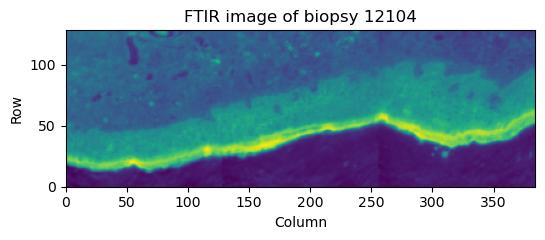

 
Plot raw spectrum: choose pixel
Min value of col_T 0, max value 383
Min value of row_T 32, max value 101
Plot raw spectrum in pixel, row 86 column 236


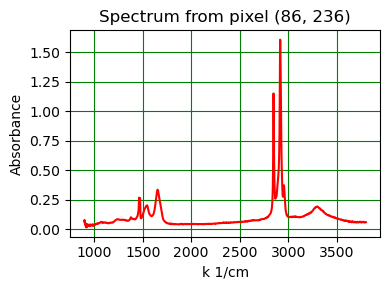

 
Plot processed spectrum in particular pixel, row 86 column 236
 


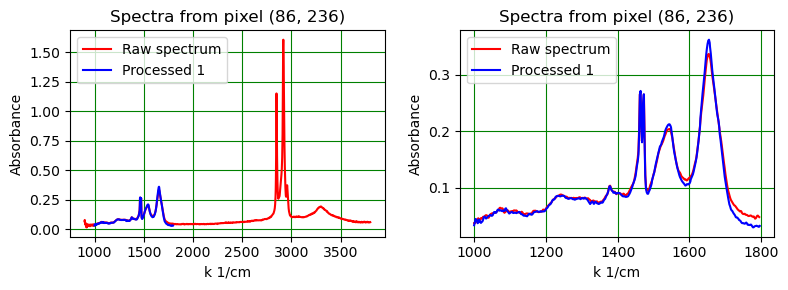

 
Plot FTIR image with N/T pixels marked
 


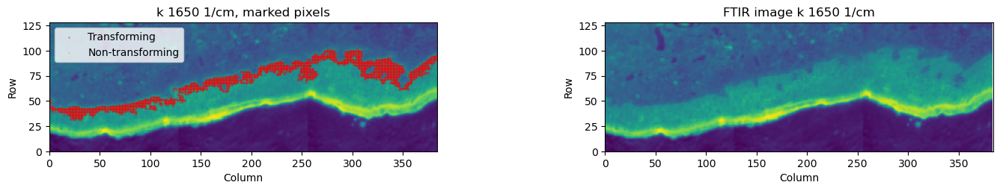

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 4.17e-02
 


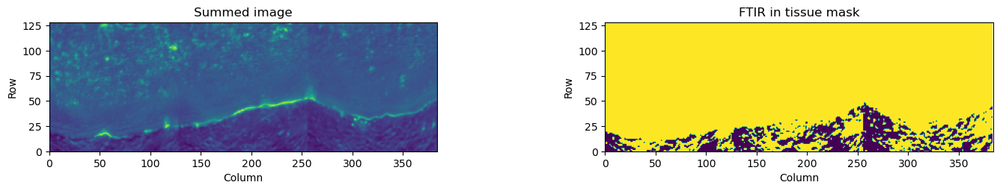

 
Make N/T mask
 


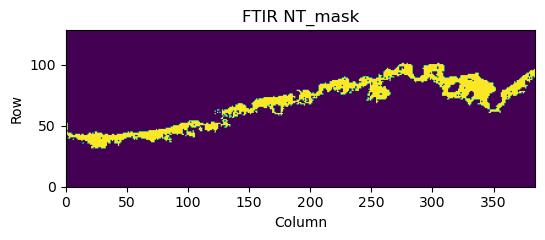

 
 
Plot spectra from N/T pixels


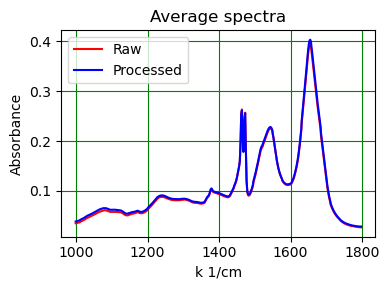

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -7.95e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 44236
Number of pixels in in_tissue_NT spectrum 3551
Number of pixels in in_tissue_notNT spectrum 40685
Number of pixels in out_mask spectrum 4916
 


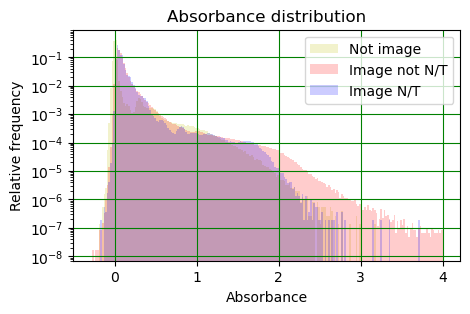

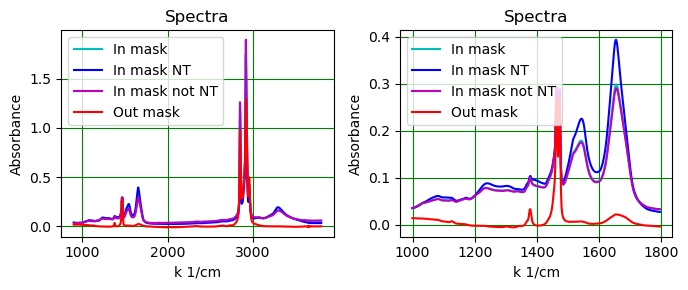

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


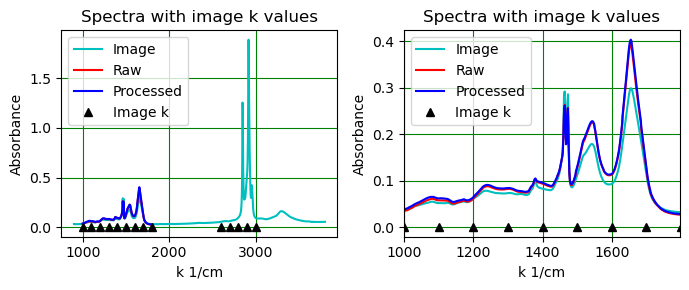

 
Make X_D and y_D arrays
 
Biopsy 2
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 2 and label 12127
Non-transforming area 0 pixels.
Transforming area 1069 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12127
Shape of FTIR image (128, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 128 columns


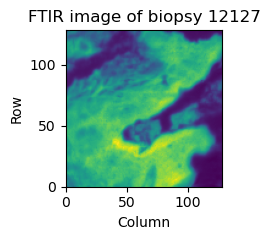

 
Plot raw spectrum: choose pixel
Min value of col_T 0, max value 103
Min value of row_T 50, max value 126
Plot raw spectrum in pixel, row 80 column 63


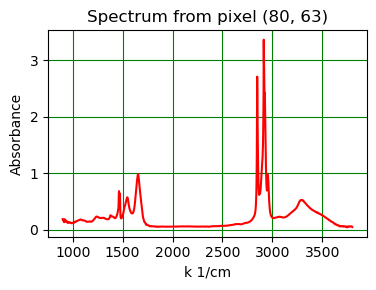

 
Plot processed spectrum in particular pixel, row 80 column 63
 


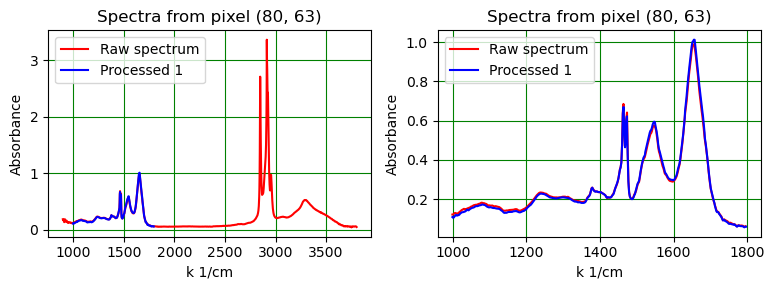

 
Plot FTIR image with N/T pixels marked
 


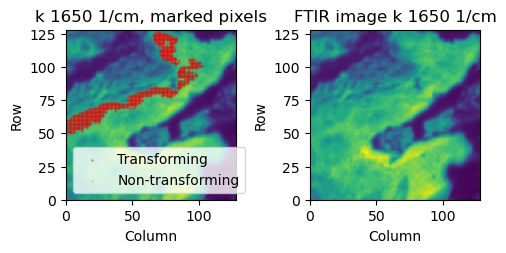

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 9.89e-02
 


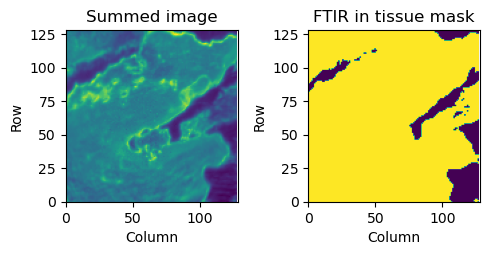

 
Make N/T mask
 


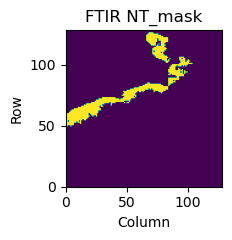

 
 
Plot spectra from N/T pixels


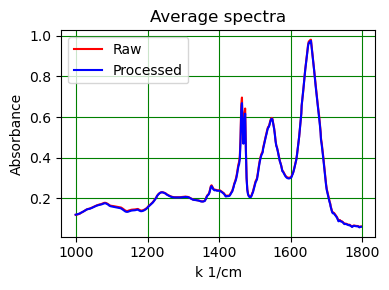

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -9.75e-02
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 14745
Number of pixels in in_tissue_NT spectrum 1069
Number of pixels in in_tissue_notNT spectrum 13676
Number of pixels in out_mask spectrum 1639
 


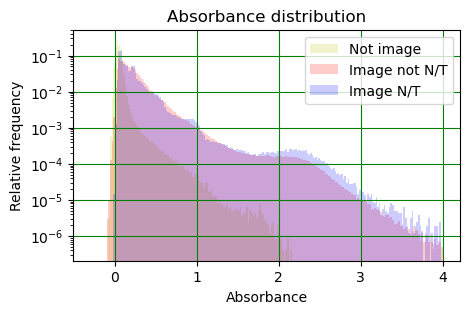

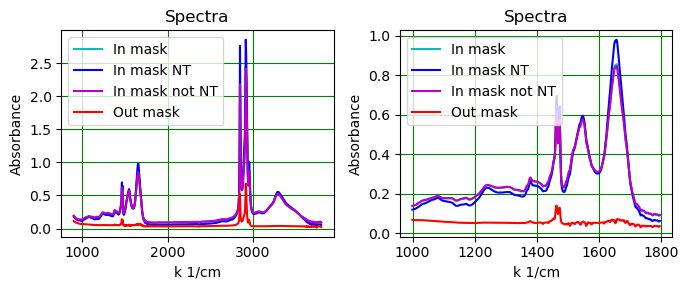

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


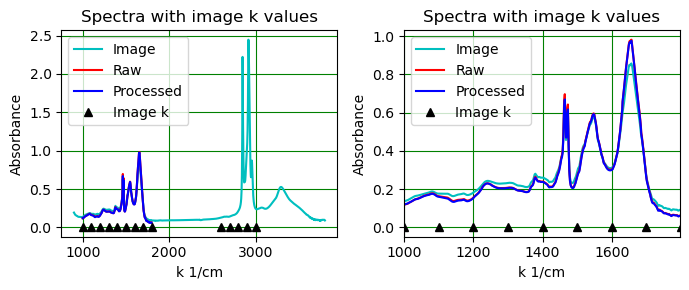

 
Make X_D and y_D arrays
 
Biopsy 3
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 3 and label 12195
Non-transforming area 0 pixels.
Transforming area 3891 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12195
Shape of FTIR image (256, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 256 rows and 256 columns


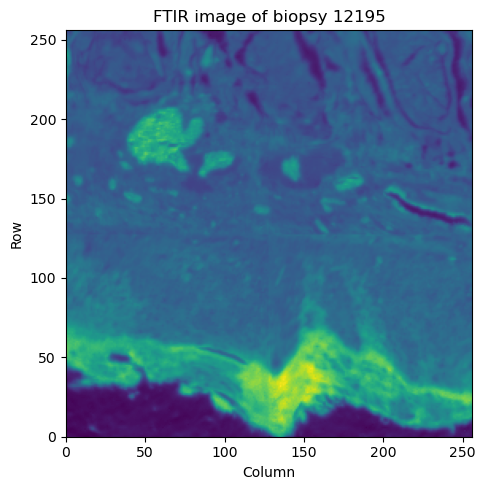

 
Plot raw spectrum: choose pixel
Min value of col_T 0, max value 255
Min value of row_T 75, max value 128
Plot raw spectrum in pixel, row 107 column 105


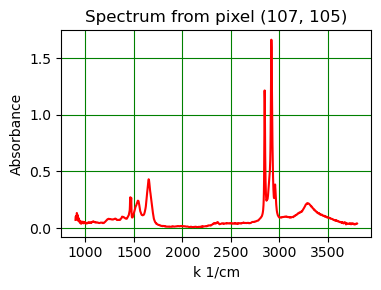

 
Plot processed spectrum in particular pixel, row 107 column 105
 


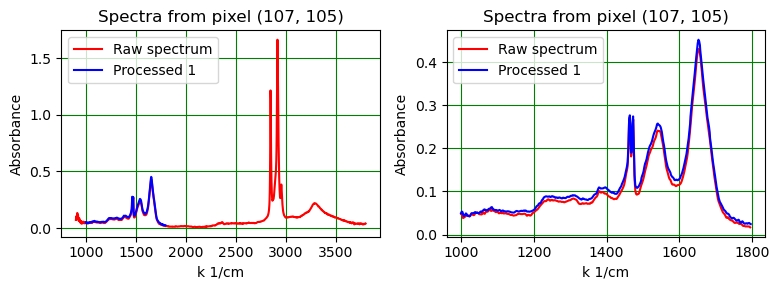

 
Plot FTIR image with N/T pixels marked
 


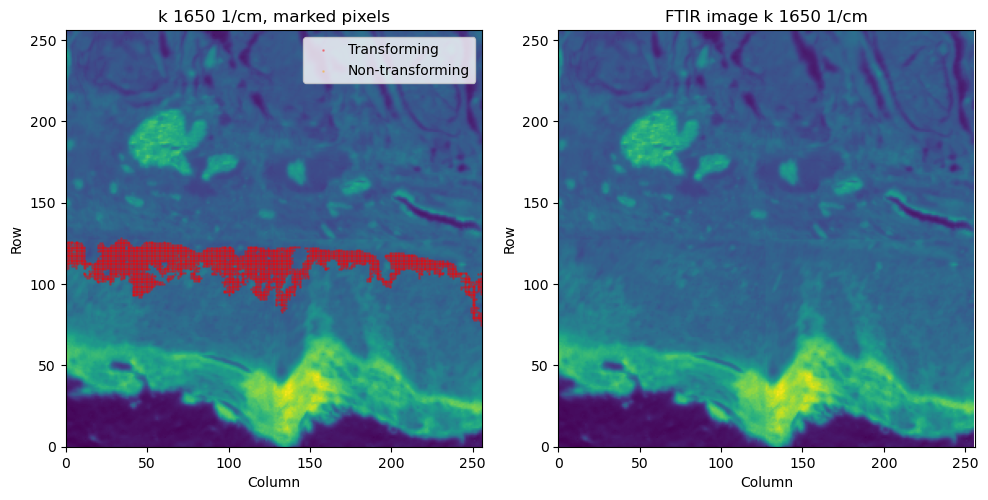

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 7.18e-02
 


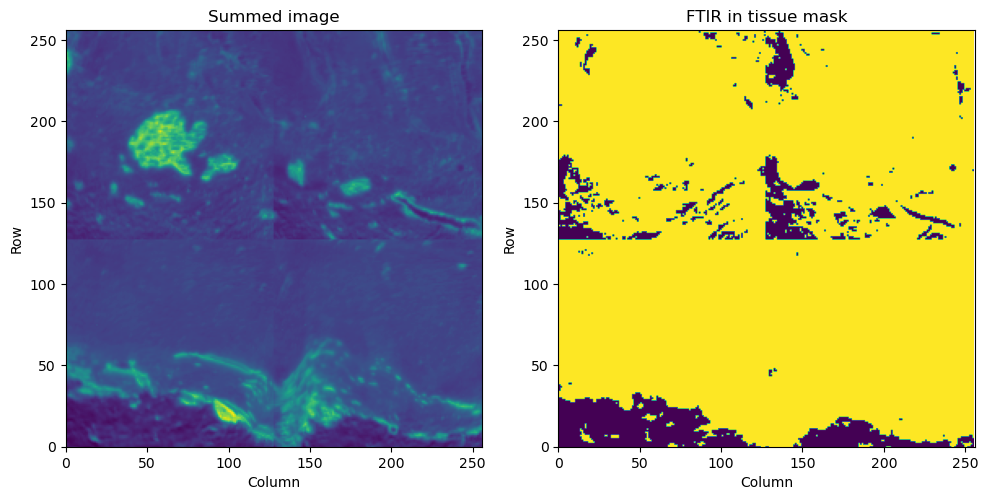

 
Make N/T mask
 


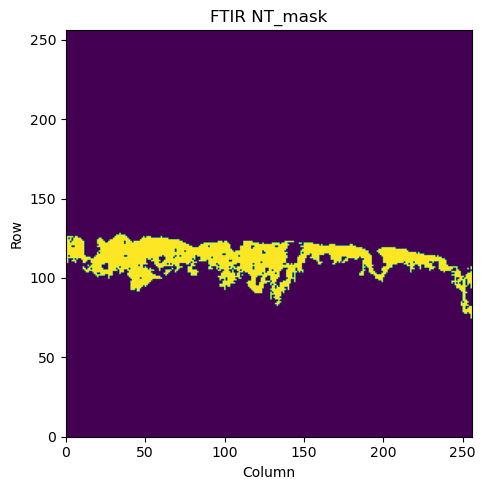

 
 
Plot spectra from N/T pixels


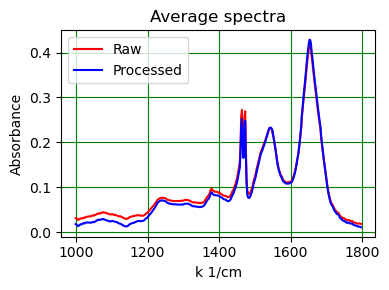

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -3.03e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 58982
Number of pixels in in_tissue_NT spectrum 3891
Number of pixels in in_tissue_notNT spectrum 55091
Number of pixels in out_mask spectrum 6554
 


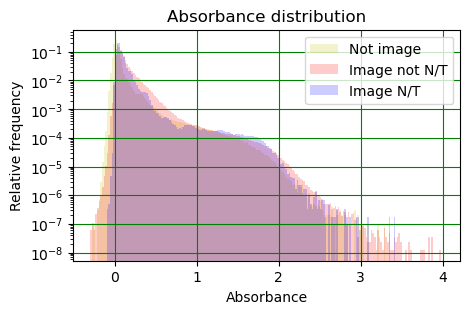

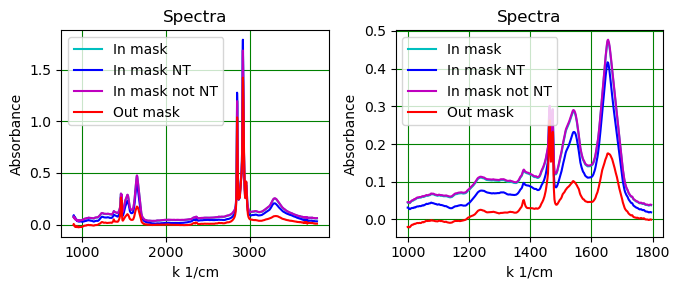

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


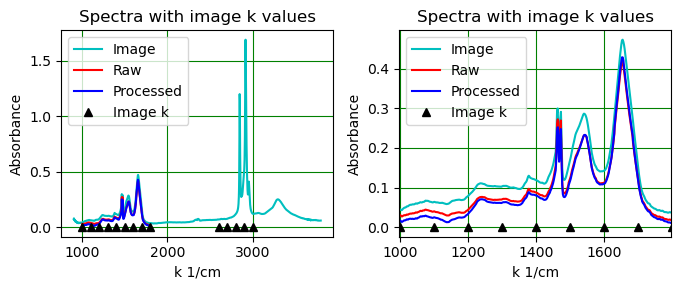

 
Make X_D and y_D arrays
 
Biopsy 4
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 4 and label 12201
Non-transforming area 0 pixels.
Transforming area 1175 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12201
Shape of FTIR image (128, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 128 columns


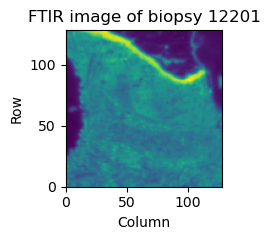

 
Plot raw spectrum: choose pixel
Min value of col_T 24, max value 122
Min value of row_T 52, max value 110
Plot raw spectrum in pixel, row 65 column 75


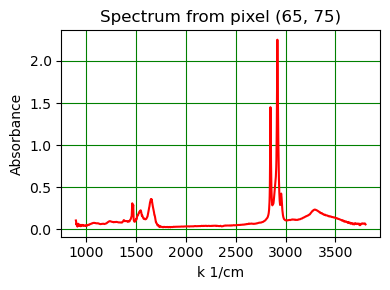

 
Plot processed spectrum in particular pixel, row 65 column 75
 


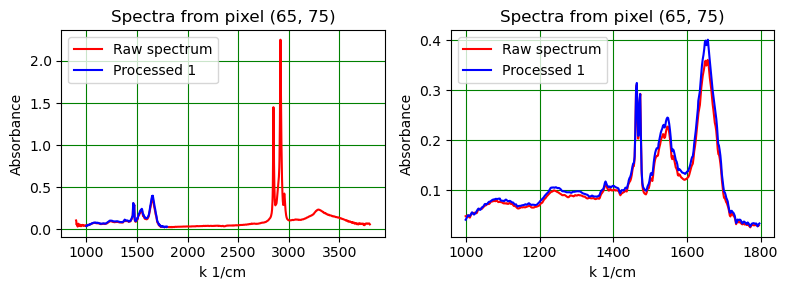

 
Plot FTIR image with N/T pixels marked
 


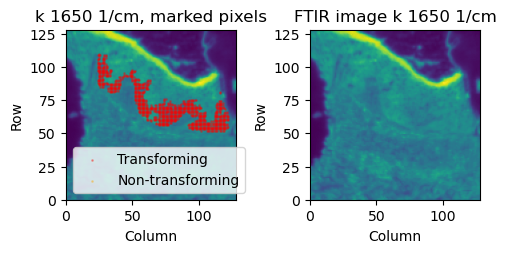

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 6.48e-02
 


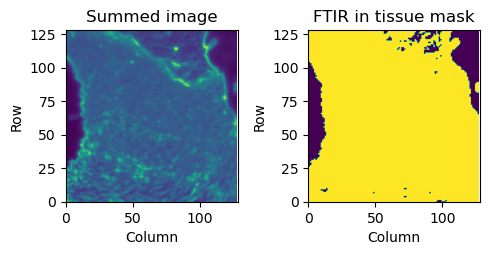

 
Make N/T mask
 


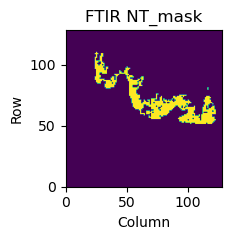

 
 
Plot spectra from N/T pixels


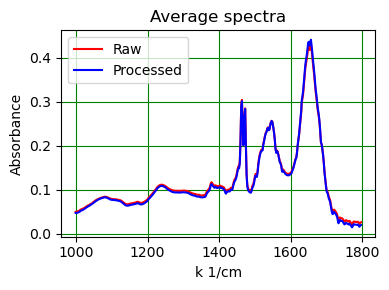

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -2.47e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 14745
Number of pixels in in_tissue_NT spectrum 1175
Number of pixels in in_tissue_notNT spectrum 13570
Number of pixels in out_mask spectrum 1639
 


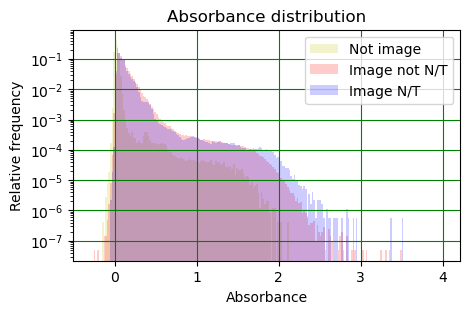

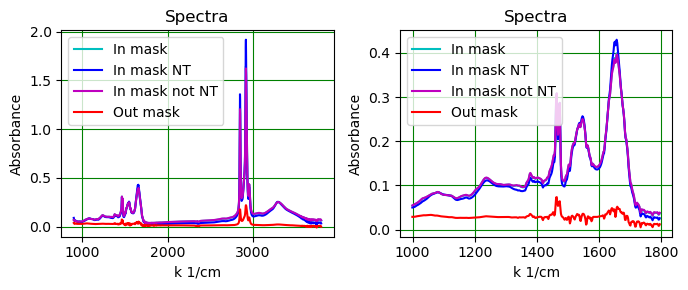

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


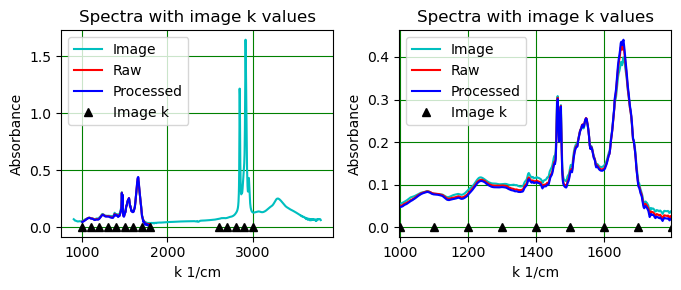

 
Make X_D and y_D arrays
 
Biopsy 5
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 5 and label 12219
Non-transforming area 0 pixels.
Transforming area 1547 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12219
Shape of FTIR image (128, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 256 columns


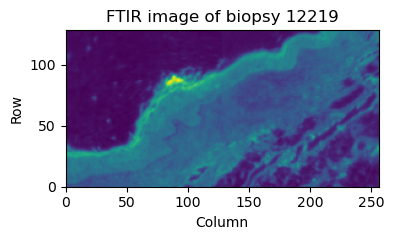

 
Plot raw spectrum: choose pixel
Min value of col_T 3, max value 212
Min value of row_T 3, max value 120
Plot raw spectrum in pixel, row 66 column 104


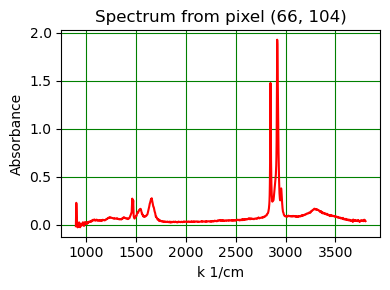

 
Plot processed spectrum in particular pixel, row 66 column 104
 


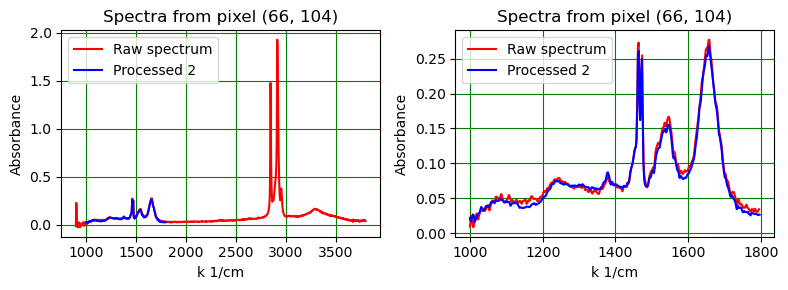

 
Plot FTIR image with N/T pixels marked
 


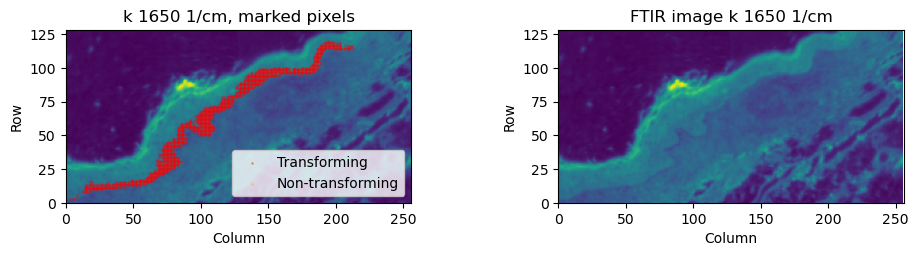

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 4.47e-02
 


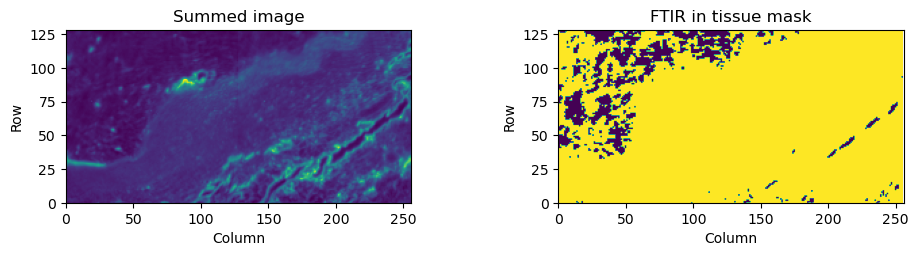

 
Make N/T mask
 


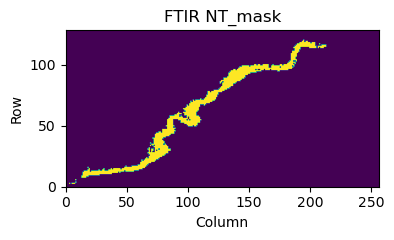

 
 
Plot spectra from N/T pixels


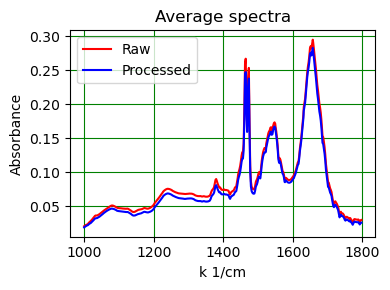

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -3.11e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 29491
Number of pixels in in_tissue_NT spectrum 1547
Number of pixels in in_tissue_notNT spectrum 27944
Number of pixels in out_mask spectrum 3277
 


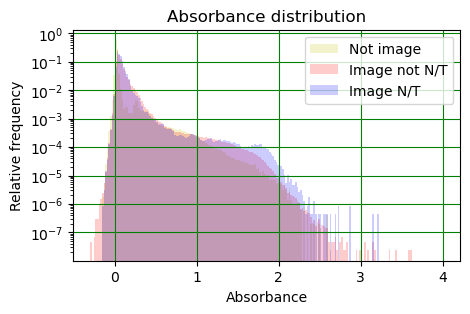

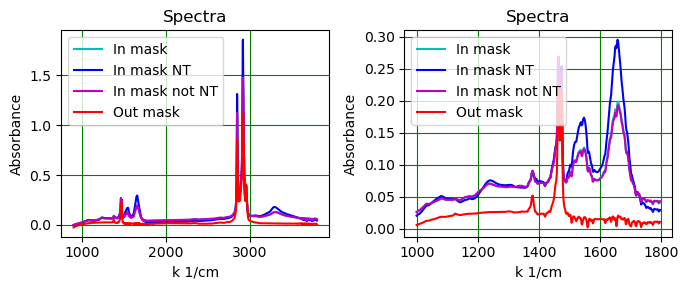

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


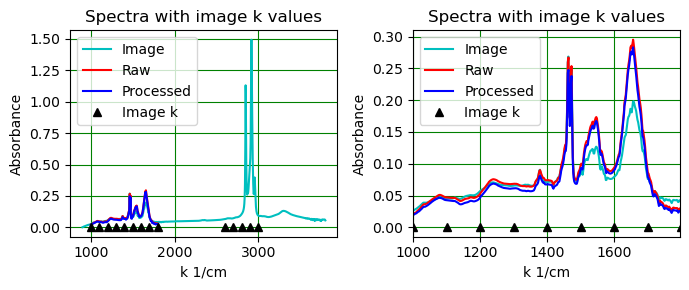

 
Make X_D and y_D arrays
 
Biopsy 6
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 6 and label 12248
Non-transforming area 0 pixels.
Transforming area 3911 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12248
Shape of FTIR image (256, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 256 rows and 256 columns


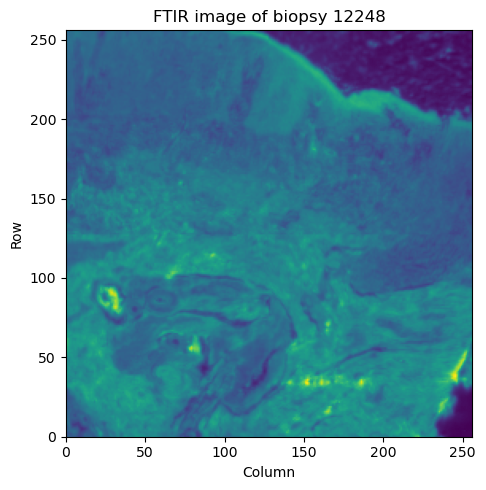

 
Plot raw spectrum: choose pixel
Min value of col_T 22, max value 255
Min value of row_T 152, max value 255
Plot raw spectrum in pixel, row 243 column 88


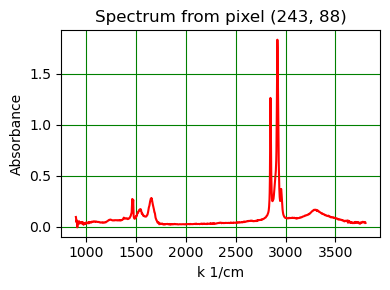

 
Plot processed spectrum in particular pixel, row 243 column 88
 


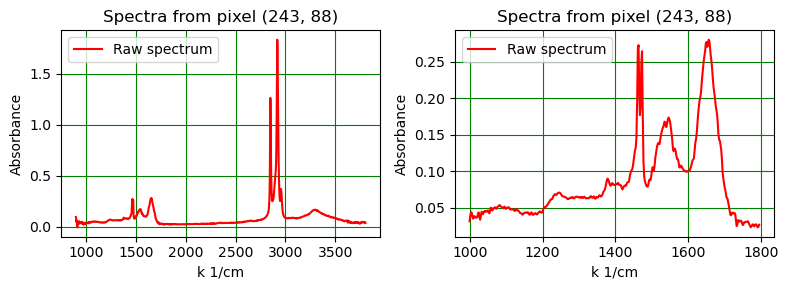

 
Plot FTIR image with N/T pixels marked
 


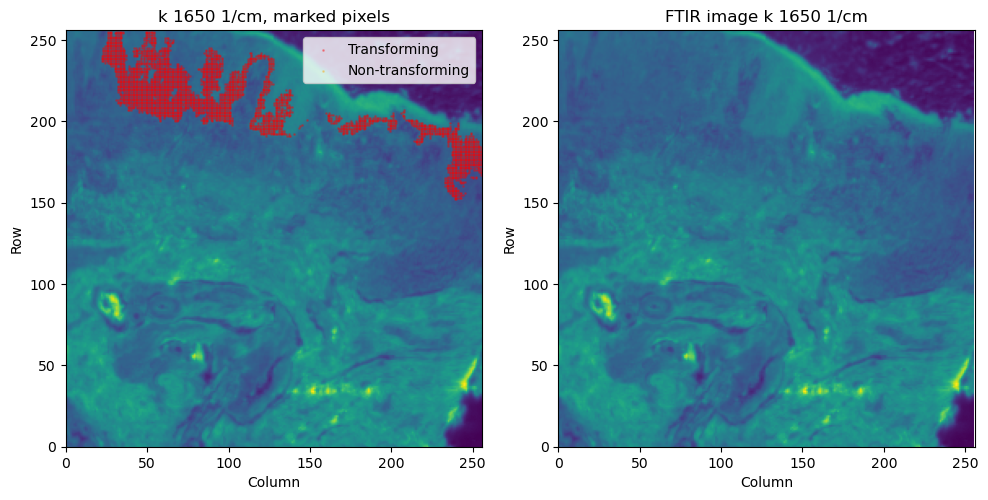

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 8.01e-02
 


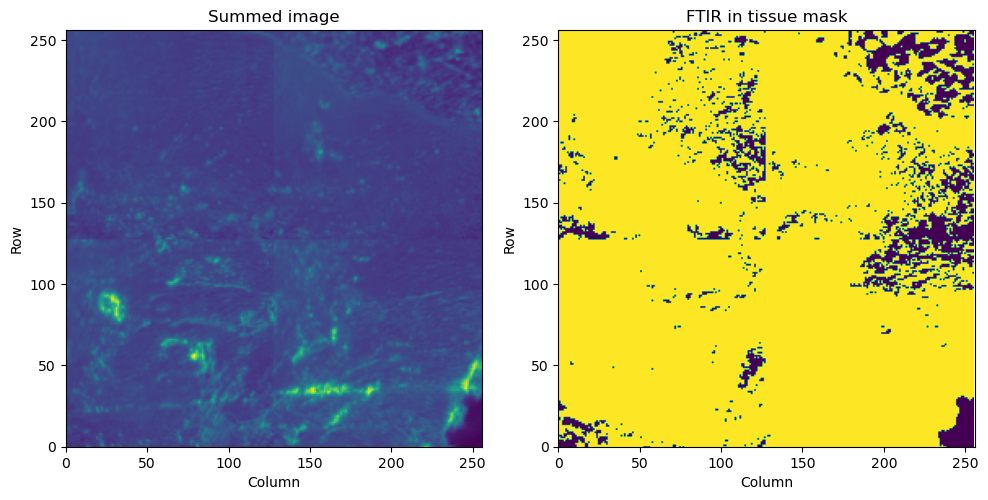

 
Make N/T mask
 


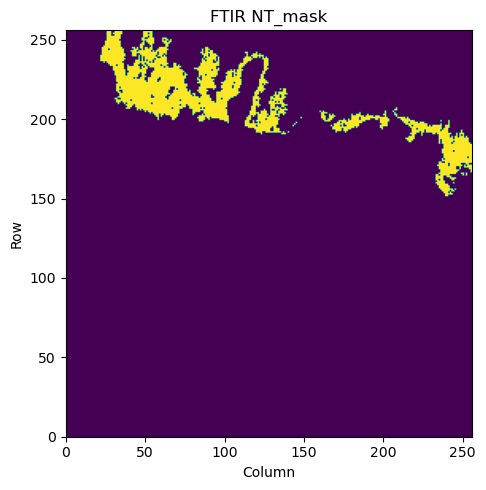

 
 
Plot spectra from N/T pixels


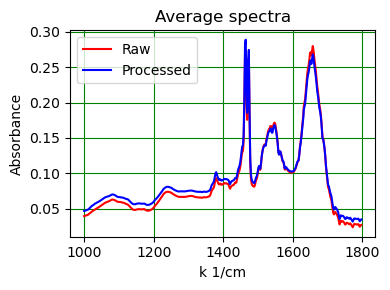

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -8.31e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 58982
Number of pixels in in_tissue_NT spectrum 3660
Number of pixels in in_tissue_notNT spectrum 55322
Number of pixels in out_mask spectrum 6554
 


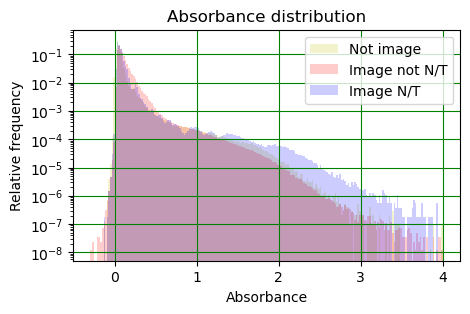

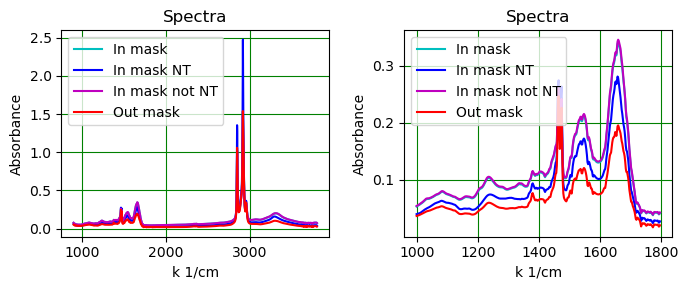

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


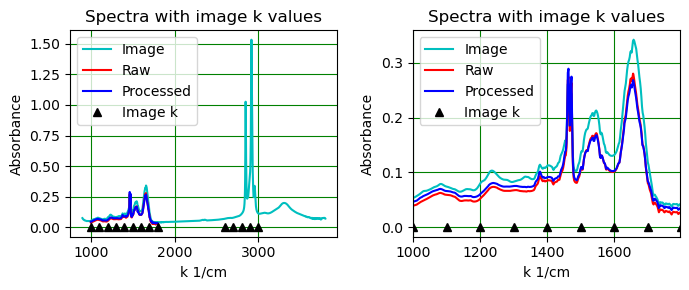

 
Make X_D and y_D arrays
 
Biopsy 7
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 7 and label 12257
Non-transforming area 0 pixels.
Transforming area 2421 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12257
Shape of FTIR image (128, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 128 columns


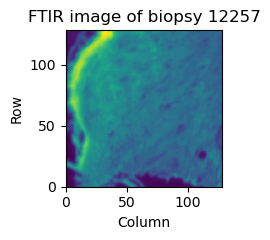

 
Plot raw spectrum: choose pixel
Min value of col_T 25, max value 81
Min value of row_T 7, max value 127
Plot raw spectrum in pixel, row 102 column 54


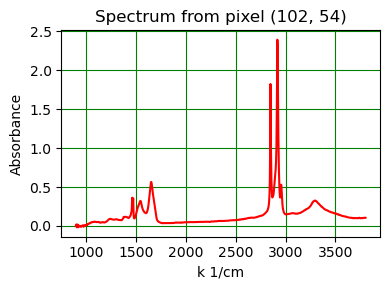

 
Plot processed spectrum in particular pixel, row 102 column 54
 


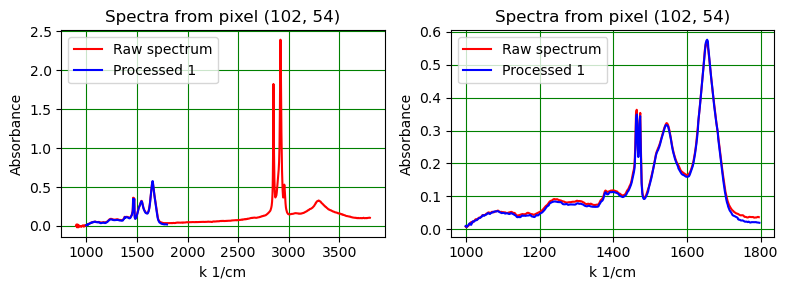

 
Plot FTIR image with N/T pixels marked
 


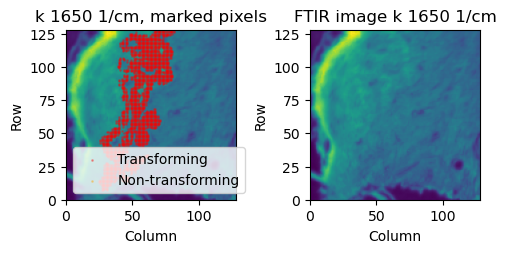

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 6.97e-02
 


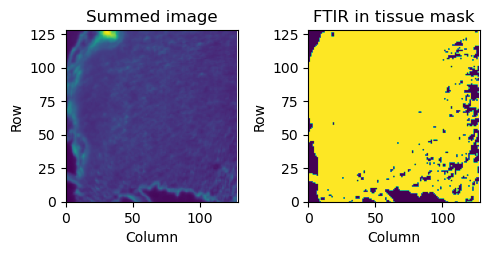

 
Make N/T mask
 


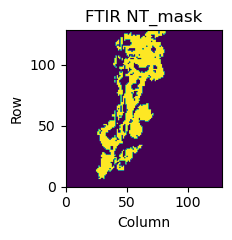

 
 
Plot spectra from N/T pixels


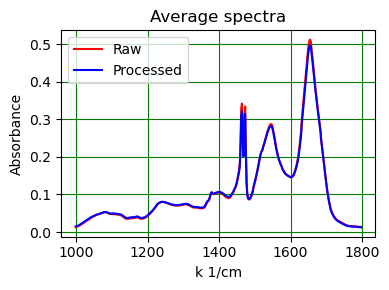

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -2.34e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 14745
Number of pixels in in_tissue_NT spectrum 2419
Number of pixels in in_tissue_notNT spectrum 12326
Number of pixels in out_mask spectrum 1639
 


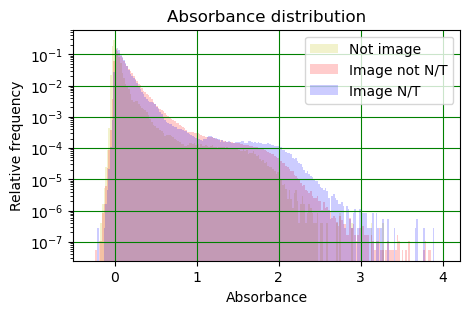

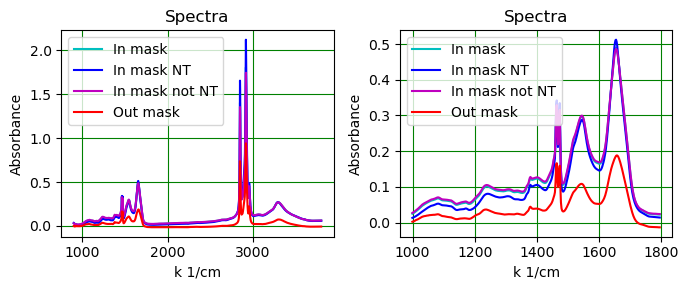

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


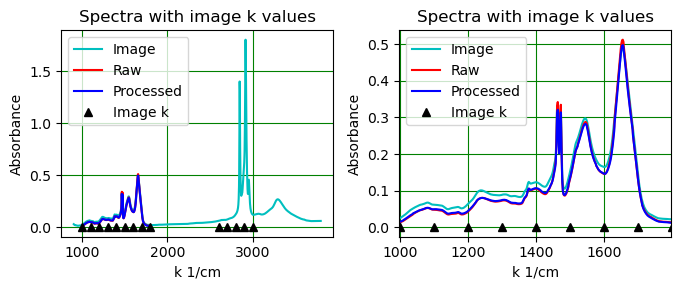

 
Make X_D and y_D arrays
 
Biopsy 8
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 8 and label 12260
Non-transforming area 0 pixels.
Transforming area 1308 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12260
Shape of FTIR image (256, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 256 rows and 128 columns


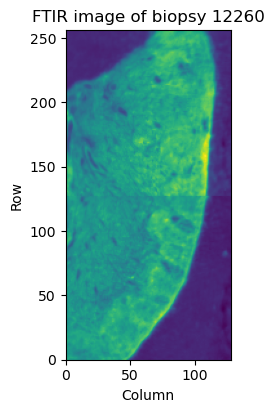

 
Plot raw spectrum: choose pixel
Min value of col_T 69, max value 103
Min value of row_T 145, max value 241
Plot raw spectrum in pixel, row 166 column 83


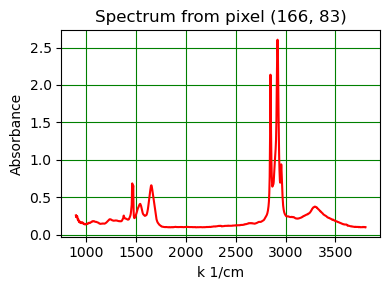

 
Plot processed spectrum in particular pixel, row 166 column 83
 


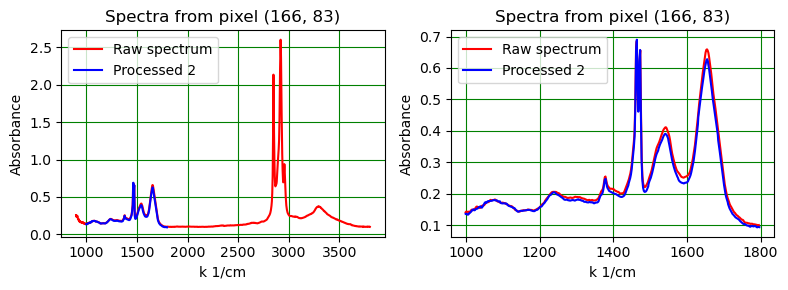

 
Plot FTIR image with N/T pixels marked
 


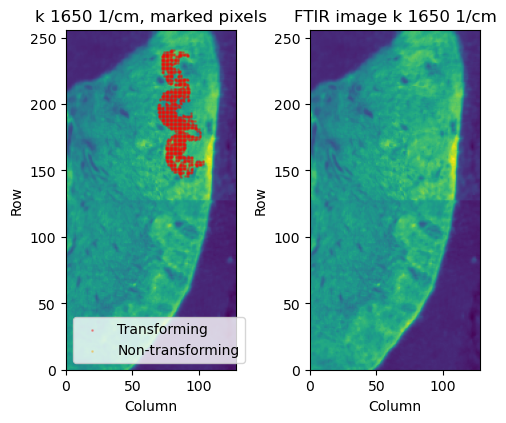

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 9.95e-02
 


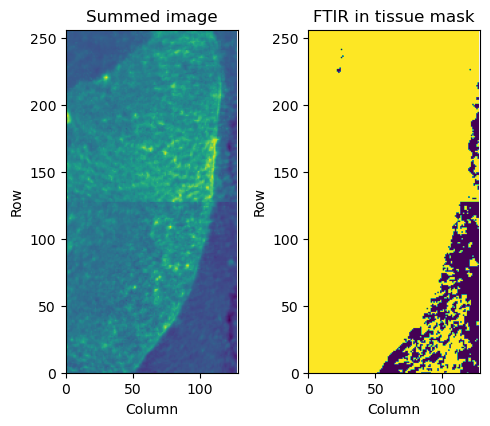

 
Make N/T mask
 


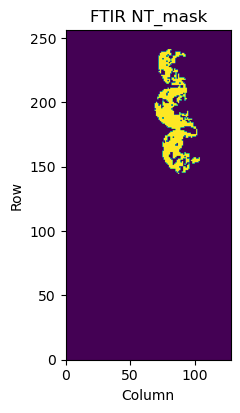

 
 
Plot spectra from N/T pixels


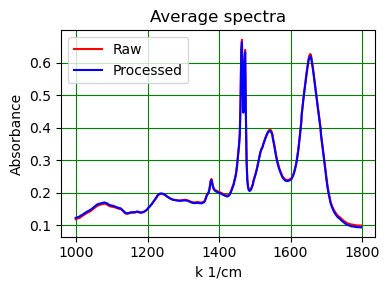

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -4.41e-01
Maximum absorbance 9.01e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 29491
Number of pixels in in_tissue_NT spectrum 1308
Number of pixels in in_tissue_notNT spectrum 28183
Number of pixels in out_mask spectrum 3277
 


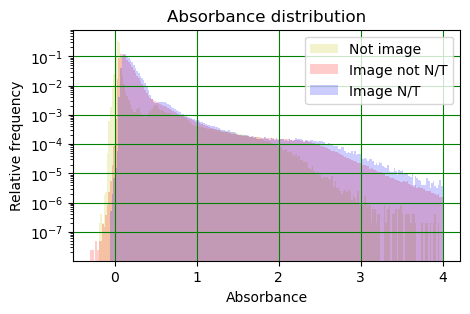

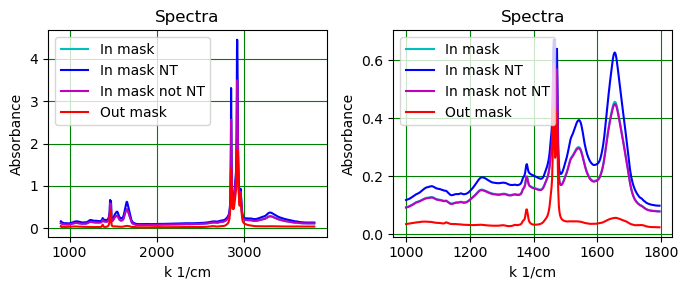

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


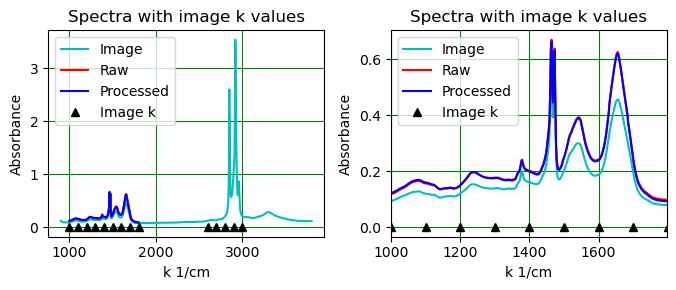

 
Make X_D and y_D arrays
 
Biopsy 9
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 9 and label 12263
Non-transforming area 0 pixels.
Transforming area 3054 pixels.
Biopsy type 2
 
 
Get FTIR data
Looking at biposy with label 12263
Shape of FTIR image (128, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 128 columns


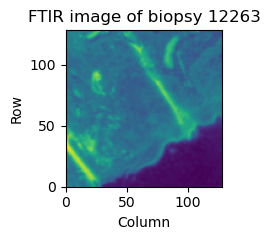

 
Plot raw spectrum: choose pixel
Min value of col_T 12, max value 127
Min value of row_T 29, max value 121
Plot raw spectrum in pixel, row 105 column 124


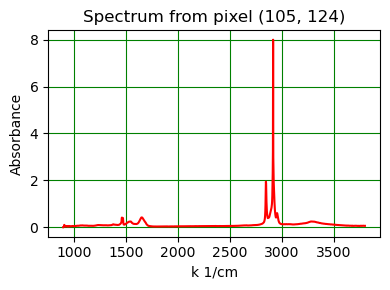

 
Plot processed spectrum in particular pixel, row 105 column 124
 


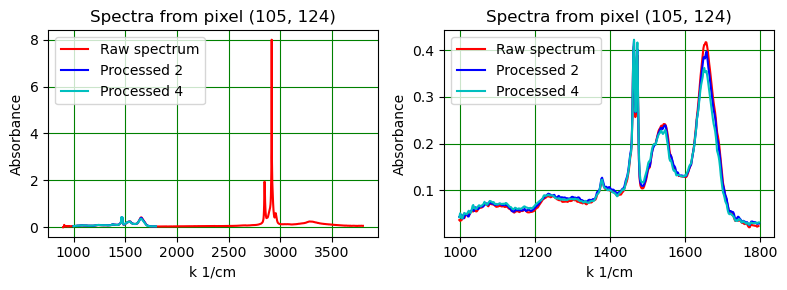

 
Plot FTIR image with N/T pixels marked
 


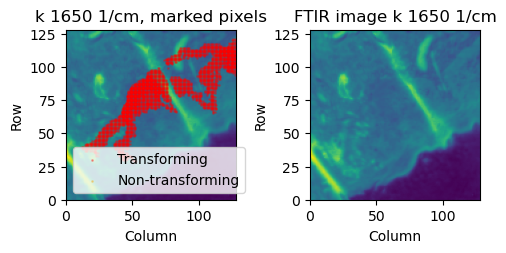

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 1.65e-02
 


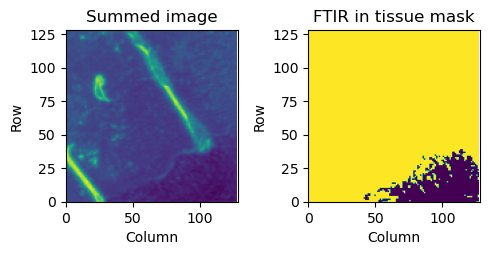

 
Make N/T mask
 


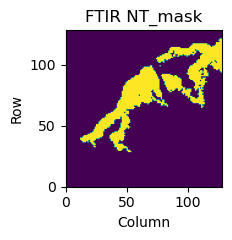

 
 
Plot spectra from N/T pixels


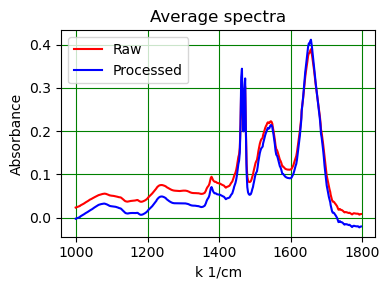

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -2.16e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 14745
Number of pixels in in_tissue_NT spectrum 2524
Number of pixels in in_tissue_notNT spectrum 12221
Number of pixels in out_mask spectrum 1639
 


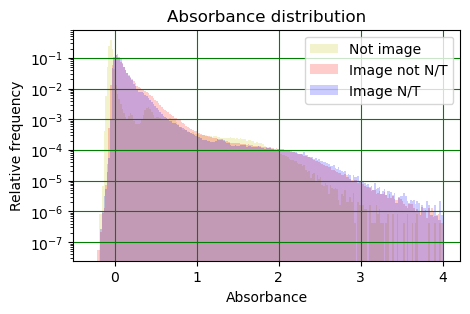

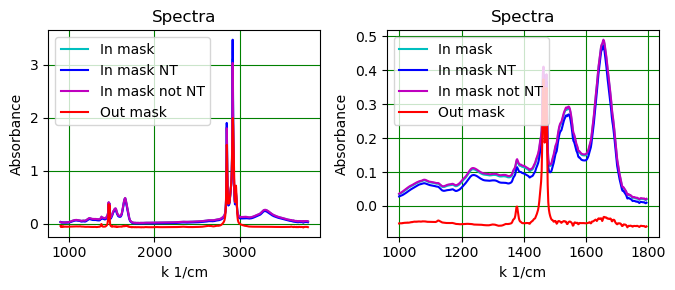

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


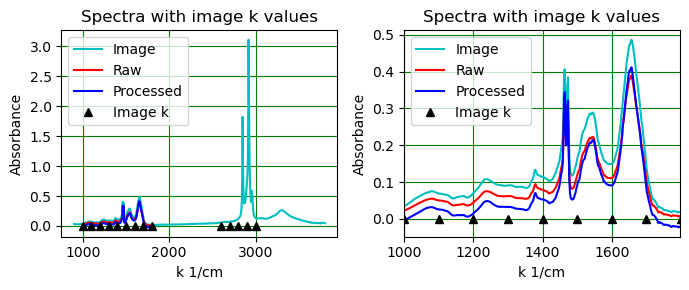

 
Make X_D and y_D arrays
 
Biopsy 10
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 10 and label 12098
Non-transforming area 2813 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12098
Shape of FTIR image (384, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 384 rows and 128 columns


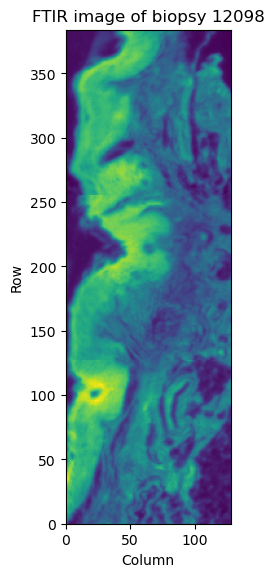

 
Plot raw spectrum: choose pixel
Min value of col_NT 0, max value 79
Min value of row_NT 6, max value 383
Plot raw spectrum in pixel, row 332 column 43


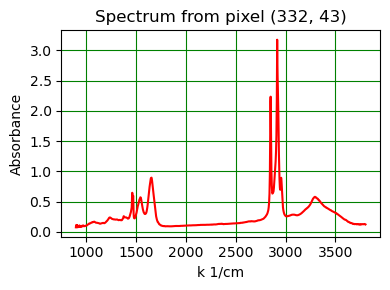

 
Plot processed spectrum in particular pixel, row 332 column 43
 


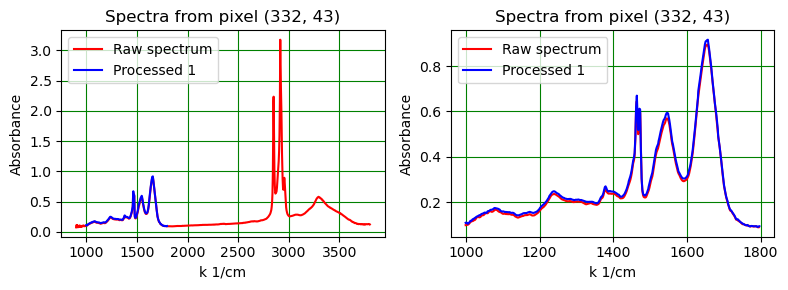

 
Plot FTIR image with N/T pixels marked
 


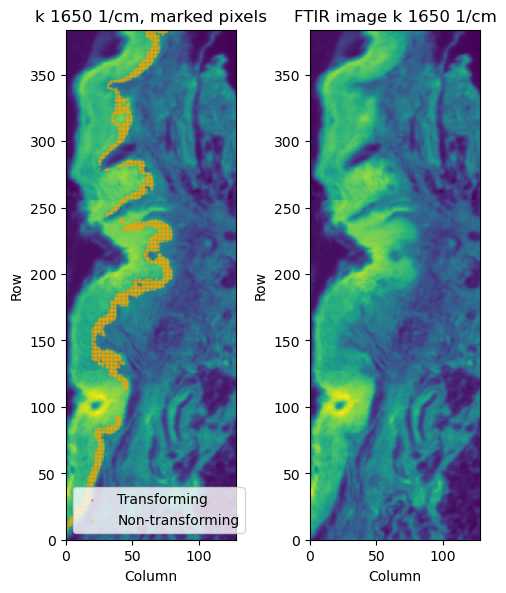

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 1.35e-01
 


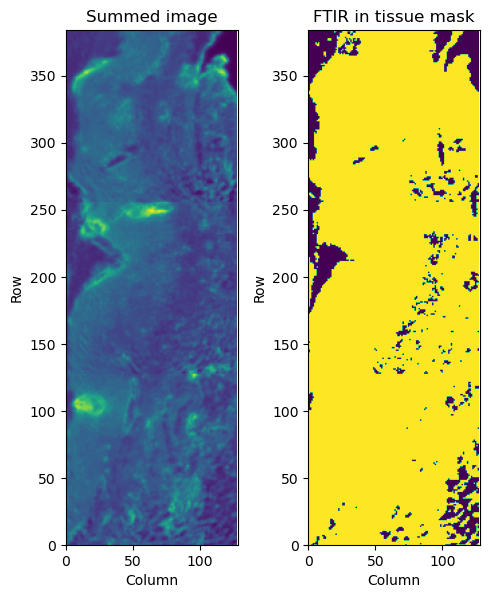

 
Make N/T mask
 


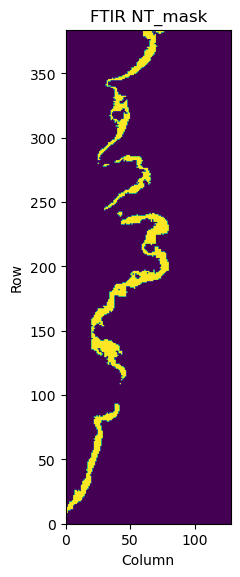

 
 
Plot spectra from N/T pixels


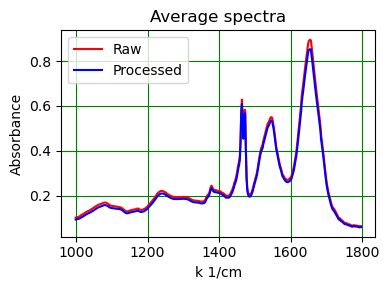

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -1.96e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 44236
Number of pixels in in_tissue_NT spectrum 2813
Number of pixels in in_tissue_notNT spectrum 41423
Number of pixels in out_mask spectrum 4916
 


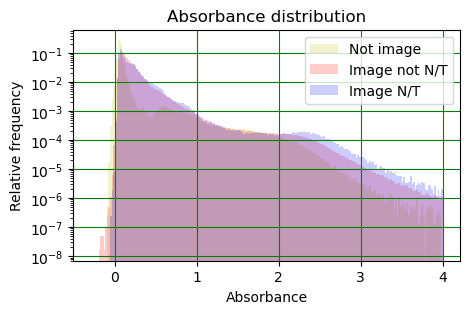

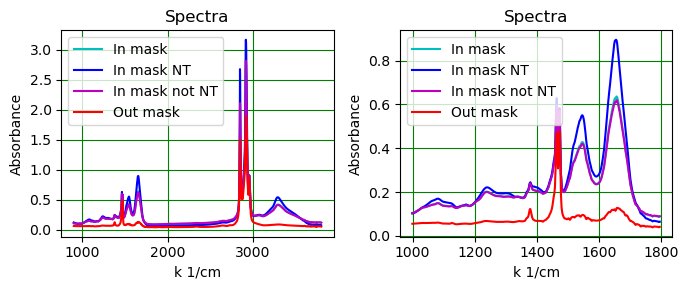

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


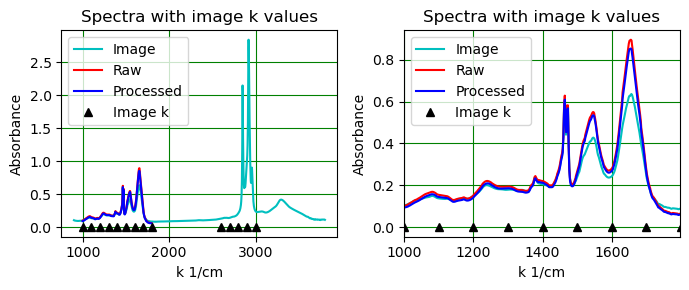

 
Make X_D and y_D arrays
 
Biopsy 11
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 11 and label 12141
Non-transforming area 543 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12141
Shape of FTIR image (128, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 128 columns


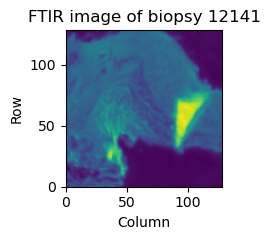

 
Plot raw spectrum: choose pixel
Min value of col_NT 64, max value 88
Min value of row_NT 61, max value 112
Plot raw spectrum in pixel, row 96 column 74


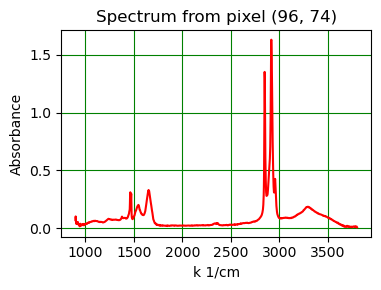

 
Plot processed spectrum in particular pixel, row 96 column 74
 


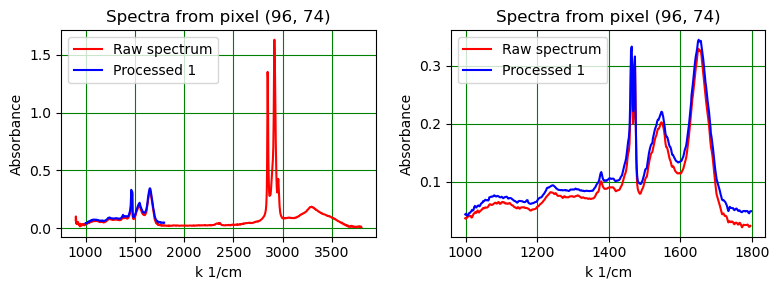

 
Plot FTIR image with N/T pixels marked
 


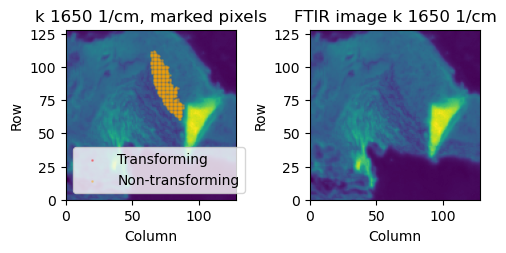

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 2.39e-03
 


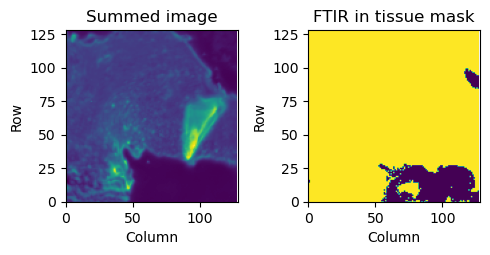

 
Make N/T mask
 


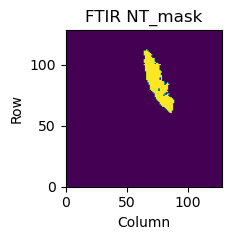

 
 
Plot spectra from N/T pixels


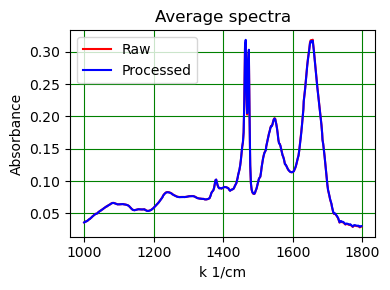

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -1.96e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 14745
Number of pixels in in_tissue_NT spectrum 543
Number of pixels in in_tissue_notNT spectrum 14202
Number of pixels in out_mask spectrum 1639
 


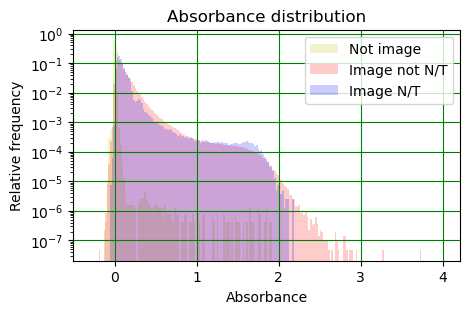

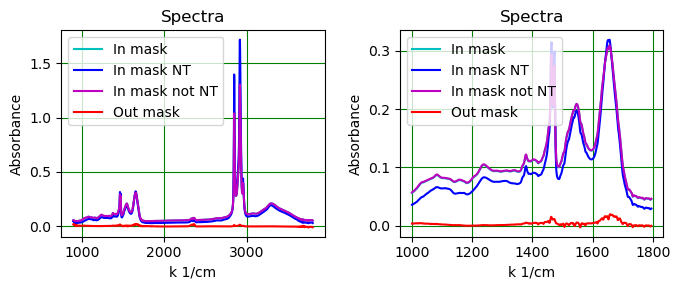

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


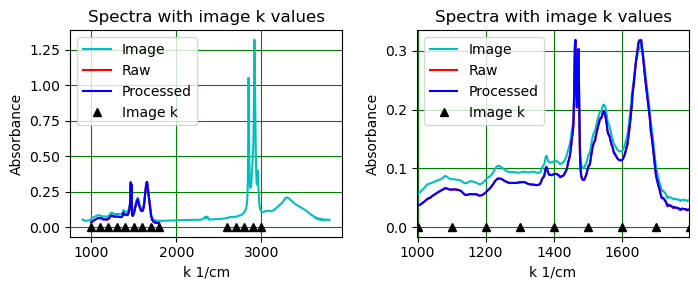

 
Make X_D and y_D arrays
 
Biopsy 12
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 12 and label 12162
Non-transforming area 2312 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12162
Shape of FTIR image (256, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 256 rows and 256 columns


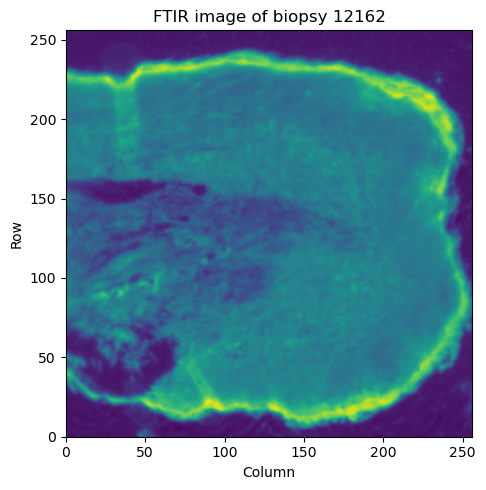

 
Plot raw spectrum: choose pixel
Min value of col_NT 83, max value 237
Min value of row_NT 30, max value 127
Plot raw spectrum in pixel, row 63 column 202


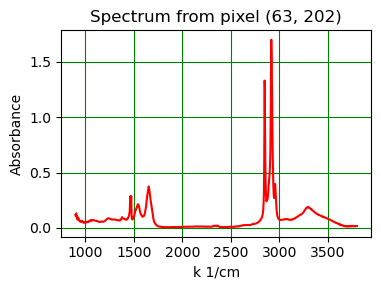

 
Plot processed spectrum in particular pixel, row 63 column 202
 


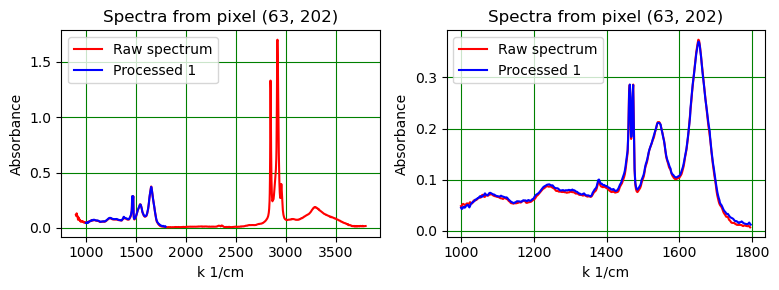

 
Plot FTIR image with N/T pixels marked
 


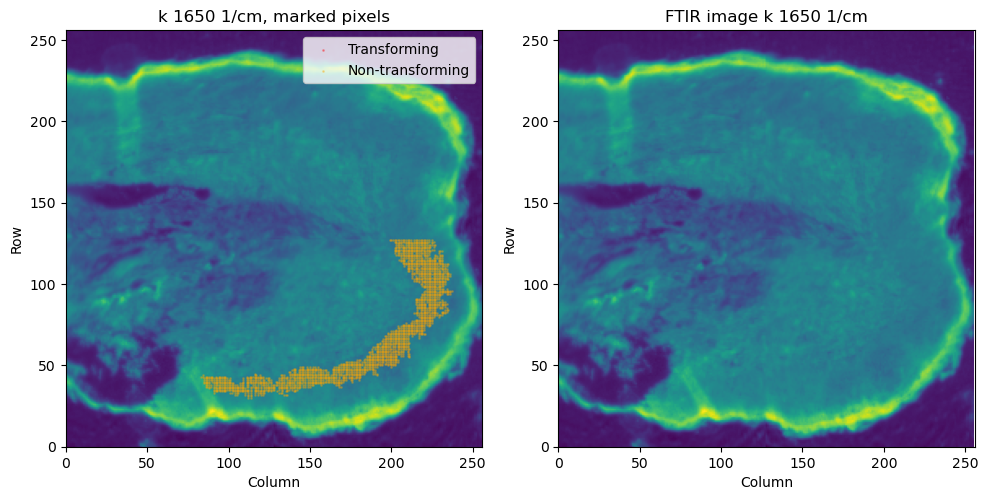

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 7.04e-02
 


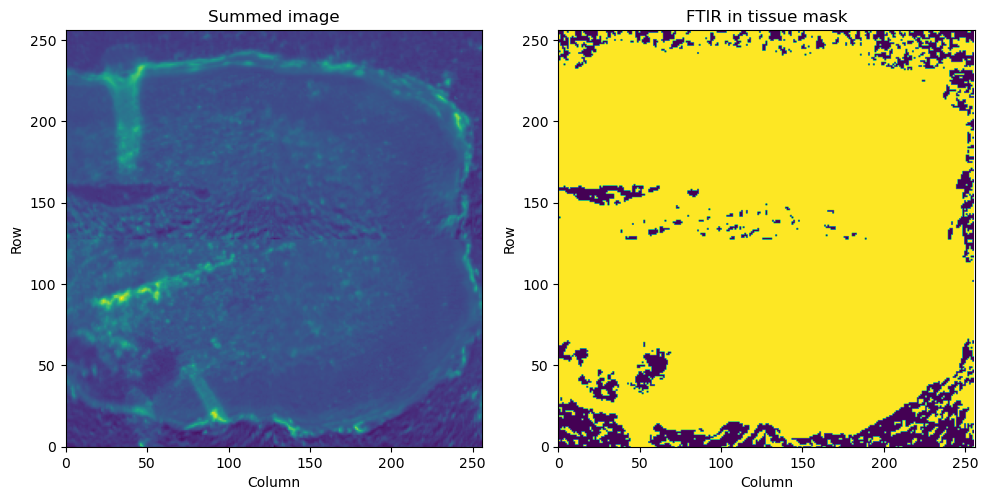

 
Make N/T mask
 


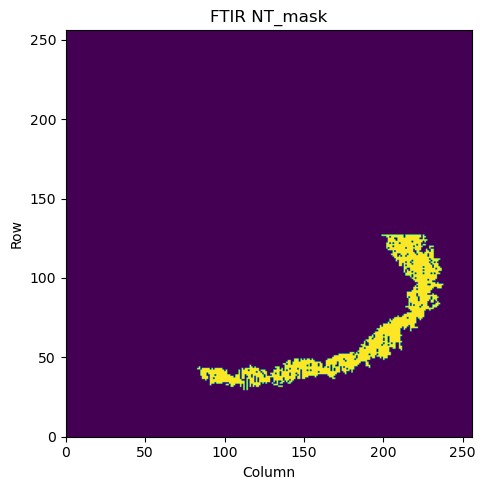

 
 
Plot spectra from N/T pixels


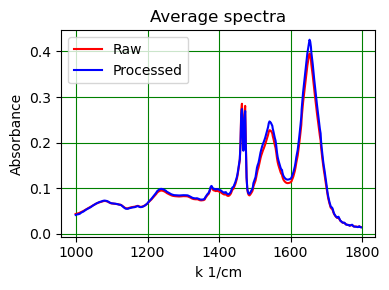

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -8.56e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 58982
Number of pixels in in_tissue_NT spectrum 2312
Number of pixels in in_tissue_notNT spectrum 56670
Number of pixels in out_mask spectrum 6554
 


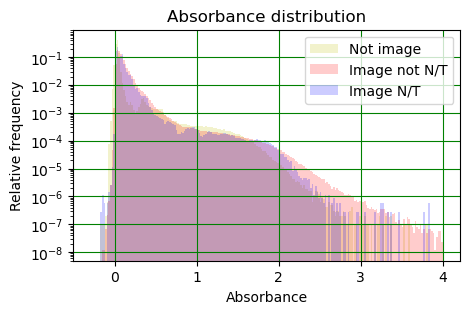

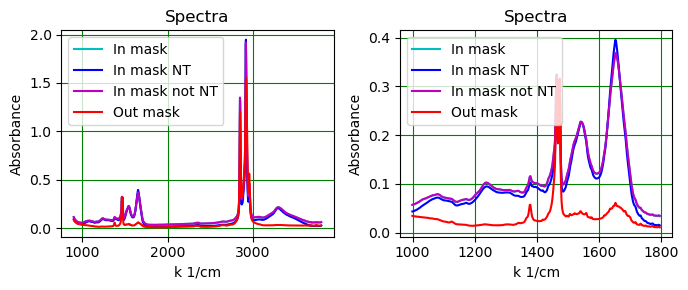

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


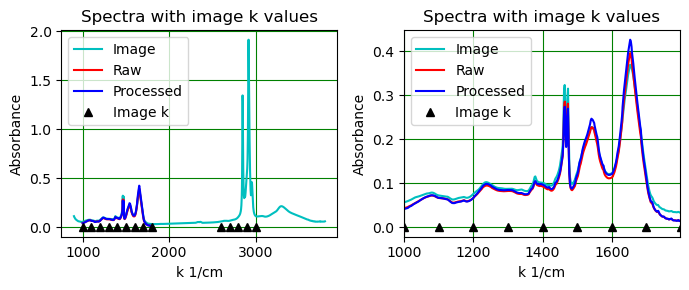

 
Make X_D and y_D arrays
 
Biopsy 13
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 13 and label 12181
Non-transforming area 3208 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12181
Shape of FTIR image (128, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 256 columns


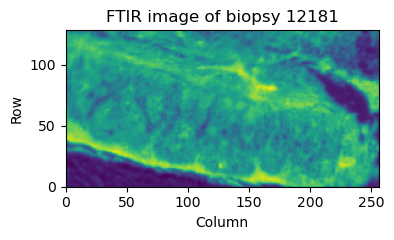

 
Plot raw spectrum: choose pixel
Min value of col_NT 0, max value 237
Min value of row_NT 7, max value 110
Plot raw spectrum in pixel, row 66 column 128


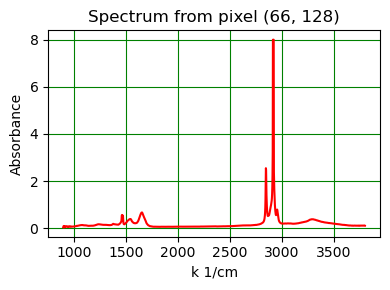

 
Plot processed spectrum in particular pixel, row 66 column 128
 


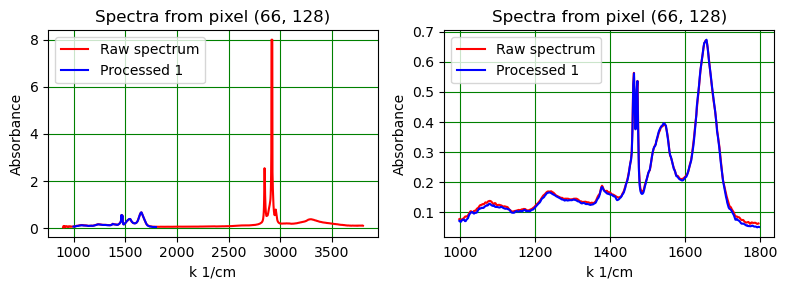

 
Plot FTIR image with N/T pixels marked
 


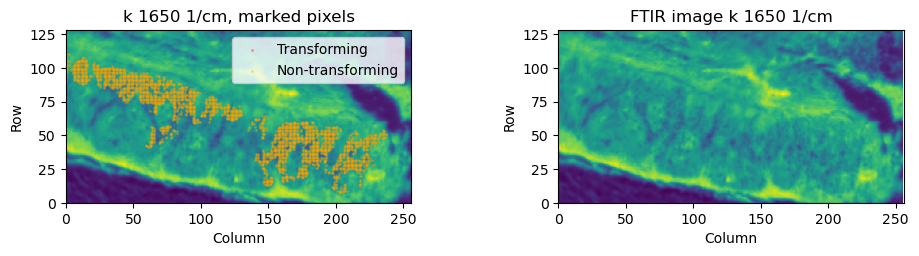

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 1.54e-01
 


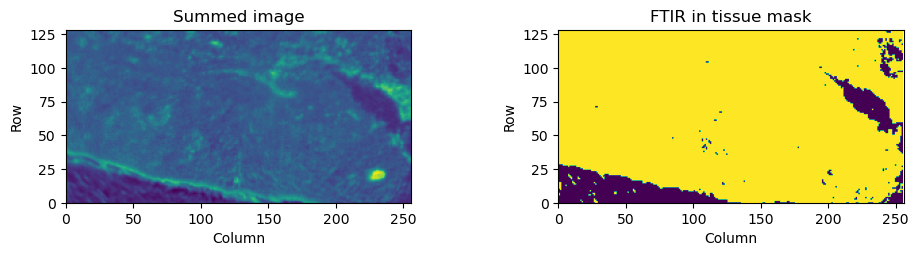

 
Make N/T mask
 


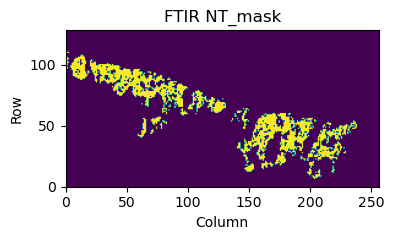

 
 
Plot spectra from N/T pixels


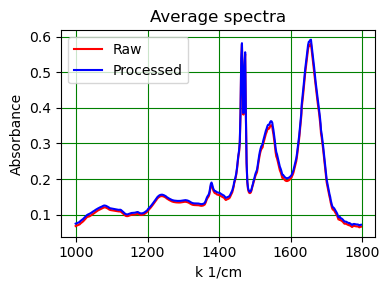

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -1.66e+00
Maximum absorbance 8.04e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 29491
Number of pixels in in_tissue_NT spectrum 3206
Number of pixels in in_tissue_notNT spectrum 26285
Number of pixels in out_mask spectrum 3277
 


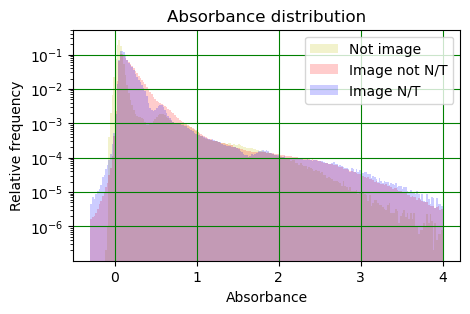

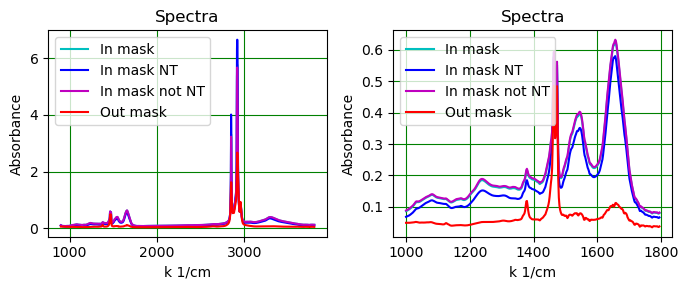

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


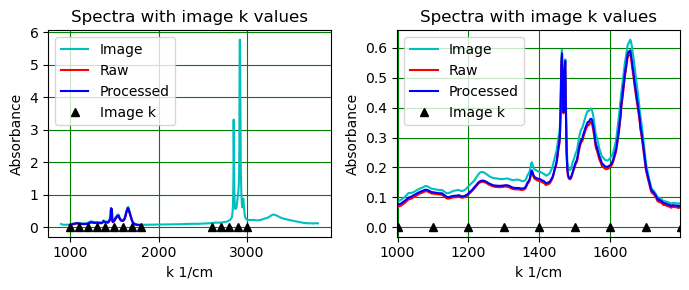

 
Make X_D and y_D arrays
 
Biopsy 14
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 14 and label 12329
Non-transforming area 2344 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12329
Shape of FTIR image (256, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 256 rows and 256 columns


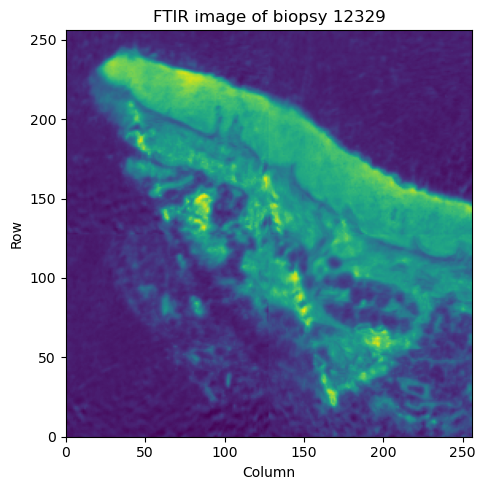

 
Plot raw spectrum: choose pixel
Min value of col_NT 25, max value 255
Min value of row_NT 115, max value 238
Plot raw spectrum in pixel, row 160 column 154


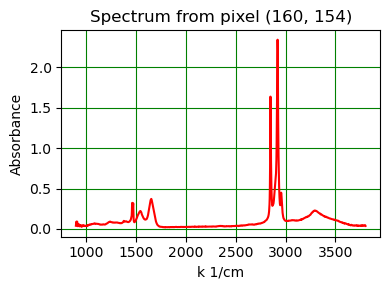

 
Plot processed spectrum in particular pixel, row 160 column 154
 


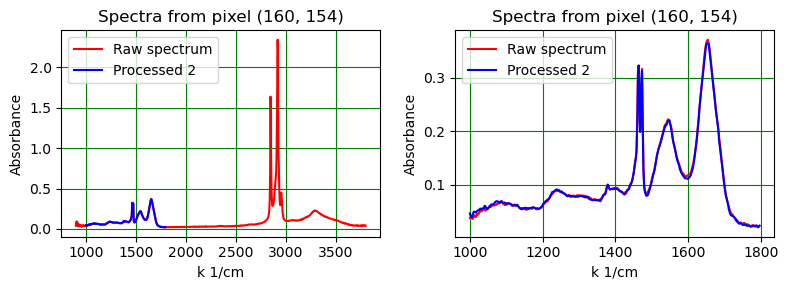

 
Plot FTIR image with N/T pixels marked
 


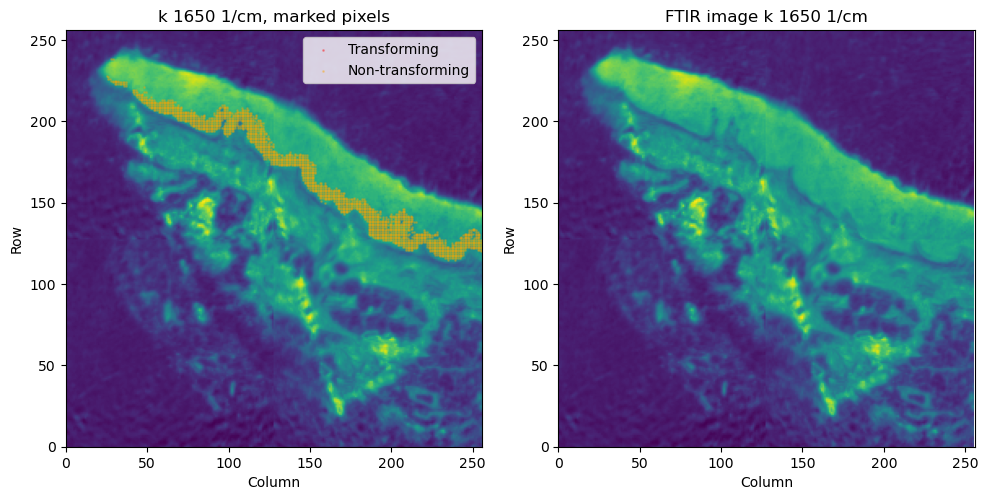

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 5.83e-02
 


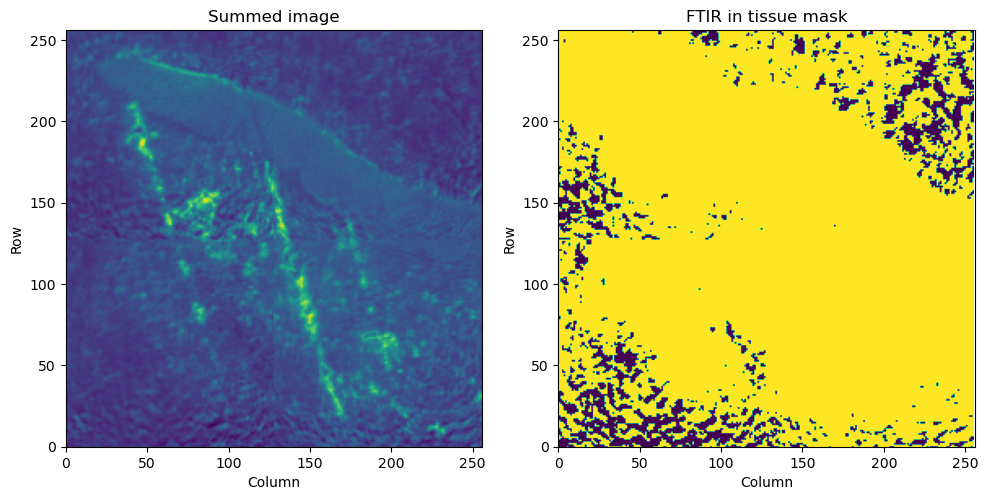

 
Make N/T mask
 


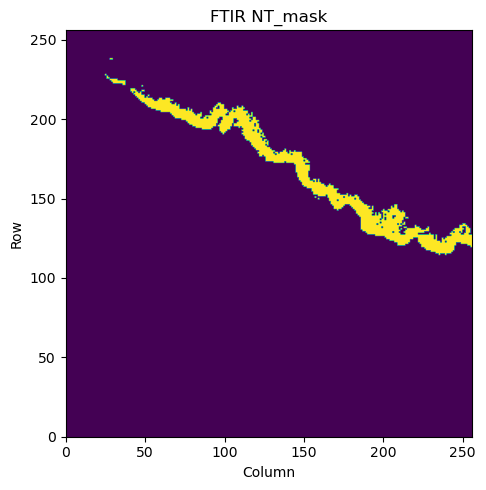

 
 
Plot spectra from N/T pixels


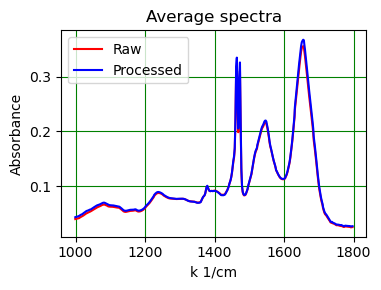

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -4.13e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 58982
Number of pixels in in_tissue_NT spectrum 2344
Number of pixels in in_tissue_notNT spectrum 56638
Number of pixels in out_mask spectrum 6554
 


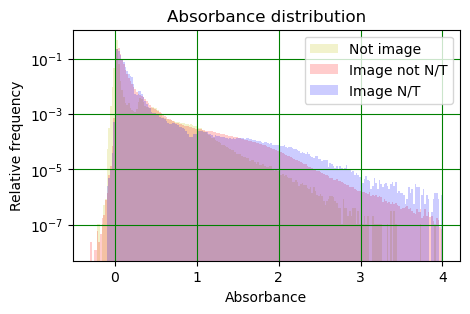

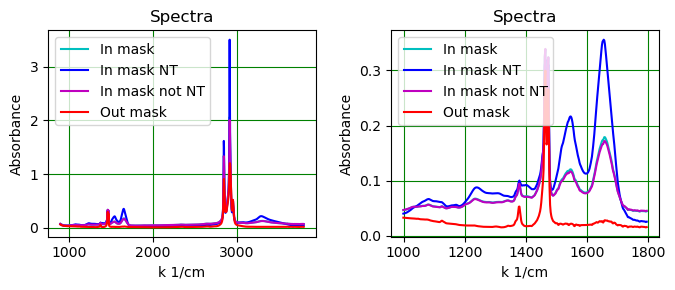

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


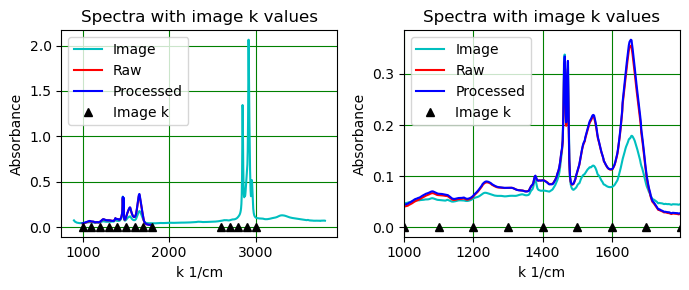

 
Make X_D and y_D arrays
 
Biopsy 15
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 15 and label 12330
Non-transforming area 1195 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12330
Shape of FTIR image (128, 128, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 128 columns


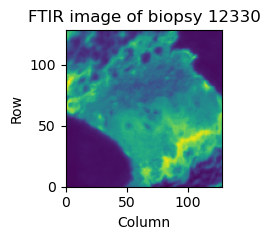

 
Plot raw spectrum: choose pixel
Min value of col_NT 32, max value 124
Min value of row_NT 45, max value 87
Plot raw spectrum in pixel, row 67 column 81


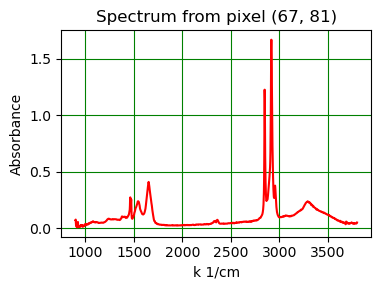

 
Plot processed spectrum in particular pixel, row 67 column 81
 


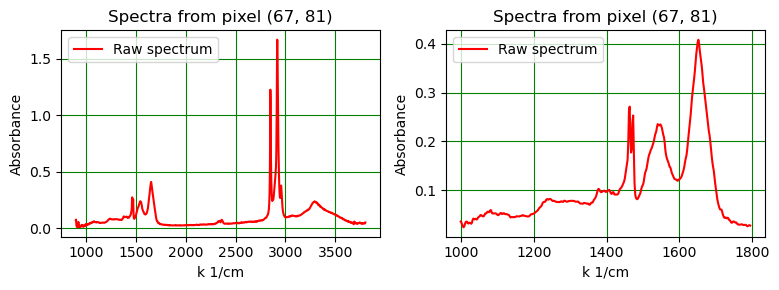

 
Plot FTIR image with N/T pixels marked
 


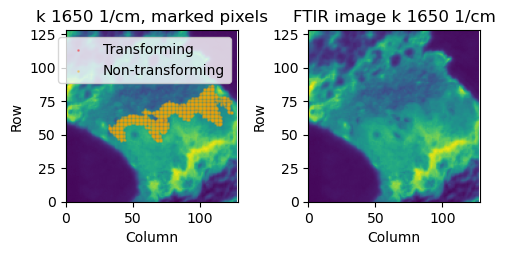

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 3.94e-03
 


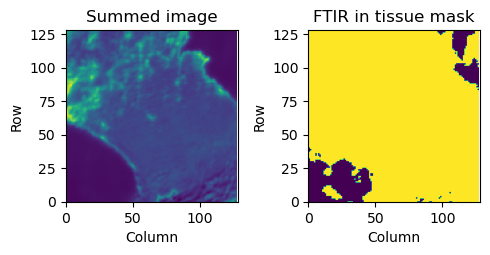

 
Make N/T mask
 


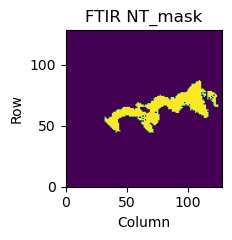

 
 
Plot spectra from N/T pixels


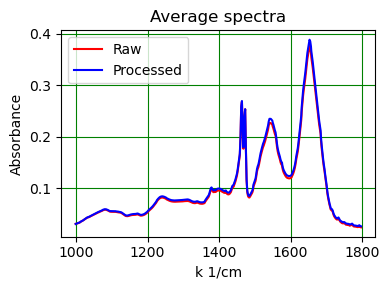

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -2.94e-01
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 14745
Number of pixels in in_tissue_NT spectrum 1195
Number of pixels in in_tissue_notNT spectrum 13550
Number of pixels in out_mask spectrum 1639
 


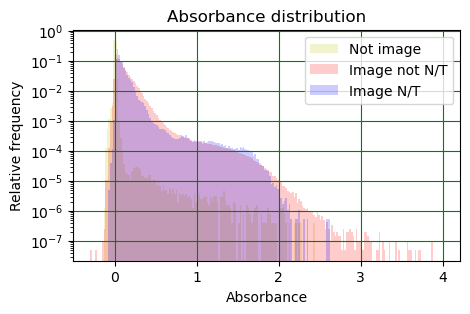

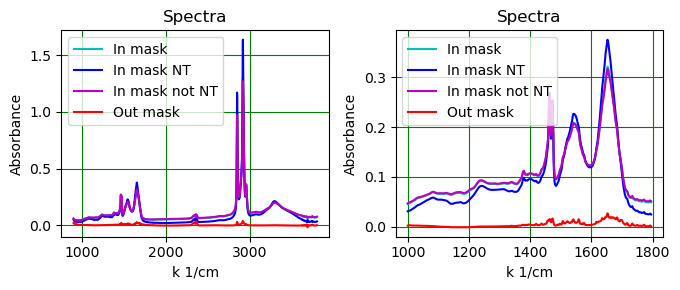

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


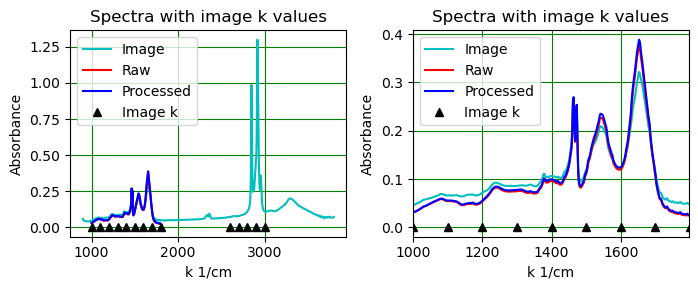

 
Make X_D and y_D arrays
 
Biopsy 16
 
Select biopsy for study
Number of biopsies available is 17
Chosen biopsy has index 16 and label 12332
Non-transforming area 887 pixels.
Transforming area 0 pixels.
Biopsy type 1
 
 
Get FTIR data
Looking at biposy with label 12332
Shape of FTIR image (128, 256, 1506)
Number of wavenumbers 1506
 
Plot FTIR image at wavenumber  1650.0  1/cm
FTIR image has 128 rows and 256 columns


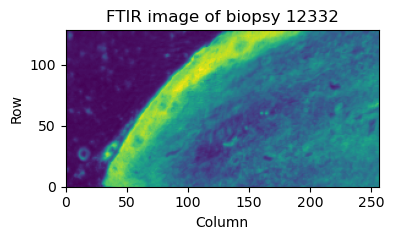

 
Plot raw spectrum: choose pixel
Min value of col_NT 48, max value 186
Min value of row_NT 0, max value 127
Plot raw spectrum in pixel, row 65 column 91


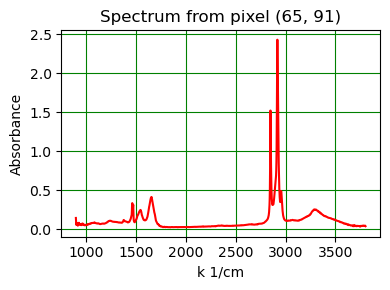

 
Plot processed spectrum in particular pixel, row 65 column 91
 


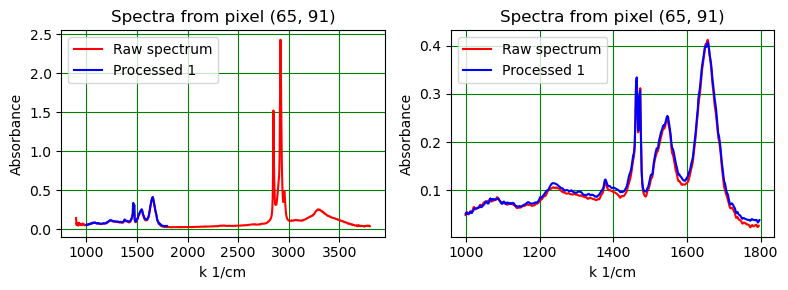

 
Plot FTIR image with N/T pixels marked
 


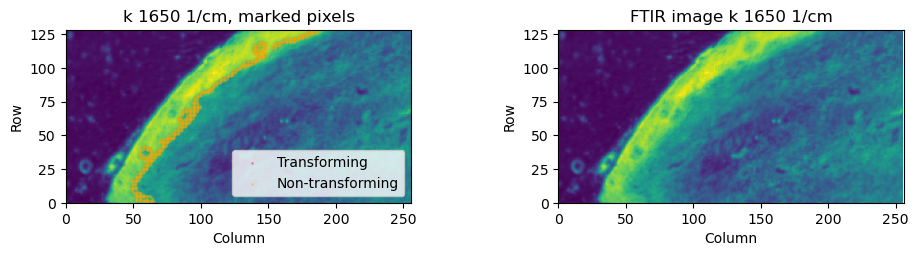

 
Make tissue mask
Quantile for threshold 0.10, absorbance for threshold 6.37e-02
 


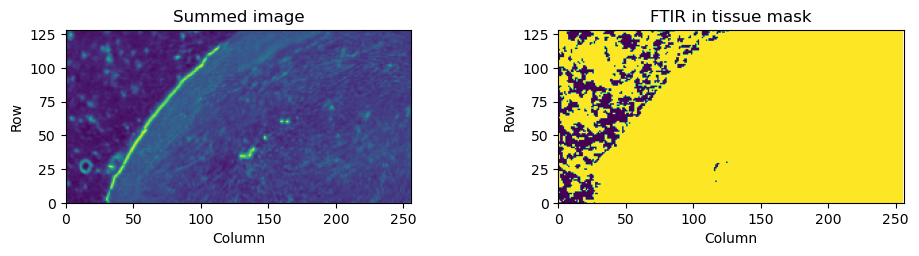

 
Make N/T mask
 


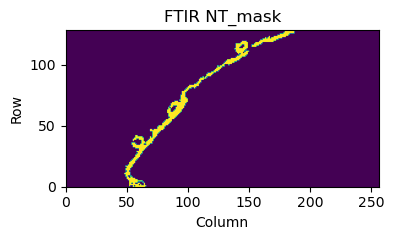

 
 
Plot spectra from N/T pixels


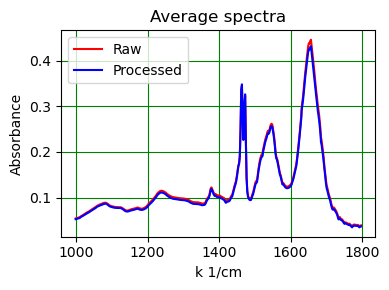

 
Plot absorbance distribution at selected wavenumbers in/out of tissue, and N/T regions
Minimum absorbance -1.48e+00
Maximum absorbance 8.00e+00
 
 
Plot spectra in/out of tissue and N/T regions
Number of pixels in in_tissue spectrum 29491
Number of pixels in in_tissue_NT spectrum 887
Number of pixels in in_tissue_notNT spectrum 28604
Number of pixels in out_mask spectrum 3277
 


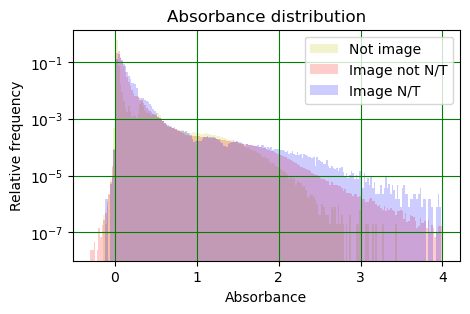

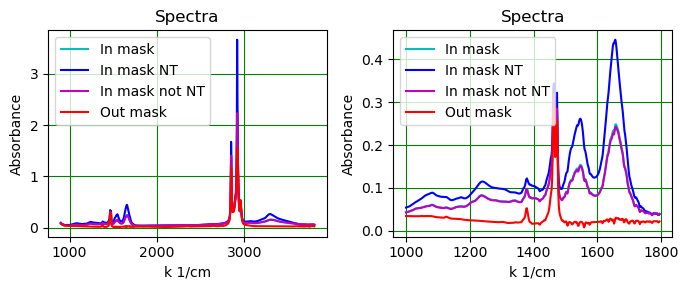

 
Plot image using a range of wavenumbers
Number of columns in plot 3, number of rows 5
 


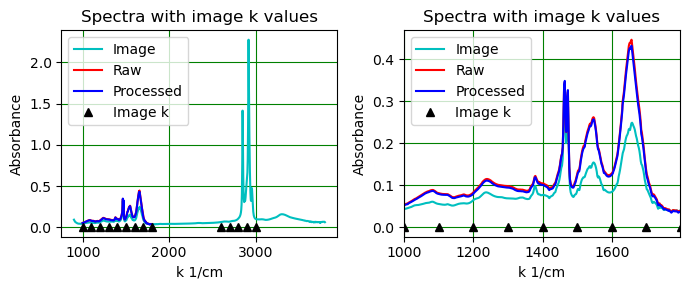

 
Make X_D and y_D arrays
 
Make training and test arrays
X_train_raw.shape (392534, 622) y_train.shape (392534,)
X_test_raw.shape (167791, 622) y_test.shape (167791,)
 
Make and train MLP, or load and further train MLP
 
Iteration 0
Create file Barney-0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-global-ratio-scale-SKwgts-622-60-60-60-60-3-Dev.pkl
Training set score 0.9823429308034464
Training set loss 0.03737943931027525
 


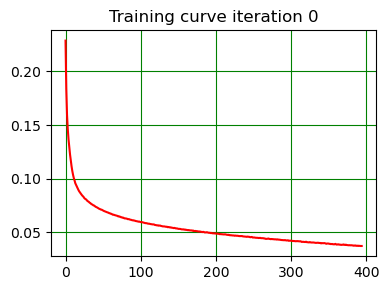

 
Save file Barney-0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-global-ratio-scale-SKwgts-622-60-60-60-60-3-Dev.pkl
 
Iteration 1
Load file Barney-0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-global-ratio-scale-SKwgts-622-60-60-60-60-3-Dev.pkl
Training set score 0.987374342095207
Training set loss 0.03850212947065771
 


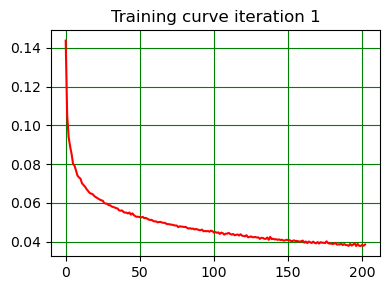

 
Save file Barney-0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-global-ratio-scale-SKwgts-622-60-60-60-60-3-Dev.pkl
 
Test MLP
Training dataset biopsies 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16
Same MLP model used for test, biopsies 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16
File: Barney-0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-global-ratio-scale-SKwgts-622-60-60-60-60-3-Dev.pkl
 
X_test_MLP.shape (167791,)
 
Test data
 


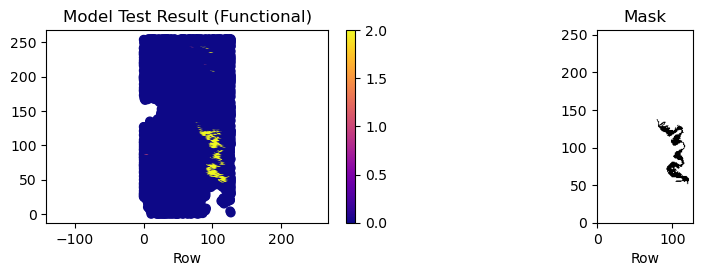

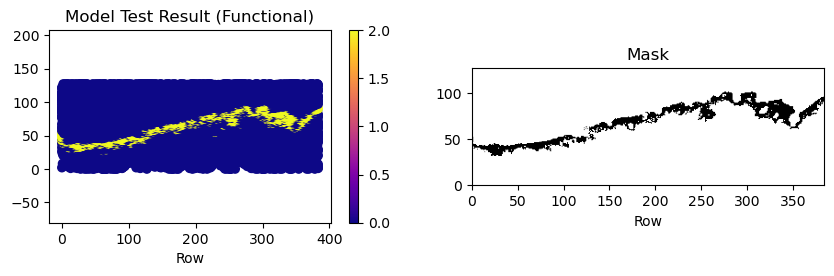

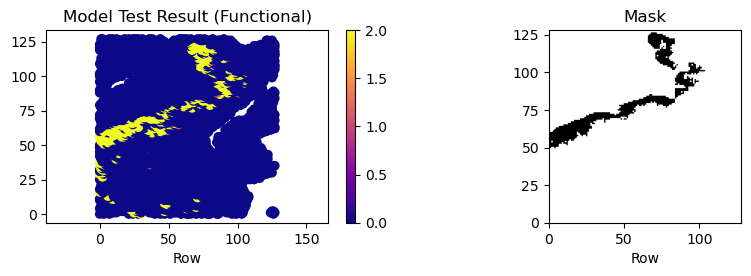

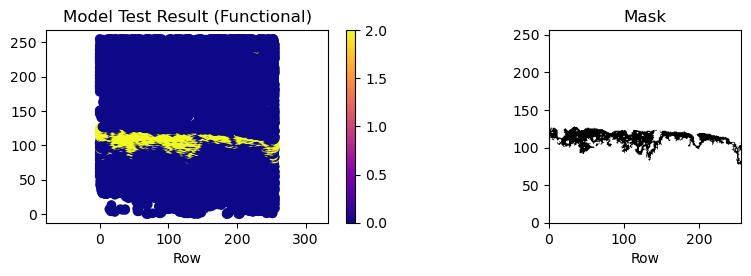

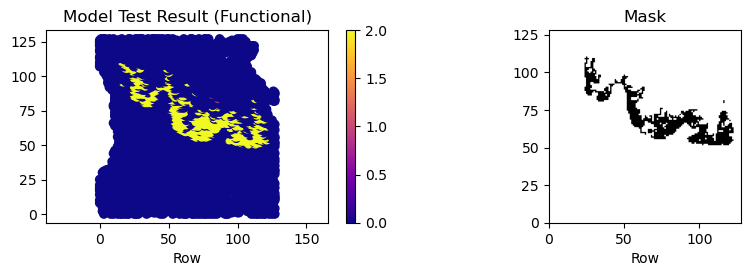

...

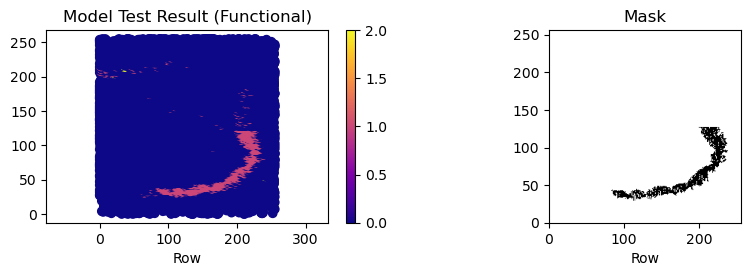

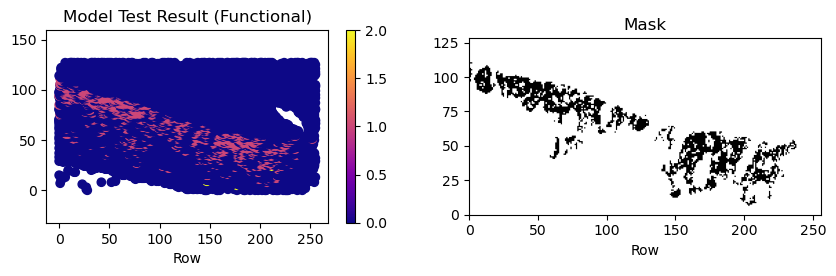

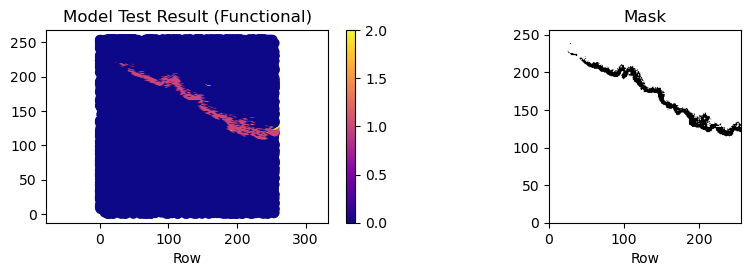

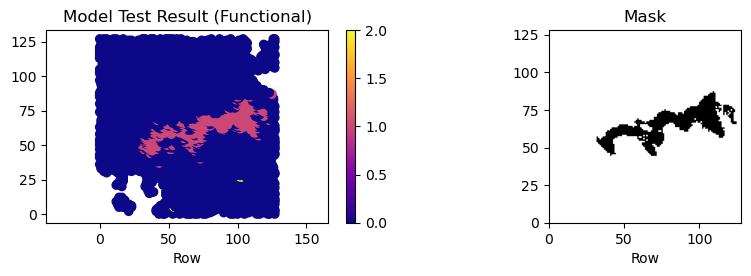

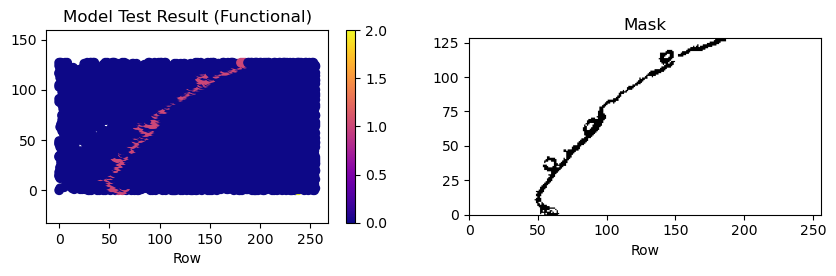

 
MLP trained using biopsies [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Confusion matrix for biopsy 0, type 2
 
Calculate confusion matrix
 
Confusion matrix 
 [[8.567e+03 3.000e+00 4.600e+01]
 [0.000e+00 0.000e+00 0.000e+00]
 [8.100e+01 0.000e+00 2.270e+02]]
 
Diagonality 0.982
True positive rate 0.737
True negative rate 0.995
 
MLP trained using biopsies [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Confusion matrix for biopsy 1, type 2
 
Calculate confusion matrix
 
Confusion matrix 
 [[11877.     0.   194.]
 [    0.     0.     0.]
 [  122.     0.   951.]]
 
Diagonality 0.981
True positive rate 0.886
True negative rate 0.984
 
MLP trained using biopsies [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Confusion matrix for biopsy 2, type 2
 
Calculate confusion matrix
 
Confusion matrix 
 [[3.918e+03 5.000e+00 9.400e+01]
 [0.000e+00 0.000e+00 0.000e+00]
 [7.800e+01 1.000e+00 2.220e+02]]
 
Diagonality 0.963
True positive rate 0.738
True negative 

In [29]:
import datetime
now = datetime.datetime.now()
an_start = now
print("Date and time ",str(now))
#
all_plots = False
no_plots = True
run_NN = False # Applies if bio_list != bio_mod_list, otherwise False
#
# Set options
global_prod = True
global_sum = False
local_ratio = False
local_diff = False
scale_data = True
#
# Check options are compatible!
if global_prod and global_sum:
    print(" ")
    print("Global normalisation options incorrect, stop")
    sys.exit(0)
if local_ratio and local_diff:
    print(" ")
    print("Local normalisation options incorrect, stop")
    sys.exit(0)
if (global_prod or global_sum) and (local_ratio or local_diff):
    print(" ")
    print("Both global and local normalisation set, stop")
    sys.exit(0)
#
# All biopsies, 0...9 (Transforming), 10...16 (Non-transforming)
#
# Test lists
#bio_list = [0, 10]
#bio_mod_list = [0, 10]
#bio_list = [1, 11]
#bio_mod_list = [1, 11]
#
# Set one
# bio_list = [0, 1, 2, 3, 4, 10, 11, 12, 13]
# bio_mod_list = [0, 1, 2, 3, 4, 10, 11, 12, 13]
#
# Set two
#bio_list = [5, 6, 7, 8, 9, 14, 15, 16]
#bio_mod_list = [5, 6, 7, 8, 9, 14, 15, 16]
#
# Set three
#bio_list = [0, 1, 2, 3, 4, 10, 11, 12, 13]
#bio_mod_list = [5, 6, 7, 8, 9, 14, 15, 16]
#
# Set four
#bio_list = [5, 6, 7, 8, 9, 14, 15, 16]
#bio_mod_list = [0, 1, 2, 3, 4, 10, 11, 12, 13]
#bio_mod_list = [0, 1, 2, 3, 4, 10, 11, 12, 13]
#
# Set five
bio_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
bio_mod_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
#
# Set six
# bio_list = [9, 16]
# bio_mod_list = [9, 16]
#
run_NN = run_NN and bio_list == bio_mod_list
#
file_label = []
if global_prod:
    file_label.append('-global-ratio')
elif global_sum:
    file_label.append('-global-sum')
elif local_ratio:
    file_label.append('-local-ratio')
elif local_diff:
    file_label.append('-local-diff')
else:
    file_label.append('-no-norm')
if scale_data:
    file_label.append('-scale')
else:
    file_label.append('-no-scale')
file_label = str(file_label).replace(", ", "")
file_label = file_label.replace("'", "")[1:-1]
print(" ")
print("File label is",file_label)
#
n_bio_list = len(bio_list)
n_rows_bio = np.zeros(n_bio_list).astype(int)
n_cols_bio = np.zeros(n_bio_list).astype(int)
bio_type = np.zeros(n_bio_list).astype(int)
#
n_rows_max = 512
n_cols_max = 512
in_tissue_bio = np.zeros((n_bio_list, n_rows_max, n_cols_max)).astype(bool) 
NT_mask_bio = np.zeros((n_bio_list, n_rows_max, n_cols_max)) 
#
print(" ")
print("Start multi-biopsy analysis")
print("List of biopsies is:",str(bio_list)[1:-1])
print(" ")
print("Biopsy",bio_list[0])
#
# Select wavenumbers for NN and MLP analysis
use_list = False
#
# Create list of wavenumbers to use
#k_min = min(wavenumbers)
#k_max = max(wavenumbers)
# k_min = 1000
# k_max = 1800
k_min = 2500
k_max = 3700
#
k_list = []
#
if use_list:
    k_list.append(1080)
    k_list.append(1340)
    k_list.append(1375)
    k_list.append(1465)
    k_list.append(1535)
    k_list.append(1655)
    k_list.append(1750)
    k_list.append(2850)
    k_list.append(2915)
    k_list.append(2930)
    k_list.append(3280)
#
#
# Select first biopy an model used for testing
nb = 0
i_bio = bio_list[nb]
n_biopsies, bio_label, row_T, col_T, row_NT, col_NT, b_type = select_image(i_bio)
bio_type[nb] = b_type
#
# Get FTIR data
FTIR_file, FTIR, wavenumbers = get_file_and_cube(bio_label)
n_rows_bio[nb] = FTIR.shape[0]
n_cols_bio[nb] = FTIR.shape[1]
#
# Show absorbance at chosen wavenumber (e.g. 1650 cm-1 for amide)
k_image = 1650.0
k_index, n_rows, n_cols = plot_image(no_plots, k_image)
#
# Plot raw spectra
row_spect_raw, col_spect_raw, spectrum_raw = plot_raw_spectrum(no_plots, row_T, col_T, 
                                                               row_NT, col_NT)
#
# Plot processed spectra 
k_min_proc, k_max_proc, k_columns = plot_proc_spectrum(no_plots, bio_label, row_spect_raw, 
                                                       col_spect_raw, spectrum_raw)
#
# Plot FTIR image with N/T pixels marked
plot_FTIR_NTpix(no_plots, k_image, n_rows_bio[nb], n_cols_bio[nb])
#
# Make tissue mask
q_thresh = 0.1
k_low, k_high, in_tissue = make_tissue_mask(no_plots, q_thresh, n_rows, n_cols)
in_tissue_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb]] = \
    in_tissue[0:n_rows_bio[nb], 0:n_cols_bio[nb]]
#
# Make transforming/non-transforming mask
NT_mask = make_NT_mask(no_plots)
NT_mask_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb]] = NT_mask[0:n_rows_bio[nb], 0:n_cols_bio[nb]]
#
# Plot spectra in N/T regions for raw and processed data
NT_mask_spect_raw, NT_mask_spect_proc = plot_pixel_NT_spectra(no_plots, k_min_proc, k_max_proc, 
                                                              k_columns)
#
# Make histograms of absorbance distribiutions in tissue, N/T and non-tissue regions 
absorbance_hist(no_plots, k_low, k_high, in_tissue, NT_mask, n_rows, n_cols)
#
# Plot spectra in tissue, N/T and non-N/T regions 
in_tissue_spect, in_tissue_NT_spect, in_tissue_notNT_spect = plot_in_out_spectra(no_plots, 
                                                                                in_tissue,
                                                                                NT_mask, 
                                                                                k_min_proc, 
                                                                                k_max_proc,
                                                                                n_rows, n_cols)
#
# Make images at various k values
plot_multi_k_image(no_plots, all_plots, in_tissue_spect, NT_mask_spect_raw, NT_mask_spect_proc, 
                   k_min_proc, k_max_proc, n_rows, n_cols)
#
key_inds = select_wavenumbers(no_plots, NT_mask_spect_raw, NT_mask_spect_proc, 
                              k_list, k_min, k_max, k_min_proc, k_max_proc)
n_keys = len(key_inds)
#
X_D_bio = np.zeros((n_bio_list, n_rows_max, n_cols_max, n_keys))
y_D_bio = np.zeros((n_bio_list, n_rows_max, n_cols_max))
#
# Select data for this biopsy for NN amd MLP analysis (X_D and y_D arrays)
norm_cut = 1e-4
X_D, y_D = make_D_arrays(key_inds, in_tissue, NT_mask, global_prod, global_sum, 
                         local_ratio, local_diff, norm_cut, n_rows, n_cols, bio_type[nb])
#
# Plot X_D and y_D
no_plots = False
plot_X_D_arr(all_plots, X_D, y_D)
#
# Put together complete data set. Note that number of rows and columns is different for 
# each biopsy.
X_D_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb], :] = X_D[0:n_rows_bio[nb], 0:n_cols_bio[nb], :]
y_D_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb]] = y_D[0:n_rows_bio[nb], 0:n_cols_bio[nb]]
#
# Select other biopsies
no_plots = False
all_plots = False
for nb in range(1, n_bio_list):
    #
    i_bio = bio_list[nb]
    print(" ")
    print("Biopsy",i_bio)
    n_biopsies, bio_label, row_T, col_T, row_NT, col_NT, b_type = select_image(i_bio)
    bio_type[nb] = b_type
    #
    # Get FTIR data
    FTIR_file, FTIR, wavenumbers = get_file_and_cube(bio_label)
    n_rows_bio[nb] = FTIR.shape[0]
    n_cols_bio[nb] = FTIR.shape[1]
    #
    # Show absorbance at chosen wavenumber (e.g. 1650 cm-1 for amide)
    k_image = 1650.0
    k_index, n_rows, n_cols = plot_image(no_plots, k_image)
    #
    # Plot raw spectra
    row_spect_raw, col_spect_raw, spectrum_raw = plot_raw_spectrum(no_plots, row_T, col_T, 
                                                                   row_NT, col_NT)
    #
    # Plot processed spectra 
    k_min_proc, k_max_proc, k_columns = plot_proc_spectrum(no_plots, bio_label, row_spect_raw, 
                                                           col_spect_raw, spectrum_raw)
    #
    # Plot FTIR image with N/T pixels marked
    plot_FTIR_NTpix(no_plots, k_image, n_rows, n_cols)
    #
    # Make tissue mask
    q_thresh = 0.1
    k_low, k_high, in_tissue = make_tissue_mask(no_plots, q_thresh, n_rows, n_cols)
    in_tissue_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb]] = \
        in_tissue[0:n_rows_bio[nb], 0:n_cols_bio[nb]]
    #
    # Make transforming/non-transforming mask
    NT_mask = make_NT_mask(no_plots)
    NT_mask_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb]] = \
        NT_mask[0:n_rows_bio[nb], 0:n_cols_bio[nb]]
    #
    # Plot spectra in N/T regions for raw and processed data
    NT_mask_spect_raw, NT_mask_spect_proc = plot_pixel_NT_spectra(no_plots, k_min_proc, k_max_proc, 
                                                                  k_columns)
    #
    # Make histograms of absorbance distribiutions in tissue, N/T and non-tissue regions 
    absorbance_hist(no_plots, k_low, k_high, in_tissue, NT_mask, n_rows, n_cols)
    #
    # Plot spectra in tissue, N/T and non-N/T regions 
    in_tissue_spect, in_tissue_NT_spect, in_tissue_notNT_spect = \
        plot_in_out_spectra(no_plots, in_tissue, NT_mask, k_min_proc, k_max_proc, n_rows, n_cols)
    #
    # Make images at various k values
    plot_multi_k_image(no_plots, all_plots, in_tissue_spect, NT_mask_spect_raw, NT_mask_spect_proc, 
                       k_min_proc, k_max_proc, n_rows, n_cols)
    #
    # Select data for this biopsy for MLP amd NN analysis (X_D and y_D arrays)
    norm_cut = 1e-4
    X_D, y_D = make_D_arrays(key_inds, in_tissue, NT_mask, global_prod, global_sum, 
                             local_ratio, local_diff, norm_cut, n_rows, n_cols, bio_type[nb])
    X_D_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb], :] = X_D[0:n_rows_bio[nb], 0:n_cols_bio[nb], :]
    y_D_bio[nb, 0:n_rows_bio[nb], 0:n_cols_bio[nb]] = y_D[0:n_rows_bio[nb], 0:n_cols_bio[nb]]
    #
    # Plot X_D and y_D
    no_plots = False
    plot_X_D_arr(all_plots, X_D, y_D)
#
# Plot X_D and y_D
no_plots = False
plot_X_D_arr(all_plots, X_D_bio, y_D_bio)
#
# Do NN analysis: nns is number of nearest neighbours sought by NearestNeighbours, 
# nns_plot is number of these that are plotted
if run_NN: 
    nns = 3
    nns_plot = min(2, nns - 1)
    for b_type in range(1, 3):
        print(" ")
        print(f"NN analysis biopsy type {b_type}")
        #
        # Select data correspondong to biopsy type N or T
        bool_type = bio_type == b_type
        n_type = np.sum(bool_type).astype(int)
        #
        # Create arrrays to hold data for this biopsy type
        X_D_bio_here = np.zeros((n_type, n_rows_max, n_cols_max, n_keys))
        y_D_bio_here = np.zeros((n_type, n_rows_max, n_cols_max))
        in_tissue_here = np.zeros((n_type, n_rows_max, n_cols_max)).astype(bool)     
        n_rows_here = np.zeros(n_rows_max).astype(int)     
        n_cols_here = np.zeros(n_cols_max).astype(int)
        bio_list_here = np.zeros(n_type).astype(int)
        #
        # Fill the arrays
        n_bio_here = 0
        for nb in range(0, n_bio_list):
            if bio_type[nb] == b_type:
                X_D_bio_here[n_bio_here, :, :, :] = X_D_bio[nb, :, :, :]
                y_D_bio_here[n_bio_here, :, :] = y_D_bio[nb, :, :]
                n_rows_here[n_bio_here] = n_rows_bio[nb]
                n_cols_here[n_bio_here] = n_cols_bio[nb]
                in_tissue_here[n_bio_here, :, :] = in_tissue_bio[nb, :, :]
                bio_list_here[n_bio_here] = bio_list[nb]
                n_bio_here += 1
            #
        # Carry out NN analysis using this data.
        NN_analysis_one(no_plots, key_inds, nns, nns_plot, 
                        n_bio_here, n_rows_here, n_cols_here, in_tissue_here, 
                        X_D_bio_here, y_D_bio_here, bio_list_here, b_type)
#
# Create train and test data sets
X_train, y_train, X_test, y_test, r_train, c_train, b_train, r_test, c_test, b_test = \
    X_D_split_scale(scale_data, key_inds, in_tissue_bio, 
                    X_D_bio, y_D_bio,n_rows_bio, n_cols_bio)
#
# Plot train and test data sets.
plot_train_test_data(all_plots)
#
# Make and train MLP
#n_iter = 2
#hidden_layers = make_and_train_MLP(n_iter, key_inds, file_label)
#
# Make and train MLP. (Looks as though SKlearn covergence criteria work well, 
# probably need only 1 iteration!)
n_iter = 2
hidden_layers = make_and_train_MLP(n_iter, key_inds, file_label)
#
# Test MLP as trained on this biopsy or using model trained on an alternative biopsy
X_test_MLP = test_MLP(no_plots, bio_list, bio_mod_list, hidden_layers, 
                      n_rows_bio, n_cols_bio, b_test, NT_mask_bio, file_label)
#
# Calculate confusion matrix for MLPs
no_plots = True
for nb in range(0, n_bio_list):
    print(" ")
    if n_bio_list < 2:
        print(f"MLP trained using biopsy",bio_list)
    else:
        print(f"MLP trained using biopsies",bio_list) 
    print(f"Confusion matrix for biopsy {bio_list[nb]}, type {bio_type[nb]}") 
    bool_pix = b_test == nb
    X_test_here = X_test_MLP[bool_pix]
    y_test_here = y_test[bool_pix]
    confMat_MLP, diag_MLP, TPR_MLP, TNR_MLP = \
        calc_confusion(no_plots, X_test_here, y_test_here, bio_type[nb])
no_plots = False
#
# Optimise k for KNN
#k_max = 10
#score_avg, score_rms = optimize_k(no_plots, k_max)
#
# Make and train KNN classifier
# n_neighbours = 7
# make_and_train_KNN(no_plots, n_neighbours, file_label)
# #
# # Test KNN as trained on this biopsy or using model trained on an alternative biopsy
# X_test_KNN = test_KNN(no_plots, bio_list, bio_mod_list, n_neighbours,
#                       n_rows_bio, n_cols_bio, b_test, NT_mask_bio, file_label)
# #
# # Calculate confusion matrix for KNN
# no_plots = True
# for nb in range(0, n_bio_list):
#     print(" ")
#     if n_bio_list < 2:
#         print(f"KNN trained using biopsy",bio_list)
#     else:
#         print(f"KNN trained using biopsies",bio_list) 
#     print(f"Confusion matrix for biopsy {bio_list[nb]}, type {bio_type[nb]}") 
#     bool_pix = b_test == nb
#     X_test_here = X_test_KNN[bool_pix]
#     y_test_here = y_test[bool_pix]
#     confMat_KNN, diag_KNN, TPR_KNN, TNR_KNN = \
#         calc_confusion(no_plots, X_test_here, y_test_here, bio_type[nb])
# no_plots = False
#
then = now
now = datetime.datetime.now()
print(" ")
print("Date and time",str(now))
print("Time since last check is",str(now - then))
print("Time since analysis start is",str(now - an_start))
print("Time since notebook start is",str(now - nb_start))